In [5]:
#importing useful packages
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors
from matplotlib.patches import Ellipse
from scipy.ndimage import rotate
from astropy import units as u
import pandas as pd
from astropy.io import fits
import astropy.units as u
import astropy.constants as C
from scipy.optimize import curve_fit

from tqdm import tqdm
import os
%matplotlib inline


In [6]:
# making sure the current working directory
os.getcwd()

'/lustre/astro/lkv791/thesis/codes'

In [7]:
# This is if the data being saved somewhere else, define the new directory for data
direct = '/lustre/astro/lkv791/thesis/data/'
direct


'/lustre/astro/lkv791/thesis/data/'

In [8]:
cube = 'Ced110IRS4_SBLB_C18O_robust_0.5.pbcor.fits'
#cube = 'Ced110IRS4_SBLB_13CO_robust_0.5.pbcor.fits'
#importing and defining datacube
def datacube(data):
    CO = fits.open(direct+data)
    #CO = fits.open(dat+'Ced110IRS4_SBLB_13CO_robust_0.5.pbcor.fits')

    data_CO = CO[0].data
    header_CO = CO[0].header
    #header_CO  #extracting the header info
    print(cube)
    print(data_CO.shape)
    return data_CO, header_CO


#1 usually these data are huge, one can use Carta to create a smaller region
        # this smaller region is saved in .crtf file
    
#2 then this smaller region can be exportet as fits file with help of Casa
data_CO, header_CO = datacube(cube)


Ced110IRS4_SBLB_C18O_robust_0.5.pbcor.fits
(120, 4000, 4000)


In [9]:
#============== FREQUENCY AND VELOCITY CONVERSION ================#

#define frequency (number of channels(from 0) + 1 - reference pixel)*value (pixel) + value of reference pixel (GHz)
freq_CO = ((np.arange(header_CO['NAXIS3'])+1-header_CO['CRPIX3'])*header_CO['CDELT3']+header_CO['CRVAL3'])#/1e9

#speed of light [km/s]
c = C.c.cgs.value * 1e-5
#rest freguency [Hz]
f_0_CO = header_CO['RESTFRQ']
#measured frequency [Hz]
f_meas_CO = freq_CO#*1e9

#measured wavelength [m]
lambda_meas_CO = c/f_meas_CO
#rest wavelength [m]
lambda_0_CO = c/f_0_CO

#delta wavelength [m]
delta_lambda_CO = lambda_meas_CO - lambda_0_CO

#radial velocity [km/s] v = c * delta_lambda/lambda 0
v_CO = c * (delta_lambda_CO/lambda_0_CO)

delta_freq_CO = freq_CO[0] - freq_CO[1] #frequency width

#convert to velocity
delta_v_CO = v_CO[1]-v_CO[0] #velocity width

#integrated emission (Jy/beam km/s)
int_emis_CO_L = data_CO[20:60,:,:].sum(axis=0) * delta_v_CO  #these regions has been chosen via CARTA
int_emis_CO_R = data_CO[60:100,:,:].sum(axis=0) * delta_v_CO
    

In [10]:
header_CO

SIMPLE  =                    T /Standard FITS                                   
BITPIX  =                  -32 /Floating point (32 bit)                         
NAXIS   =                    3                                                  
NAXIS1  =                 4000                                                  
NAXIS2  =                 4000                                                  
NAXIS3  =                  120                                                  
EXTEND  =                    T                                                  
BSCALE  =   1.000000000000E+00 /PHYSICAL = PIXEL*BSCALE + BZERO                 
BZERO   =   0.000000000000E+00                                                  
BMAJ    =   3.179636487416E-05                                                  
BMIN    =   2.274442843615E-05                                                  
BPA     =  -8.994931199112E+00                                                  
BTYPE   = 'Intensity'       

In [11]:
#============== NOISE ================

#Defining noise (region of integrated emission map toward one of the edge)
background_CO_L = int_emis_CO_L[1000:1200,1000:1200]  #Left side / blue shifted disk
background_CO_R = int_emis_CO_R[1300:1600,1300:1600]  #Rightt side / red shifted disk


#in the case of the sum of noise giving 0, the rms is the same as std.
sigma_rms_CO_L = np.sqrt(np.mean(background_CO_L**2))  
sigma_rms_CO_R = np.sqrt(np.mean(background_CO_R**2))

In [12]:
#=========== MAP COORDINATES (offset) ===========

#defining arcseconds on axes with source at origin
xaxis_CO = ((np.arange(header_CO['NAXIS1'])+1-(header_CO['CRPIX1']))*header_CO['CDELT1']*60.0**2)#+0.27)
yaxis_CO = (np.arange(header_CO['NAXIS2'])+1-(header_CO['CRPIX2']))*header_CO['CDELT2']*60.0**2#+0.11
vaxis2 = (np.arange(header_CO['NAXIS3'])-(header_CO['CRPIX3']-1))*header_CO['CDELT3']/1000.0+header_CO['CRVAL3']/1000.0

#meshgrid
X_CO, Y_CO = np.meshgrid(xaxis_CO, yaxis_CO)

#defining beam in arcsec
bmaj = header_CO['BMAJ']*3600
bmin = header_CO['BMIN']*3600

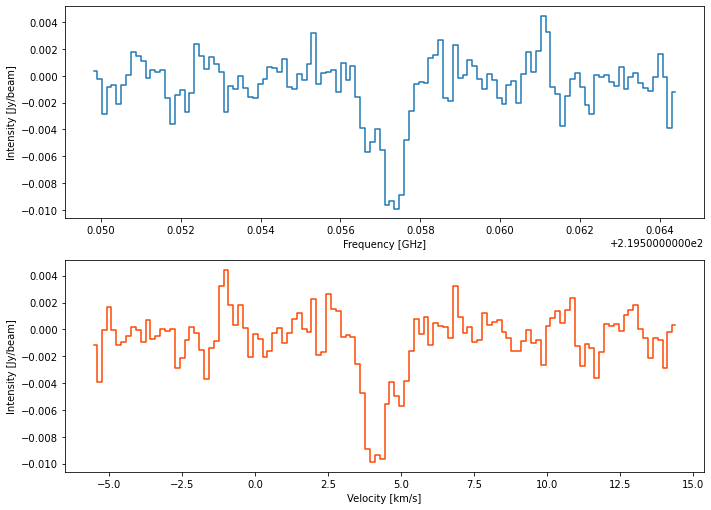

In [13]:
#plotting (go from Jy to Jy/beam??)
plt.figure(2, figsize = (10,7))
plt.subplot(211)
plt.plot((freq_CO*1e-9), data_CO[:,2000,2000],drawstyle='steps-mid') #[stokes,freq,posx, posy]
plt.xlabel('Frequency [GHz]')
plt.ylabel('Intensity [Jy/beam]')

plt.subplot(212)
plt.plot(v_CO, data_CO[:,2000,2000],drawstyle='steps-mid', color = 'OrangeRed')
plt.tight_layout()
plt.xlabel('Velocity [km/s]')
plt.ylabel('Intensity [Jy/beam]')
#plt.savefig('I_vs_vel.png')
plt.show();

## Plotting the contours (Disc)

In [14]:
def contourplot(emisL,sigmaL, emisR, sigmaR):
    #plotting
    plt.figure(1, figsize = (10,7))
    ax1 = plt.contourf(X_CO, Y_CO, emisL[:,:]+emisR[:,:], np.arange(-0.025,0.03,0.009))#, levels = np.arange(-1,5,0.1))
    #plt.contourf(X_CO, Y_CO, emisR[:,:], np.arange(-0.025,0.03,0.009))#, levels = np.arange(-1,5,0.1))
    #plt.contour(X_CO, Y_CO, emisL, np.arange(2*sigmaL,10*sigmaL,sigmaL), linewidths = 1, colors = 'blue')
    #plt.contour(X_CO, Y_CO, emisR, np.arange(2*sigmaR,10*sigmaR,sigmaR), linewidths = 1, colors = 'red')
    
    #adding beam with Position Angle -2.375362396240E+01 (added 90 to get)
    plt.gca().add_patch(Ellipse((4, -4), width=bmaj, height=bmin, edgecolor='white', angle = 90+header_CO['BPA'], facecolor='none', linewidth=1.40))

    plt.xlabel('RA offset (arcsec.)')
    plt.ylabel('DEC offset (arcsec.)')

    plt.xlim(-0.7,0.7)
    plt.ylim(-0.7,0.7)

    #colorbar
    #cbar = plt.colorbar(ax1)
    #cbar.set_label('[Jy/beam km/s]', labelpad=25, y=0.5, rotation=270);


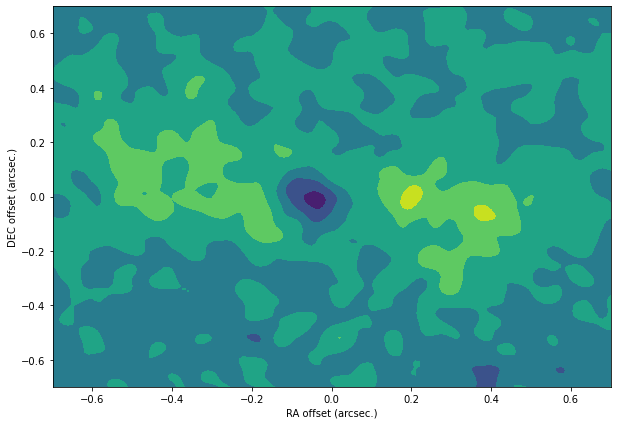

In [15]:
contourplot(int_emis_CO_L, sigma_rms_CO_L, int_emis_CO_R, sigma_rms_CO_R)

In [16]:
#contourplot(int_emis_CO_L, sigma_rms_CO_L, 'blue')

In [17]:
#contourplot(int_emis_CO_R, sigma_rms_CO_R, 'red')

In [18]:
#contourplot(int_emis_CO_R, sigma_rms_CO_R, 'red')
#contourplot(int_emis_CO_L, sigma_rms_CO_L, 'blue')

## loading the continuum data

In [19]:
continuum = 'Ced110IRS4_SBLB_continuum_robust_0.5.pbcor_5arcsec.fits'

def datacont(continuum):
    hdulist=fits.open(direct+continuum)
    data2d=hdulist[0].data
    header2d=hdulist[0].header
    return data2d, header2d

data2d, header2d = datacont(continuum)
#header2d


In [20]:

xaxis=(np.arange(header2d['NAXIS1'])-(header2d['CRPIX1']-1))*header2d['CDELT1']*60.0**2
yaxis=(np.arange(header2d['NAXIS2'])-(header2d['CRPIX2']-1))*header2d['CDELT2']*60.0**2
X, Y = np.meshgrid(xaxis, yaxis)


def plot2dcube():
    #plotting the continuum with contour
    #fig, (ax1, ax2) = plt.subplots(1, 2)
    plt.figure(figsize = (10,7))

    c1 = plt.contourf(X_CO, Y_CO,int_emis_CO_L[:,:],np.arange(-0.025,0.03,0.009))#, levels = np.arange(-1,5,0.1))
    c = plt.contour(X_CO, Y_CO,int_emis_CO_L, np.arange(2*sigma_rms_CO_L,10*sigma_rms_CO_L,sigma_rms_CO_L), linewidths = 1, colors='blue')

    c2 = plt.contourf(X_CO, Y_CO,int_emis_CO_R[:,:],np.arange(-0.025,0.024,0.008))#, levels = np.arange(-1,5,0.1))
    c = plt.contour(X_CO, Y_CO,int_emis_CO_R, np.arange(2*sigma_rms_CO_R,10*sigma_rms_CO_R,sigma_rms_CO_R), linewidths = 1, colors='red')

    #adding beam with Position Angle -2.375362396240E+01 (added 90 to get)
    plt.gca().add_patch(Ellipse((4, -4), width=bmaj, height=bmin, edgecolor='white', angle = 90+header_CO['BPA'], facecolor='none', linewidth=1.40))
    plt.xlabel('RA offset (arcsec.)')
    plt.ylabel('DEC offset (arcsec.)')

    plt.xlim(-0.7,0.7)
    plt.ylim(-0.5,0.7)

    plt.scatter(0, 0, color="k", marker="*")
    cx = plt.contourf(X,Y,data2d,100);

    #colorbar
    cbar = plt.colorbar(cx)
    cbar.set_label('[Jy/beam km/s]', labelpad=25, y=0.5, rotation=270);

    #plt.savefig('cont_cont.png')

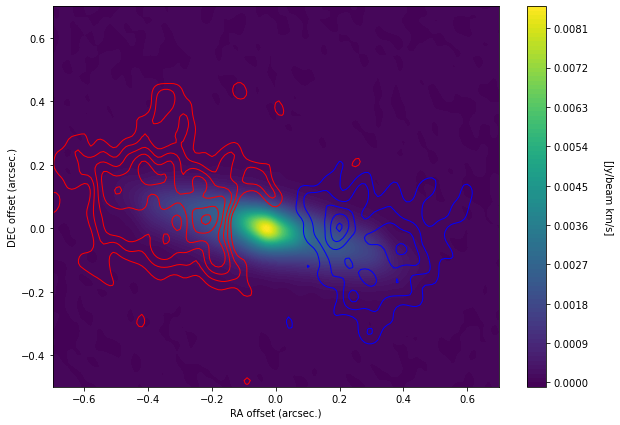

In [21]:
#contourplot(int_emis_CO_L, sigma_rms_CO_L, int_emis_CO_R, sigma_rms_CO_R)
plot2dcube()

## Calculating sigma / RMS, so we know that these contour are good enough

In [22]:
sigma_i = (np.mean([data_CO[100:119,1900:2100,1900:2100]**2]))**0.5
sigma_I = np.sqrt(40)*sigma_i*delta_v_CO
print('sigma:',sigma_I)
print('3sigma:',3*sigma_I)
print('6sigma:',6*sigma_I)

sigma: 0.0014947199500863167
3sigma: 0.00448415985025895
6sigma: 0.0089683197005179


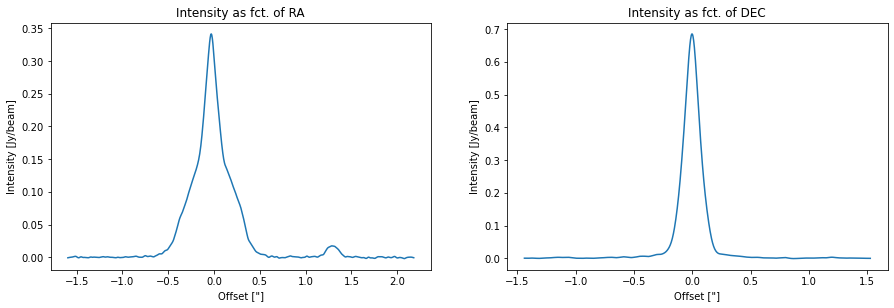

In [23]:
## Is there asymetry on the disc minor and major axis? 
## these to plots shows there is asymetry and this means that the object has some inclination

dx = data2d[370:600,:].sum(axis=0)
dy = data2d[:,255:915].sum(axis=1)

plt.figure(2, figsize = (15,10))

plt.subplot(221)
plt.plot(xaxis, dx)
plt.title('Intensity as fct. of RA')
plt.ylabel('Intensity [Jy/beam]')
plt.xlabel('Offset ["]');
#plt.savefig('IvsRA')

plt.subplot(222)
plt.plot(yaxis, dy)
plt.title('Intensity as fct. of DEC')
plt.ylabel('Intensity [Jy/beam]')
plt.xlabel('Offset ["]');
#plt.savefig('IvsDEC')

## Loading data after fitting a Gaussian via CASA

In [24]:
gauss = 'Ced110IRS4_SBLB_continuum_robust_0.5.pbcor_gauss.fits'
resid = 'Ced110IRS4_SBLB_continuum_robust_0.5.pbcor_residual.fits'

def GR(gauss, resid):
    #importing and defining data
    Gauss = fits.open(direct+gauss)
    data_G = Gauss[0].data
    header_G = Gauss[0].header
    #header_G

    #importing and defining data
    Residual = fits.open(direct+resid)
    data_R = Residual[0].data
    header_R = Residual[0].header
    #header_R

    plt.figure(2, figsize = (15,10))

    plt.subplot(221)
    plt.imshow(data_G)

    plt.title('Gaussian fit')
    plt.ylim(200,700)
    plt.xlim(200,950)
    plt.xlabel('RA offset ["]')
    plt.ylabel('DEC offset ["]')

    plt.subplot(222)
    plt.imshow(data_R)

    plt.title('Residual')
    plt.ylim(200,700)
    plt.xlim(200,950)
    plt.xlabel('RA offset ["]')
    plt.ylabel('DEC offset ["]')
    plt.show();
    #plt.savefig('GaussResid.png')
    return data_G, header_G, data_R, header_R

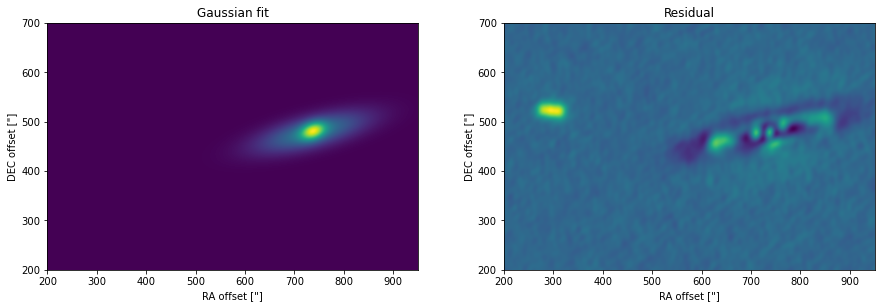

In [25]:
data_G, header_G, data_R, header_R = GR(gauss, resid)

In [26]:
# logfile of the fit
#file = 'gauss_values.txt'
file = 'gauss_values.txt'
with open(direct+file) as f:
    contents = f.read()
    print(contents)

****** Fit performed at Tue May 30 13:54:20 2023******

Input parameters ---
       --- imagename:           /Users/majiduzbak/Desktop/MSc/8.Prep-projekt/Data/Ced110IRS4_SBLB_continuum_robust_0.5.pbcor_5arcsec.fits
       --- region:              
       --- channel:             0
       --- stokes:              
       --- mask:                
       --- include pixel range: []
       --- exclude pixel range: []
       --- initial estimates:   Peak, X, Y, a, b, PA
                                0.01, 730, 470, 0.1arcsec, 0.03arcsec, -7deg
0.01, 730, 470, 0.1arcsec, 0.03arcsec, -7deg

*** Details of fit for channel number 0
Number of pixels used in fit: 59965
Input and residual image statistics (to be used as a rough guide only as to goodness of fit)
       --- Standard deviation of input image: 0.00118312 Jy
       --- Standard deviation of residual image: 7.82998e-05 Jy
       --- RMS of input image: 0.001353 Jy
       --- RMS of residual image: 7.8301e-05 Jy

Fit on Ced110IRS4_SBL

In [27]:
df = pd.read_csv(direct+'gauss_copy.txt',  sep = "\t", names = ['column1_name']) #,skiprows=15)
  
# display DataFrame

print(df['column1_name'][29])
print(df['column1_name'][30])
print(df['column1_name'][31])
print(df['column1_name'][33])
print(df['column1_name'][34])
print(df['column1_name'][35])
print(df['column1_name'][37])
print(df['column1_name'][38])



       --- major axis FWHM: 0.07 arcsec
       --- minor axis FWHM: 0.05 arcsec
       --- position angle: -7.37 deg
       --- major axis FWHM:     386.6 +/- 14.4 marcsec
       --- minor axis FWHM:     102.4 +/- 4.7 marcsec
       --- position angle: 103.95 +/- 0.89 deg
       --- Integrated:   83.0 +/- 3.0 mJy
       --- Peak:         5.85 +/- 0.19 mJy/beam


In [28]:
# Defining the results from logfile, use the deconvolved values 
#major = 113.51 #+/- 0.91 marcsec
#minor = 45.32 #+/- 0.94 marcsec
#FluxT = 14.68 #+/- 0.10 mJy
#peakF = 4.868 #+/- 0.027 mJy/beam
#Posangle = 104.67 #+/- 0.53 deg


major = 386.6 #+/- 0.91 marcsec
minor = 102.4 #+/- 0.94 marcsec
FluxT = 83.0 #+/- 0.10 mJy
#peakF = 5.85 #+/- 0.027 mJy/beam
Posangle = 103.95 #+/- 0.53 deg

In [29]:
# Inclination of the disc. by major and minor axis
InclRad = (np.arccos(minor/major))
InclDeg = InclRad * (180/np.pi)
print('Inclination in radians:', InclRad, 'inclination in degrees:',InclDeg) #this is the face on incklilnation of the source

Inclination in radians: 1.3027238474728402 inclination in degrees: 74.64057833123813


13.950000000000003


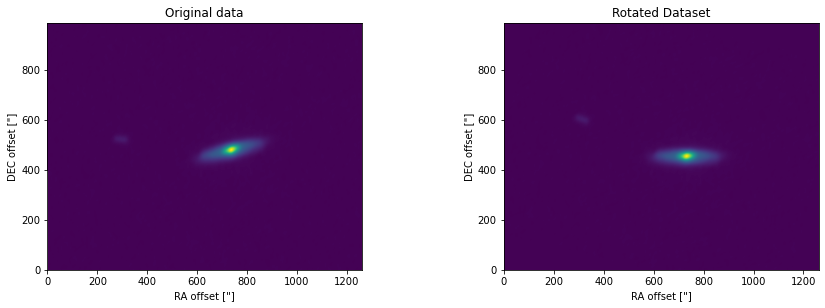

In [30]:
# Rotation angle in degrees
sys_Deg = Posangle-90 # inclination from the coordinate system, by using the poasition angle and substracting 90degrees
print(sys_Deg)
#reduced continuum data
hdulist=fits.open(direct+'Ced110IRS4_SBLB_continuum_robust_0.5.pbcor_5arcsec.fits')
data=hdulist[0].data


# Rotate the dataset with bilinear interpolation (order=1)
rotated_dataset = rotate(data, sys_Deg, reshape=False, order=1)

# plotting the before and after rotating the data
plt.figure(2, figsize = (15,10))

plt.subplot(221)
plt.imshow(data)
plt.gca().invert_yaxis()


plt.title('Original data')
plt.xlabel('RA offset ["]')
plt.ylabel('DEC offset ["]')

plt.subplot(222)
plt.imshow(rotated_dataset)

plt.title('Rotated Dataset')
plt.xlabel('RA offset ["]')
plt.ylabel('DEC offset ["]')
plt.gca().invert_yaxis()

plt.show();
#plt.savefig('rotate.png')

In [31]:
sys_Deg

13.950000000000003

# Kaufmann mass and column density
## Determining the kappa [cm^2 g^-1] for lambda 1300 [micrometer]

In [32]:
from scipy import interpolate

xx = np.array([350, 450, 850, 1120, 1200, 1200])  # micrometer
yy = [0.101, 0.0619, 0.0182, 0.0114, 0.0102, 0.0102]  # cm^2 g^-1
#f = interpolate.interp1d(xx, yy, fill_value = "extrapolate")
#print(f())


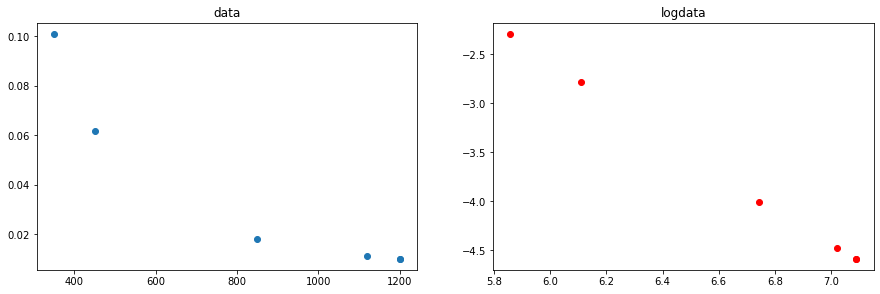

In [33]:
# plotting the before and after rotating the data
plt.figure(2, figsize = (15,10))

plt.subplot(221)
plt.scatter(xx,yy);
#plt.gca().invert_yaxis()


plt.title('data')
#plt.xlabel('RA offset ["]')
#plt.ylabel('DEC offset ["]')

plt.subplot(222)
plt.plot(np.log(xx),np.log(yy),'ro');

plt.title('logdata')
#plt.xlabel('RA offset ["]')
#plt.ylabel('DEC offset ["]')
#plt.gca().invert_yaxis()

plt.show();
#plt.savefig('rotate.png')

new value of kappa: 0.0086401 [cm^2 g^-1]


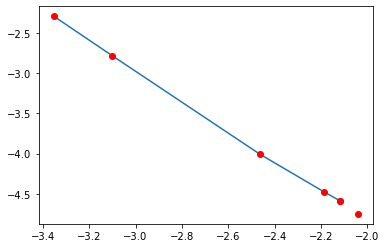

array([0.035, 0.045, 0.085, 0.112, 0.12 , 0.12 ])

In [34]:
def linear_fit(x, a, b):
    return a*x + b

#xx = np.log(np.array([350, 450, 850, 1120, 1200, 1200]))  # micrometer
xx = np.log(np.array([0.035, 0.045, 0.085, 0.112, 0.12, 0.12]))  # cm,converted from micrometer to cm
yy = np.log(np.array([0.101, 0.0619, 0.0182, 0.0114, 0.0102, 0.0102]))  # cm^2 g^-1

param, cova = curve_fit(linear_fit, xx, yy)
a, b= param
    
next_x = np.log(0.13)  #[cm]
next_y = linear_fit(next_x, a, b)
kappa_new = np.exp(next_y)
print('new value of kappa:', np.round(kappa_new,7), '[cm^2 g^-1]')
    
plt.plot(xx,yy)
plt.plot(np.append(xx,next_x),np.append(yy, next_y), 'ro')
plt.show()

np.exp(xx)

In [35]:
np.exp(next_y)

0.00864005605357338

In [36]:
bemaj = header2d['BMAJ']*3600
bemin = header2d['BMIN']*3600
HPBW = (bemaj + bemin) / 2
HPBW

0.059699449688202

In [39]:
"Kaufmann eq. 23 & 28"

peak = 3.466  # +/- 0.041 mJy/beam - taken from the Gaussian fit values, used in column density
#S_beam = peak # Is it ?
F = 77.37/1e3   # Jy from gaussian fit, used in mass disk
#HPBW = 5.55e-10 # taken from Obs. week 4 excercise, theta_HPBW ca.= pixel size
HPBW = HPBW #this can be read directly from the header, or the Gaussian fit values, <0.05 and 0.07> -> 0.06

#kappa = 1.84  # cm^2 g^-1 From Tobin
#kappa = kappa_new # linear fit
kappa = 0.023

lambd = 1.3 # mm, from 1300micrometer to mm
#lambd = 0.87

T43 = 43 # * u.K
T20 = 20 #* u.K

Dis = 189 #pc, 


def Kauf(T):
    
    exp = np.exp((1.439)*((lambd)**(-1))*((T/10)**(-1)))
    # Mass
    M = 0.12 * (exp - 1) * (kappa/0.01)**(-1) * (F) * (Dis/100)**2 * (lambd)**3  # [M_sun] Here i use the integrated flux
    #print('Mass disk:',M,'solarmass') #solarmass
    print('Mass disk:',(M*334672.021419),'Earthmass') #Earthmass

    # column density
    N_H2 = 2.02e20 * (exp - 1) *  (kappa/0.01)**(-1) * peak * ((HPBW/10)**(-2)) * (lambd)**3 # [cm^-2] here i use the peak
    print('Column density, N_H2:', N_H2,'cm^-2')
    return M, N_H2

M, NH2 = Kauf(T43)

Mass disk: 3112.758673137906 Earthmass
Column density, N_H2: 5.509191464905603e+24 cm^-2


In [40]:
M, NH2 = Kauf(T20)

Mass disk: 7837.871323420171 Earthmass
Column density, N_H2: 1.3872046738042058e+25 cm^-2


## Kappa from article: 2.3 cm2/g, kappa from fit: 0.0086 cm2/g

In [41]:


#FluxT = 77.37 #mJy
FluxT = 7.737e-28 * (u.kg)/ (u.s**2)

T_43 = 43 * u.K
T_20 = 20 * u.K

wav = 1.3 *u.mm #milimeter -> from 1300micrometer to mm
#wav = 0.87 * u.mm
wave = wav.to(u.m)

c = 2.99e8 * (u.m)/(u.s)
nu = c/wave

#kap = kappa_new * (u.cm**2 / u.g) #cm^2 g^-1
kap = 2.3 * (u.cm**2 / u.g)
kappa = kap.to(u.m**2 / u.kg)

Dpc = Dis *u.pc
D = Dpc.to(u.m)




In [43]:
"Tobin eq. 1 & Kaufmann eq. 27"

def dustM(T, x):
    if x ==1:
        T = T_20
    else:
        T = T_43
    #k_b = (1.380649e-16) * (u.cm**2 * u.g)/(u.s**2 * u.K)  #cm^2/g
    k_b = (1.380649e-23) * (u.m**2*u.kg)/(u.s**2 * u.K)     #m^2/kg
    
    # In the Rayleigh-Jeans limit, hν ≪ kBT ,this simplifies to
    B_planck = 2*(nu**2) * k_b * T / (c**2) 

    M_dust = ((D**2) * FluxT) / (kappa * B_planck)
    M_sun = 1.989e30 * u.kg 
    print(M_dust/ M_sun)
    #print(B_planck)
    return B_planck, M_dust


B_planck, M_dust = dustM(T_20, 1)


0.00017602652159992032


In [44]:
B_planck, M_dust = dustM(T_20, 2)

8.187280074414898e-05


In [45]:
def M_disk(x, y):
    if y==0:
        # Solar mass
        M_sun = 1.989e30 * u.kg 
        M_disc = M_dust / M_sun #solarmass
        #Mass dust in solarmasses
        print('Mass:', M_disc, 'solarmass')
    else:
        # Earth mass
        M_E = 5.97219e24 * u.kg  # kilograms
        M_dis = M_dust / M_E
        M_dis
        print('Mass:', M_dis, 'Earthmass')

In [46]:
M_disk(M_dust, 1)

Mass: 27.267216997468655 Earthmass


In [47]:
M_disk(M_dust, 0)

Mass: 8.187280074414898e-05 solarmass


# Dynamical mass (source), PV-diagram

In [43]:

x_cen = X_CO[0,int(len(X_CO[0])/2-200):int(len(X_CO[0])/2+200)]  #defining a region of around the center 200 Left and 200 right
v_cen = v_CO - np.mean(v_CO) 
np.sort(v_cen)

array([-9.93657638, -9.76958242, -9.60258826, -9.43559393, -9.2685994 ,
       -9.10160469, -8.9346098 , -8.76761472, -8.60061945, -8.43362399,
       -8.26662835, -8.09963253, -7.93263652, -7.76564032, -7.59864393,
       -7.43164736, -7.26465061, -7.09765366, -6.93065654, -6.76365922,
       -6.59666172, -6.42966403, -6.26266616, -6.0956681 , -5.92866986,
       -5.76167143, -5.59467281, -5.42767401, -5.26067502, -5.09367584,
       -4.92667648, -4.75967694, -4.5926772 , -4.42567728, -4.25867718,
       -4.09167689, -3.92467641, -3.75767575, -3.5906749 , -3.42367386,
       -3.25667264, -3.08967123, -2.92266964, -2.75566786, -2.58866589,
       -2.42166374, -2.2546614 , -2.08765888, -1.92065617, -1.75365327,
       -1.58665019, -1.41964692, -1.25264347, -1.08563983, -0.918636  ,
       -0.75163199, -0.58462779, -0.41762341, -0.25061884, -0.08361408,
        0.08339086,  0.25039599,  0.41740131,  0.58440681,  0.7514125 ,
        0.91841837,  1.08542443,  1.25243067,  1.4194371 ,  1.58

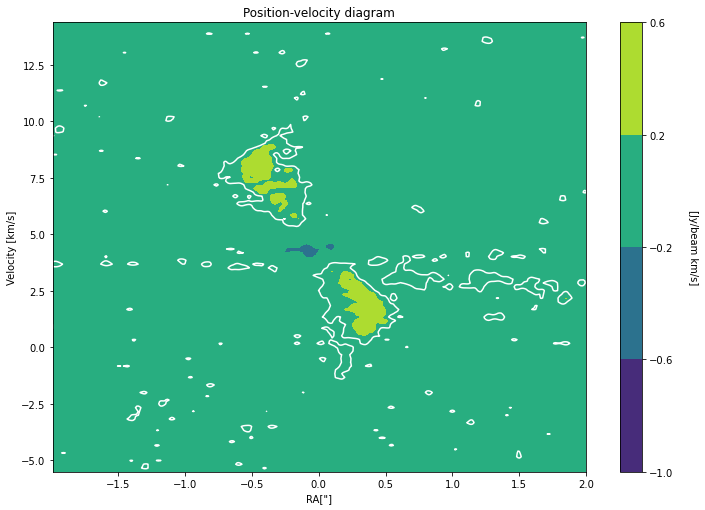

In [44]:
# P-V Diagram
PV = plt.figure(figsize = (10,7))
ke = plt.contourf(x_cen, v_CO, data_CO[:,1960:2040,1800:2200].sum(axis=1),np.arange(-1,1,0.4))
plt.contour(x_cen, v_CO, data_CO[:,1960:2040,1800:2200].sum(axis=1),np.arange(0.1,1,0.4), colors='white')


#colorbar
cbar = plt.colorbar(ke)
cbar.set_label('[Jy/beam km/s]', labelpad=25, y=0.5, rotation=270);

plt.title('Position-velocity diagram')
plt.tight_layout()
plt.xlabel('RA["]')
plt.ylabel('Velocity [km/s]')
#plt.xlim(-2,2)
plt.show();

In [45]:
len(x_cen)

400

In [46]:
def kepler(x,m):
    #G = 6.67430e-11  # Gravitational constant #m^3  kg^-1 s^-2
    G = 6.67430e-20 #km^3 kg^-1 s^-2
    r = np.abs(x)
    v = -x/abs(x)*np.sqrt((G * m) / r)
    return v

#def kepler1(x,m):
    #G = 6.67430e-11  # Gravitational constant #m^3  kg^-1 s^-2
#    G = 6.67430e-20 #km^3 kg^-1 s^-2
#    r = np.abs(x)
#    v = np.sqrt((G * m) / r)
#    return v


#x_left = ((190) * x_cen[159:199])*149597871 #km
#x_right = ((190) * x_cen[201:241])*149597871 #km

x_left = ((190) * x_cen[99:199])*149597871 #km  (distance [pc]*anglur extent [arcsecs]* km/AU)
x_right = ((190) * x_cen[201:301])*149597871 #km


x_all = np.concatenate((x_left, x_right))

temp = ((190) * x_cen[99:300])*149597871 # from arcsecs to km (x_cen is in arcsec)
x_all2 = np.delete(temp, 101)
len(x_all2)

200

In [47]:
temp[101]

-0.0

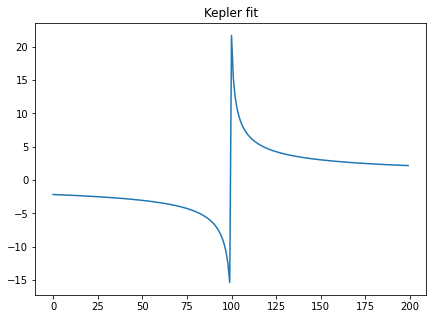

In [48]:
m = 2e30

# plotting the before and after rotating the data
#plt.figure(2, figsize = (15,10))
#plt.subplot(221)

# Define the y data (v_CO) that you want to fit
v_all = kepler(x_all, m)
plt.figure(2, figsize = (7,5))
plt.plot(v_all);
#plt.title('Kepler w -x/abs(x)')
plt.title('Kepler fit')


#plt.subplot(222)
# Define the y data (v_CO) that you want to fit
#v_all = kepler1(x_all, m)

#plt.figure(2, figsize = (7,5))
#plt.plot(v_all);
#plt.title('kepler w/o -x/abs(x)')


plt.show();

/tmp/xpython_1029601/470008191.py:5: RuntimeWarning: invalid value encountered in true_divide
  v = -x/abs(x)*np.sqrt((G * m) / r)
/tmp/xpython_1029601/470008191.py:5: RuntimeWarning: divide by zero encountered in true_divide
  v = -x/abs(x)*np.sqrt((G * m) / r)


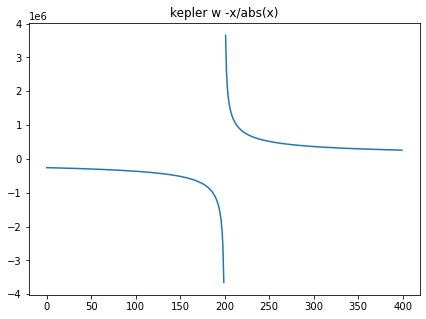

In [49]:
m = 2e30

v_all = kepler(x_cen, m)
plt.figure(figsize = (7,5))
plt.plot(v_all);
plt.title('kepler w -x/abs(x)')

plt.show();

In [50]:
region = xaxis_CO[np.where((xaxis_CO<=1.01) & (xaxis_CO>=-1.01))]
print(region.shape)
#region = -1*region
#print(region)

(201,)


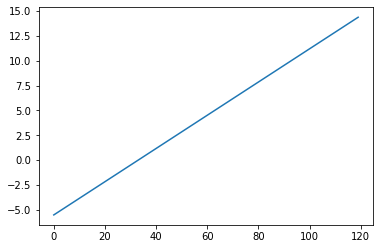

In [51]:
plt.plot(v_CO)

count: 0 1.00000000000008


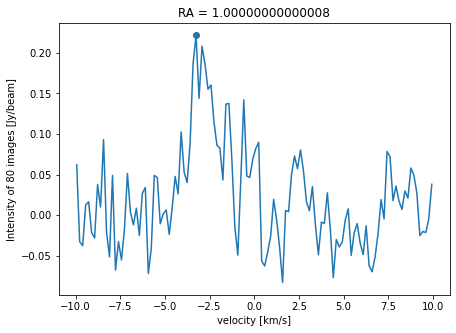

count: 1 0.9900000000000792


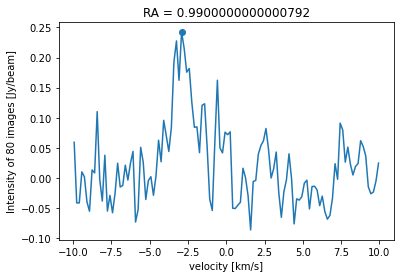

count: 2 0.9800000000000784


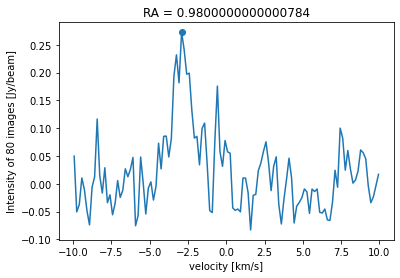

count: 3 0.9700000000000775


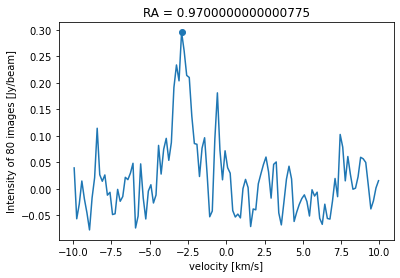

count: 4 0.9600000000000768


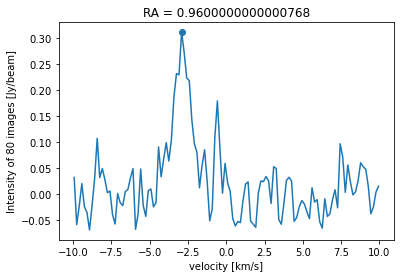

count: 5 0.950000000000076


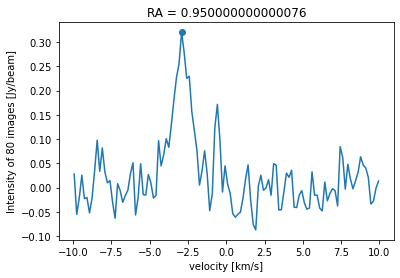

count: 6 0.9400000000000751


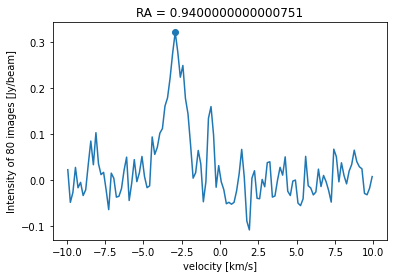

count: 7 0.9300000000000744


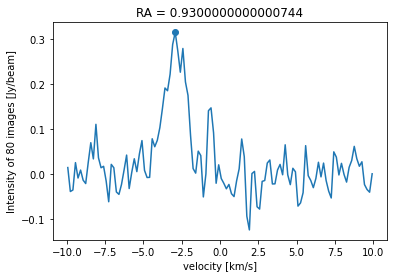

count: 8 0.9200000000000734


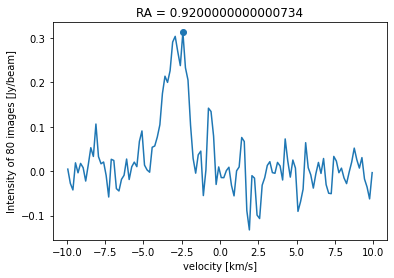

count: 9 0.9100000000000728


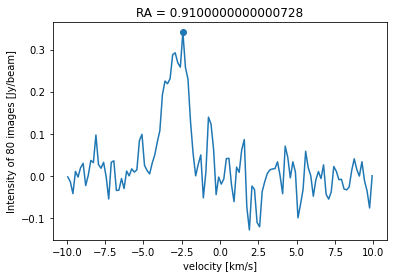

count: 10 0.9000000000000721


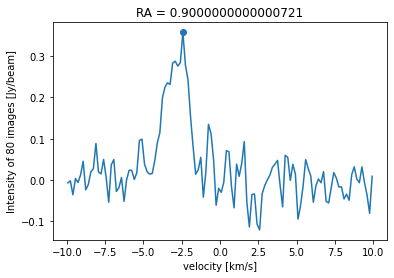

count: 11 0.8900000000000711


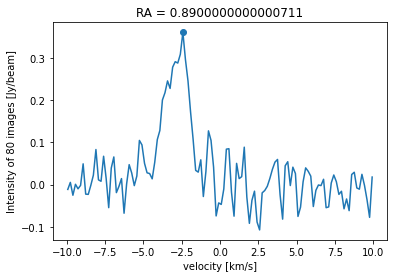

count: 12 0.8800000000000704


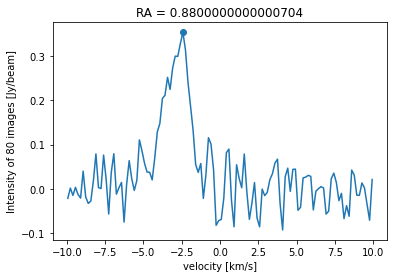

count: 13 0.8700000000000696


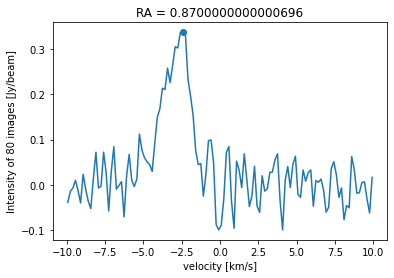

count: 14 0.8600000000000687


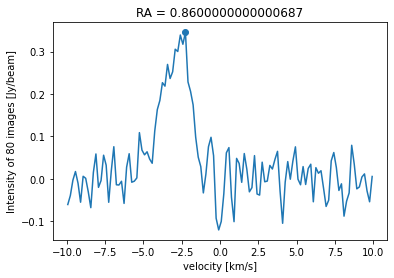

count: 15 0.8500000000000679


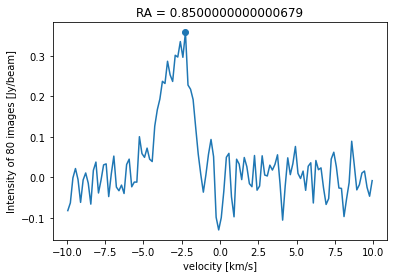

count: 16 0.8400000000000671


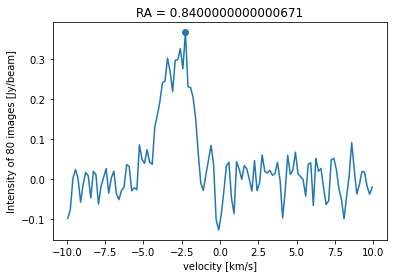

count: 17 0.8300000000000664


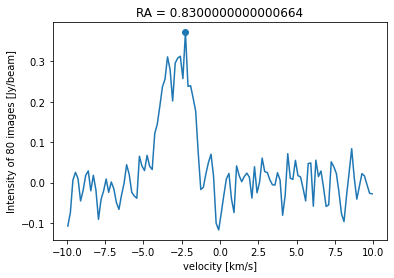

count: 18 0.8200000000000656


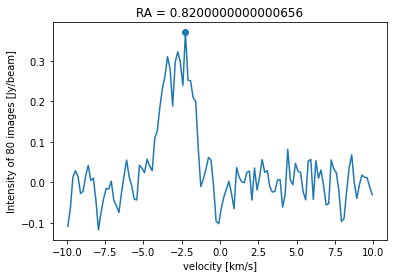

count: 19 0.8100000000000648


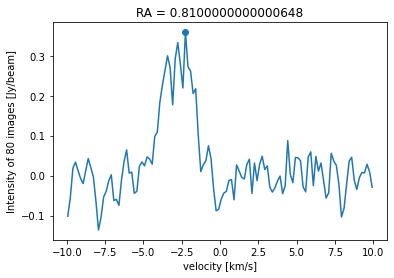

count: 20 0.800000000000064


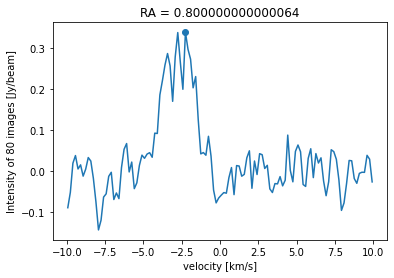

count: 21 0.7900000000000631


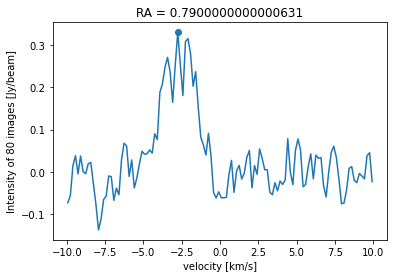

count: 22 0.7800000000000623


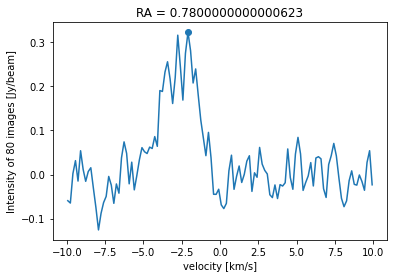

count: 23 0.7700000000000616


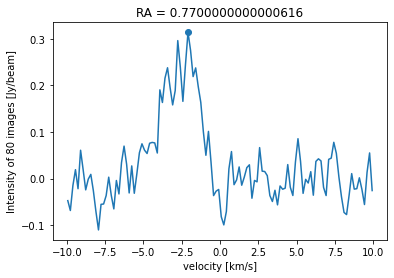

count: 24 0.7600000000000607


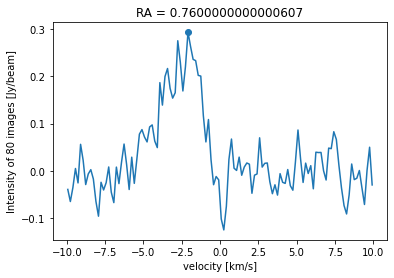

count: 25 0.75000000000006


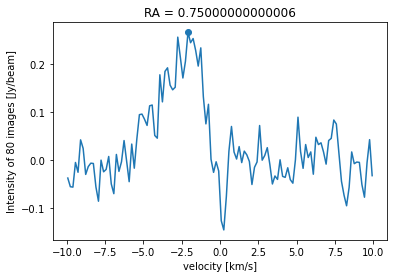

count: 26 0.7400000000000592


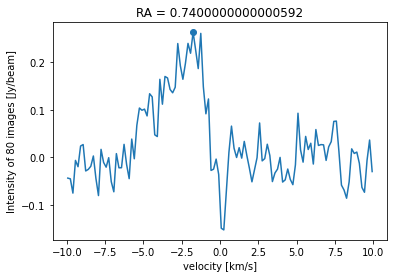

count: 27 0.7300000000000584


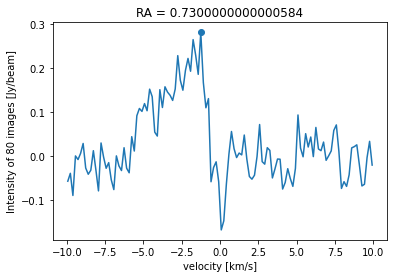

count: 28 0.7200000000000575


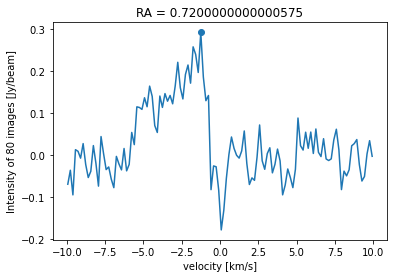

count: 29 0.7100000000000568


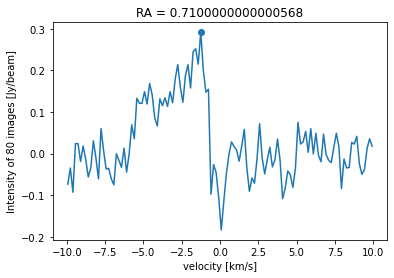

count: 30 0.700000000000056


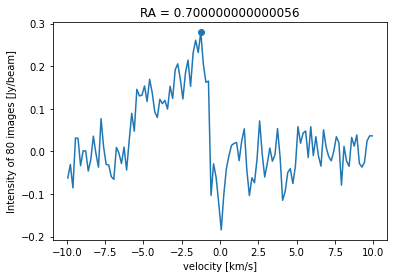

count: 31 0.6900000000000551


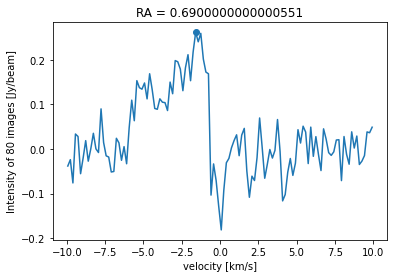

count: 32 0.6800000000000543


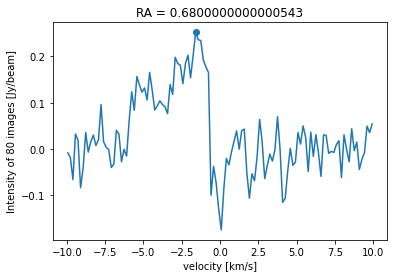

count: 33 0.6700000000000536


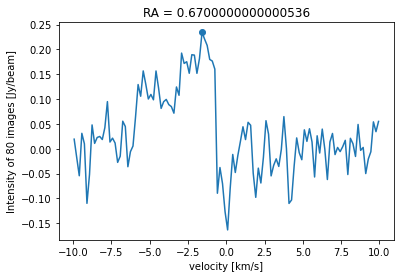

count: 34 0.6600000000000528


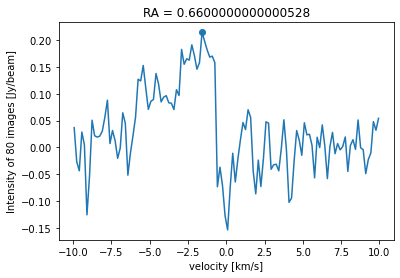

count: 35 0.650000000000052


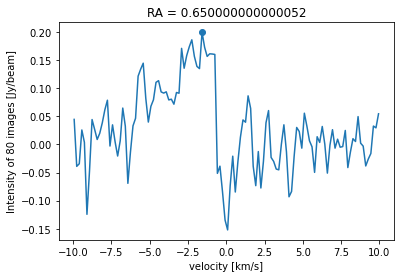

count: 36 0.6400000000000512


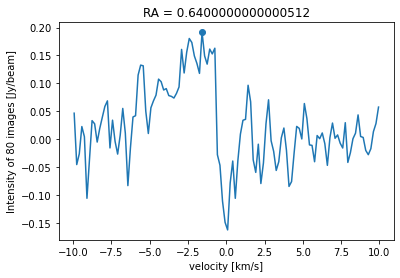

count: 37 0.6300000000000503


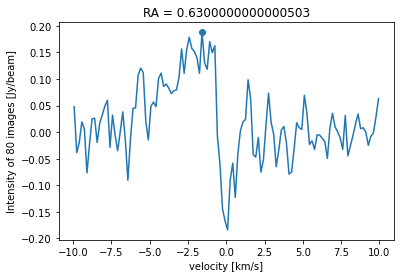

count: 38 0.6200000000000495


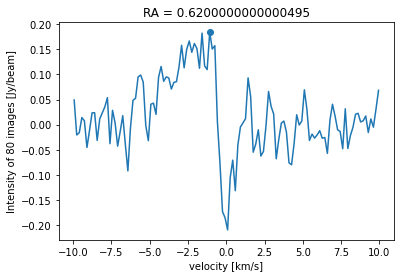

count: 39 0.6100000000000488


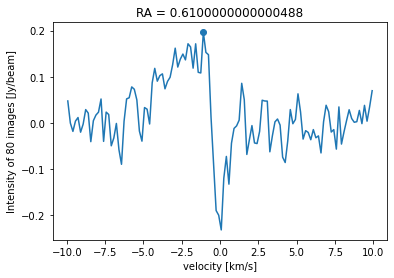

count: 40 0.6000000000000479


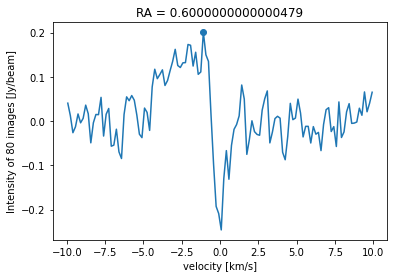

count: 41 0.5900000000000472


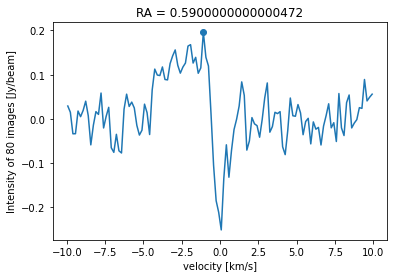

count: 42 0.5800000000000464


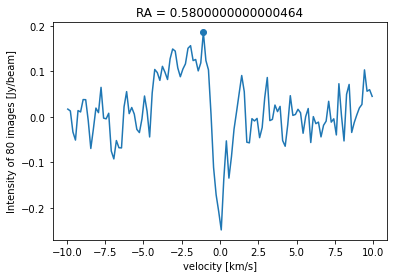

count: 43 0.5700000000000456


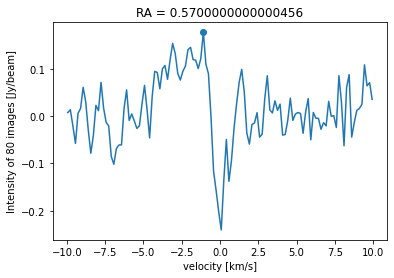

count: 44 0.5600000000000448


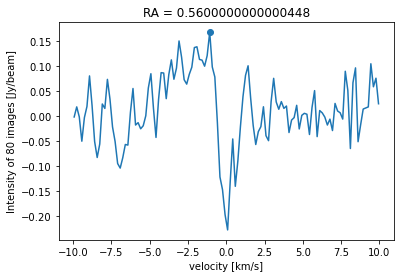

count: 45 0.550000000000044


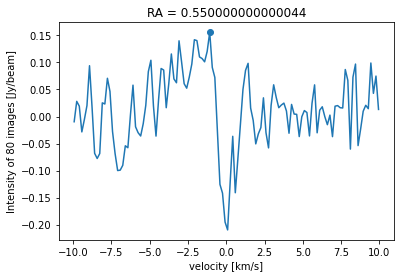

count: 46 0.5400000000000432


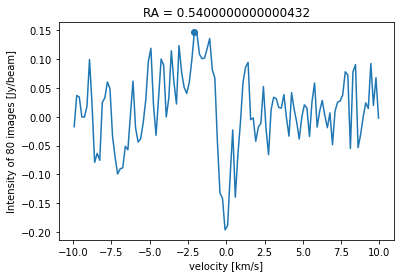

count: 47 0.5300000000000423


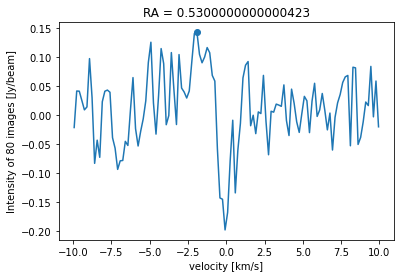

count: 48 0.5200000000000415


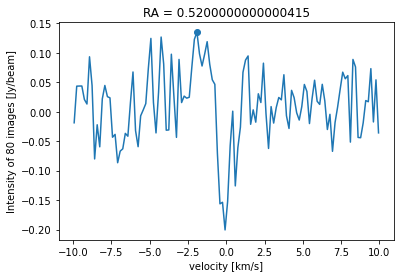

count: 49 0.5100000000000408


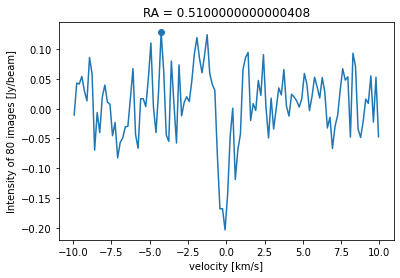

count: 50 0.50000000000004


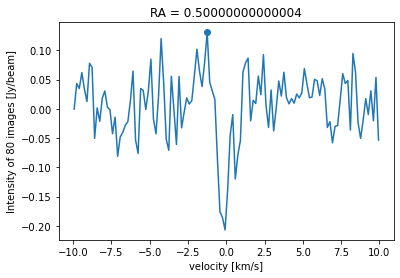

count: 51 0.4900000000000392


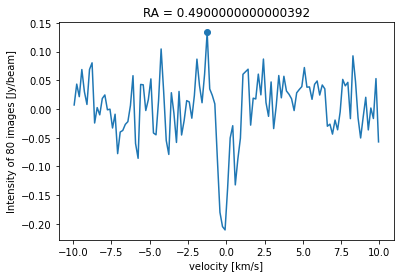

count: 52 0.4800000000000384


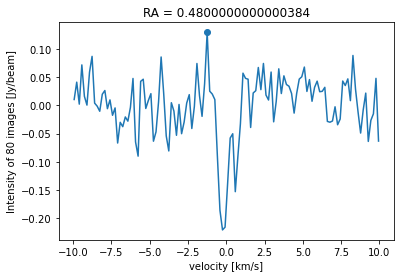

count: 53 0.47000000000003755


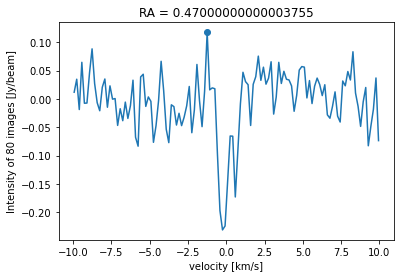

count: 54 0.4600000000000367


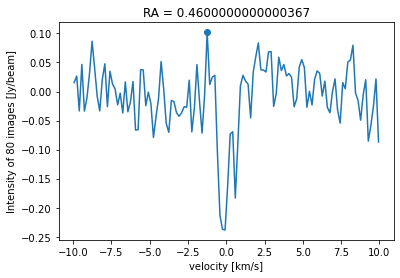

count: 55 0.45000000000003604


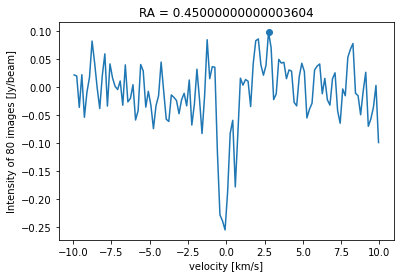

count: 56 0.4400000000000352


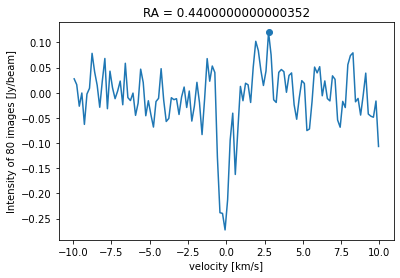

count: 57 0.43000000000003435


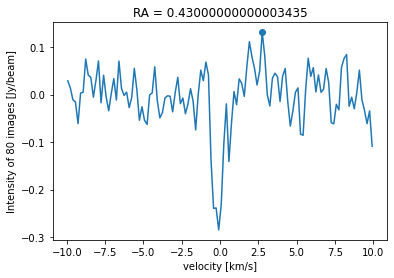

count: 58 0.42000000000003357


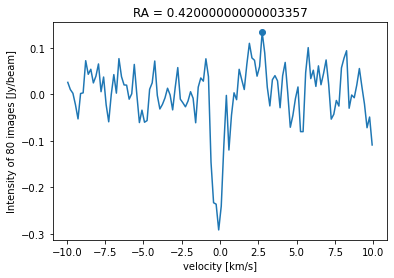

count: 59 0.4100000000000328


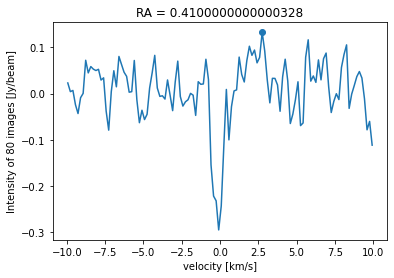

count: 60 0.400000000000032


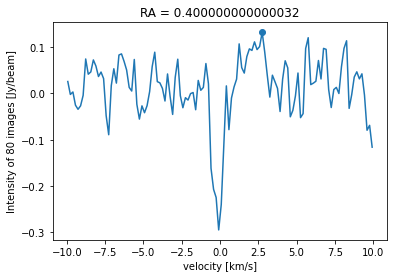

count: 61 0.39000000000003116


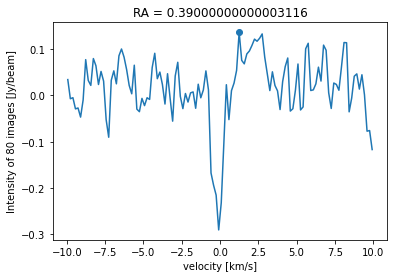

count: 62 0.38000000000003037


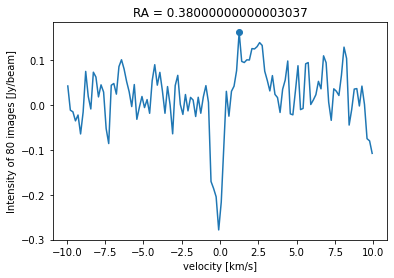

count: 63 0.3700000000000296


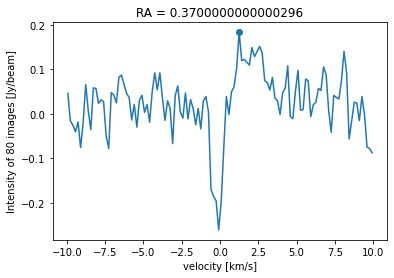

count: 64 0.36000000000002874


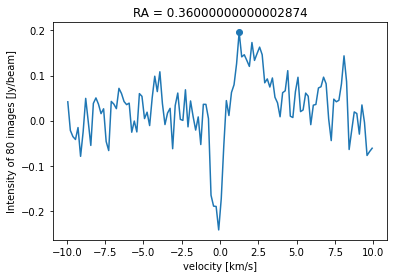

count: 65 0.350000000000028


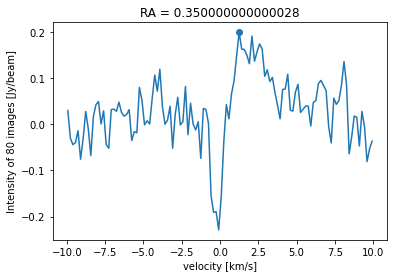

count: 66 0.34000000000002717


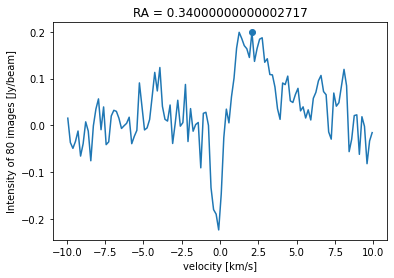

count: 67 0.3300000000000264


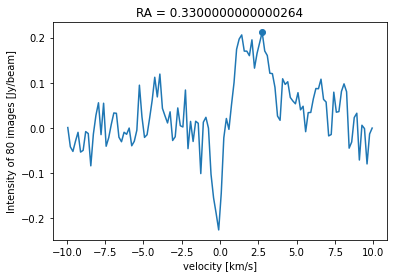

count: 68 0.3200000000000256


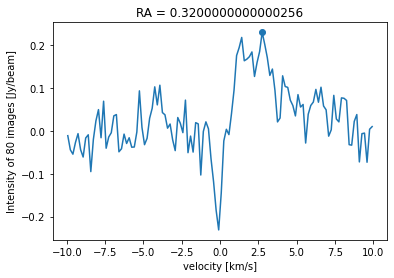

count: 69 0.31000000000002476


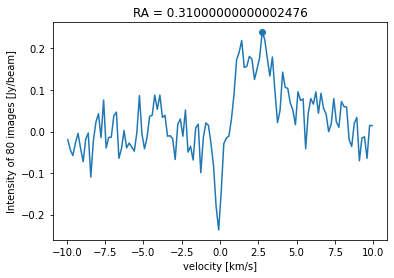

count: 70 0.30000000000002397


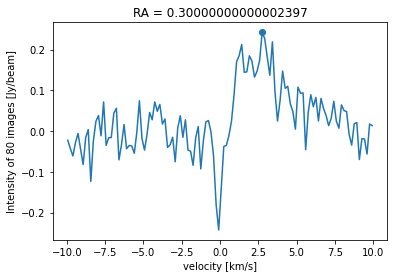

count: 71 0.2900000000000232


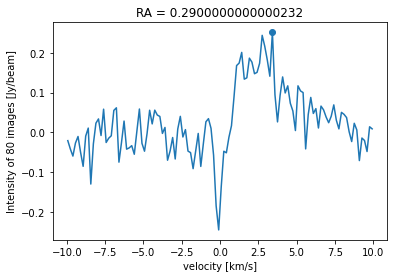

count: 72 0.2800000000000224


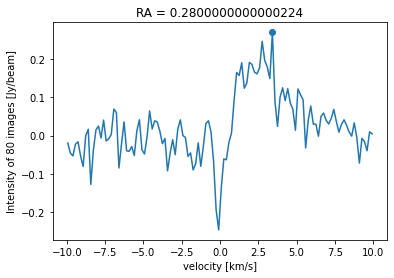

count: 73 0.2700000000000216


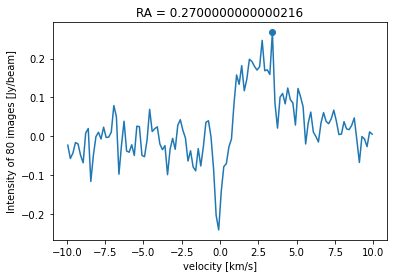

count: 74 0.26000000000002077


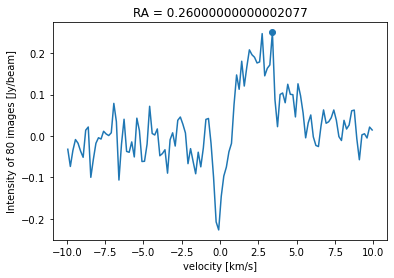

count: 75 0.25000000000002


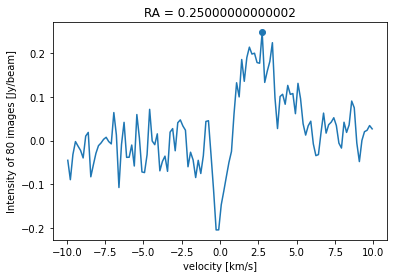

count: 76 0.2400000000000192


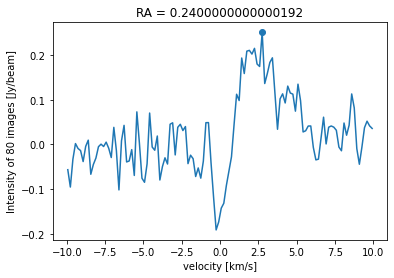

count: 77 0.23000000000001836


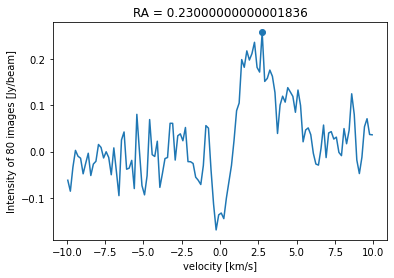

count: 78 0.2200000000000176


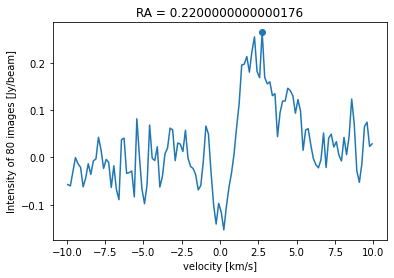

count: 79 0.21000000000001678


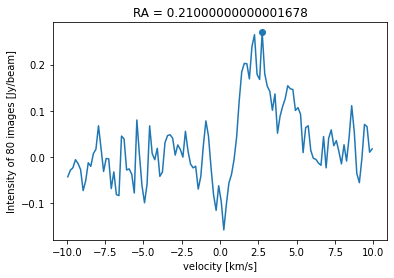

count: 80 0.200000000000016


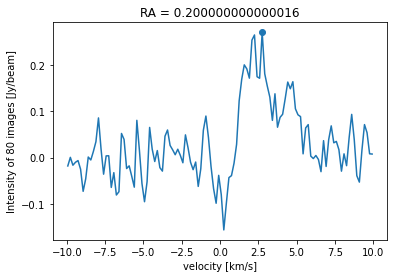

count: 81 0.19000000000001518


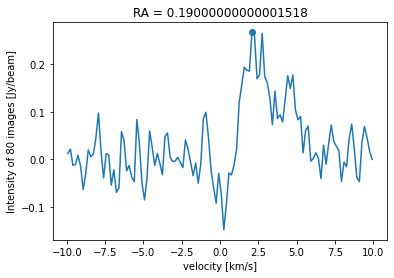

count: 82 0.18000000000001437


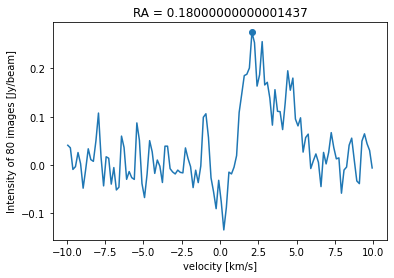

count: 83 0.17000000000001358


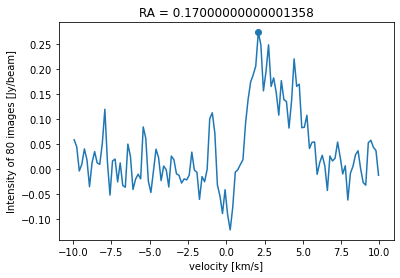

count: 84 0.1600000000000128


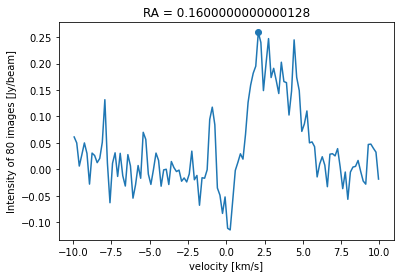

count: 85 0.15000000000001198


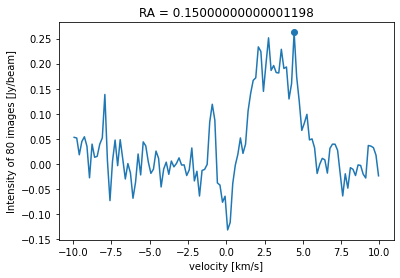

count: 86 0.1400000000000112


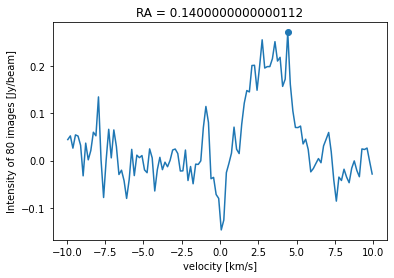

count: 87 0.13000000000001039


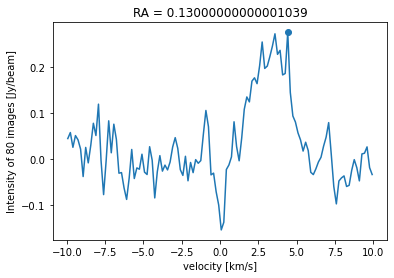

count: 88 0.1200000000000096


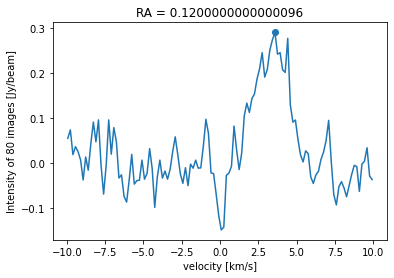

count: 89 0.1100000000000088


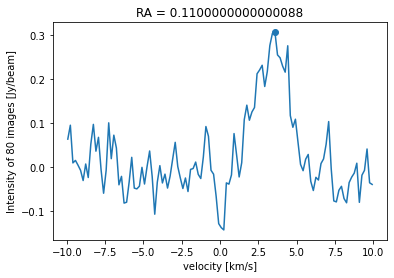

count: 90 0.100000000000008


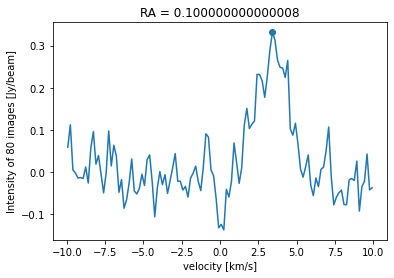

count: 91 0.09000000000000719


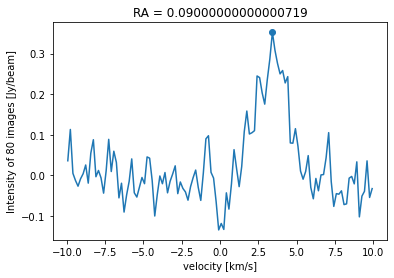

count: 92 0.0800000000000064


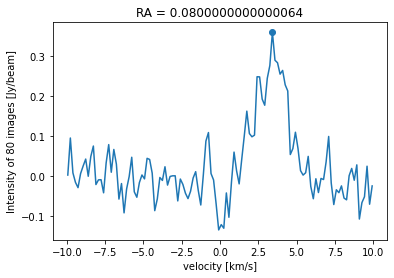

count: 93 0.0700000000000056


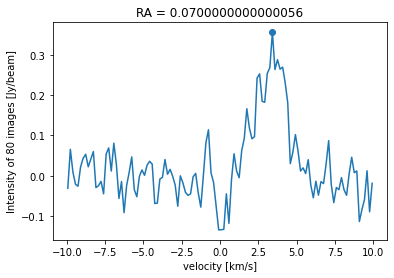

count: 94 0.0600000000000048


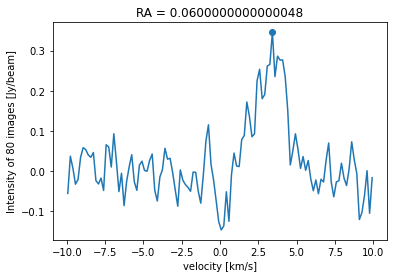

count: 95 0.050000000000004


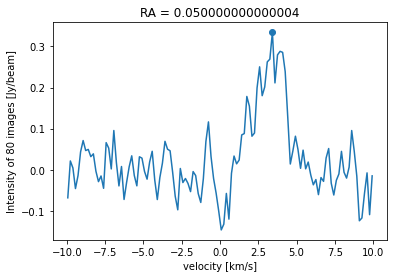

count: 96 0.0400000000000032


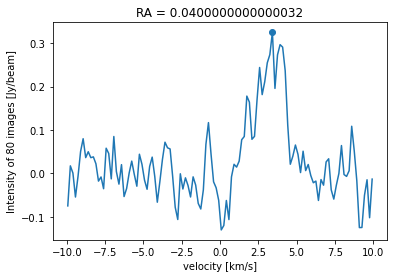

count: 97 0.0300000000000024


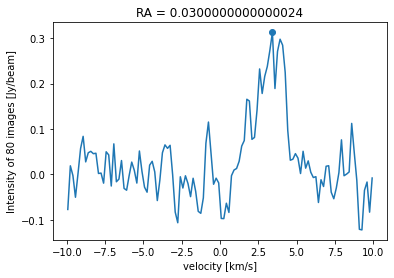

count: 98 0.0200000000000016


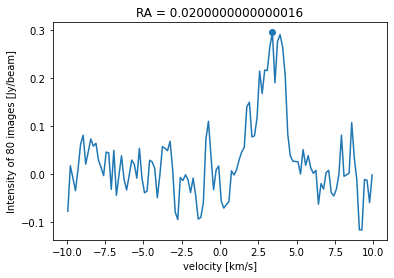

count: 99 0.0100000000000008


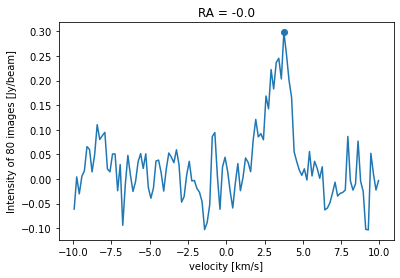

In [55]:
liste = np.linspace(1950,2050,100, dtype=int)
regionlist = np.linspace(0,100,100, dtype=int)
meanint = np.mean(data_CO[:,1960, 1900])
stdint = np.std(data_CO[:,1960, 1900])



peakint = []
count = -1
plt.figure(figsize=(7,5))
for j, item in enumerate(liste[:],0):
    count += 1
    #print(item)
    intensity = np.zeros((data_CO[:,1960,1900].shape))
    for i in range(80): # integrating over 80 declination slices to sum the intensity?
        index = 1960+i
        intensity += data_CO[:,index, item]
    peakint.append(v_cen[np.argmax(intensity)])
    
    
    print('count:',count,x_cen[j+100])

    #print(np.argmin(intensity))
    norm = ((intensity))#-meanint))
    stddev_intensity = np.std(norm)
    #plt.subplot(50,2,j+1); 
    plt.plot(v_cen, norm)
    #plt.hlines(stddev_intensity, -10, 20)
    #plt.hlines(-stddev_intensity, -10, 20)
    plt.scatter(v_cen[np.argmax(intensity)], np.max(norm))
    plt.xlabel('velocity [km/s]')
    plt.ylabel('Intensity of 80 images [Jy/beam]')
    plt.title(f'RA = {region[regionlist[j]]}')
    #fig.tight_layout()
    plt.show()


In [56]:
dfx = np.linspace(-1, 1, 100)
dfy = peakint


datf = pd.DataFrame({'x': dfx, 'peak': dfy})
#datf = datf.drop(datf.index[80:130])
datf.to_csv('/lustre/astro/lkv791/thesis/observation/data/data.csv', index=False) 
datf

,x,peak
0,-1.000000,-3.256673
1,-0.979798,-2.922670
2,-0.959596,-2.922670
3,-0.939394,-2.922670
4,-0.919192,-2.922670
...,...,...
95,0.919192,3.423529
96,0.939394,3.423529
97,0.959596,3.423529
98,0.979798,3.423529


In [67]:
with pd.option_context('display.max_rows', None,):
    print(datf)

            x      peak
0   -1.000000 -7.264651
1   -0.989950 -1.753653
2   -0.979899 -1.753653
3   -0.969849 -1.753653
4   -0.959799 -1.753653
5   -0.949749  8.767904
6   -0.939698  8.767904
7   -0.929648 -0.417623
8   -0.919598 -1.419647
9   -0.909548 -1.419647
10  -0.899497 -1.419647
11  -0.889447 -1.419647
12  -0.879397 -1.252643
13  -0.869347 -1.252643
14  -0.859296 -1.252643
15  -0.849246 -1.252643
16  -0.839196 -1.252643
17  -0.829146 -6.429664
18  -0.819095 -6.429664
19  -0.809045 -6.429664
20  -0.798995 -1.419647
21  -0.788945 -1.419647
22  -0.778894 -1.419647
23  -0.768844 -1.419647
24  -0.758794 -1.753653
25  -0.748744 -1.586650
26  -0.738693 -1.586650
27  -0.728643 -1.419647
28  -0.718593 -1.419647
29  -0.708543 -1.419647
30  -0.698492 -1.419647
31  -0.688442 -1.419647
32  -0.678392 -1.419647
33  -0.668342 -1.419647
34  -0.658291 -1.586650
35  -0.648241 -0.584628
36  -0.638191 -1.252643
37  -0.628141 -1.085640
38  -0.618090 -0.918636
39  -0.608040 -0.918636
40  -0.597990 -0

peakdel = np.delete(peakint, np.r_[80:130])
len(peakdel)

# here I have deleted all the values for the source itself, 
# only left and right peak intensity velocity values

len(liste[40:120])


In [63]:

def pvplot(kep, x, peak):
    
    initial_M = 1.989e30 
    M_sun = initial_M * u.kg
    print(x.shape)
    #xcen = [2000-int(len(x)/2):2000+int(len(x)/2)]
    param_new, cov_new = curve_fit(kep, x, peak, p0=[initial_M])
    fitted_M_new = param_new[0]
    print('Fitted Mass_new:', fitted_M_new, 'kg')

    Mnew = fitted_M_new * u.kg / M_sun
    print("Mnew =", Mnew, 'solarmasses')
    
    # P-V Diagram
    PV = plt.figure(figsize = (10,7))
    #ke = plt.contourf(x, v_cen, data_CO[:,1960:2040,2000-int(len(x)/2):2000+int(len(x)/2)].sum(axis=1),np.arange(-1,1,0.4))
    #plt.contour(x, v_cen, data_CO[:,1960:2040,2000-int(len(x)/2):2000+int(len(x)/2)].sum(axis=1), colors='white')
    ke = plt.contourf(-x_cen, v_cen, data_CO[:,1960:2040,1800:2200].sum(axis=1),np.arange(-1,1,0.4))
    plt.contour(-x_cen, v_cen, data_CO[:,1960:2040,1800:2200].sum(axis=1),np.arange(0.1,1,0.4), colors='white')
    
    #plt.plot(x[0:75], kep(x[0:75], fitted_M_new), linestyle='--', linewidth=2,label='fit', color='r');
    #plt.plot(x[125:], kep(x[125:], fitted_M_new), linestyle='--', linewidth=2,label='fit', color='r');
    plt.plot(-x[:], kep(x[:], fitted_M_new), linestyle='--', linewidth=2,label='fit', color='r');
    
    plt.scatter(datf['x'], datf['peak'],label='data')
    
    if kep == kepler:
        print('This is kepler with -x/abs(x)')
    else:
        print('This is kepler without -x/abs(x)')
        

    #colorbar
    cbar = plt.colorbar(ke)
    cbar.set_label('[Jy/beam km/s]', labelpad=25, y=0.5, rotation=270);

    plt.title('P-V diagram with Kepler fit')
    plt.tight_layout()
    plt.xlabel('RA["]')
    plt.ylabel('Velocity [km/s]')
    #plt.xlim(-1,1)
    #plt.ylim(-10,10)
    #plt.savefig('PVkepler.png')
    plt.legend()
    plt.show();

In [64]:
datf['x'].iloc[80:]*1e10

80    6.161616e+09
81    6.363636e+09
82    6.565657e+09
83    6.767677e+09
84    6.969697e+09
85    7.171717e+09
86    7.373737e+09
87    7.575758e+09
88    7.777778e+09
89    7.979798e+09
90    8.181818e+09
91    8.383838e+09
92    8.585859e+09
93    8.787879e+09
94    8.989899e+09
95    9.191919e+09
96    9.393939e+09
97    9.595960e+09
98    9.797980e+09
99    1.000000e+10
Name: x, dtype: float64

(100,)


/lustre/hpc/software/astro/anaconda/anaconda3-2021.05/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Fitted Mass_new: 5.470518407138713e+18 kg
Mnew = 2.7503863283754214e-12 solarmasses
This is kepler with -x/abs(x)


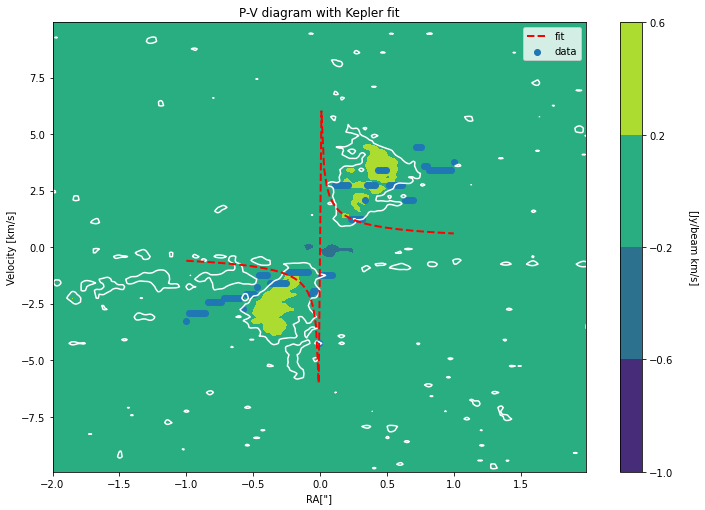

In [65]:
pvplot(kepler, -datf['x'], datf['peak'])

(200,)


/lustre/hpc/software/astro/anaconda/anaconda3-2021.05/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Fitted Mass_new: 3.8602865415510006e+18 kg
Mnew = 1.940817768502263e-12 solarmasses
This is kepler with -x/abs(x)


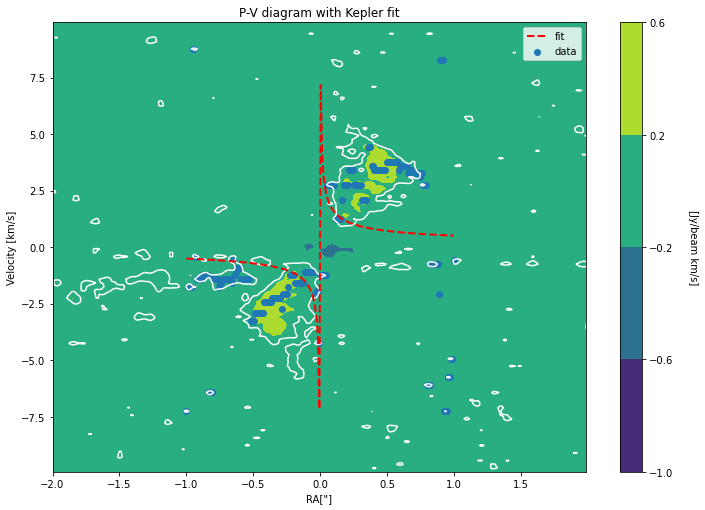

In [104]:
pvplot(kepler, -datf['x'], datf['peak'])

0
count: 2 Xaxis: 0.9800000000000784
0.1330883432583505


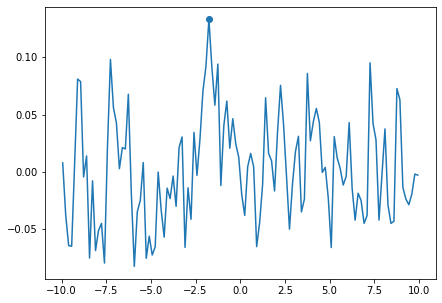

1
count: 3 Xaxis: 0.9700000000000775
0.12986479029495968


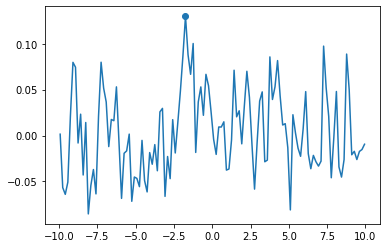

2
count: 9 Xaxis: 0.9100000000000728
0.12902837557612656


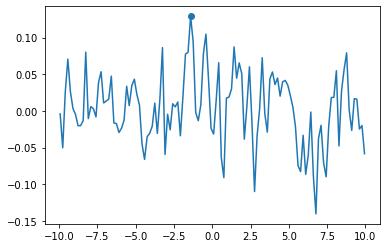

3
count: 10 Xaxis: 0.9000000000000721
0.13615080957401915


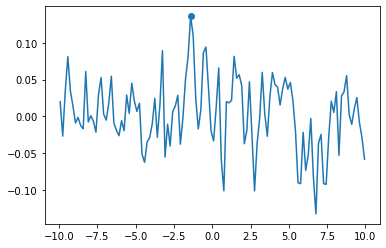

4
count: 11 Xaxis: 0.8900000000000711
0.13894849568805512


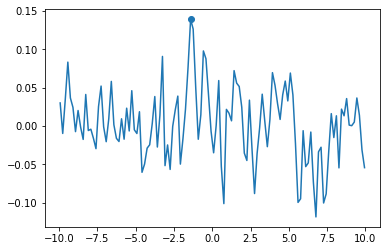

5
count: 12 Xaxis: 0.8800000000000704
0.140045750860736


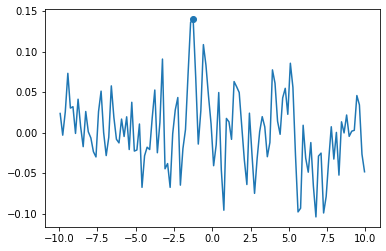

6
count: 13 Xaxis: 0.8700000000000696
0.1485740563548461


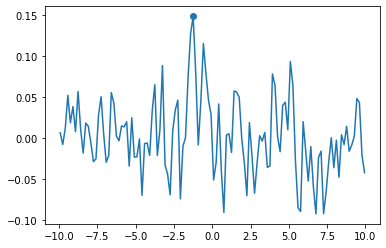

7
count: 14 Xaxis: 0.8600000000000687
0.14951382852814277


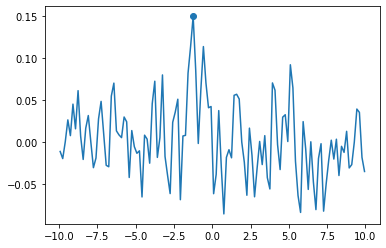

8
count: 15 Xaxis: 0.8500000000000679
0.1422560536389028


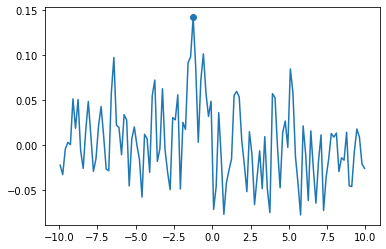

9
count: 16 Xaxis: 0.8400000000000671
0.12940758043987444


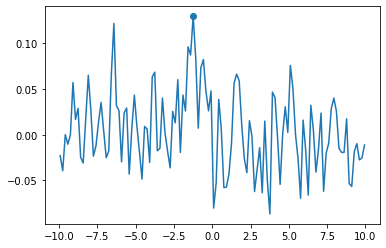

10
count: 17 Xaxis: 0.8300000000000664
0.13685623916171608


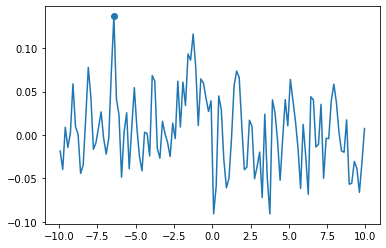

11
count: 18 Xaxis: 0.8200000000000656
0.13934614762911224


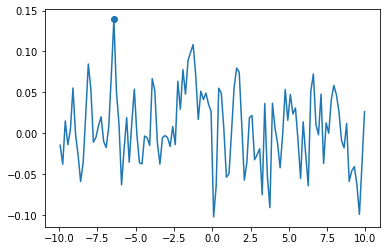

12
count: 19 Xaxis: 0.8100000000000648
0.12810801581508713


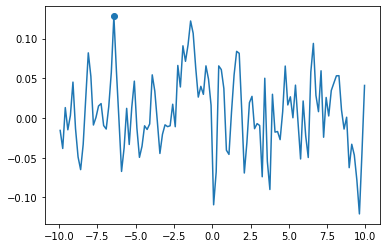

13
count: 20 Xaxis: 0.800000000000064
0.14746791148309057


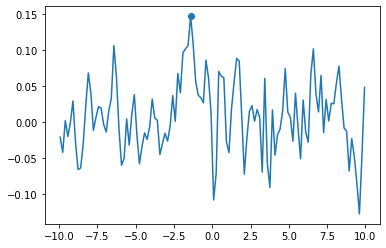

14
count: 21 Xaxis: 0.7900000000000631
0.1654224153198811


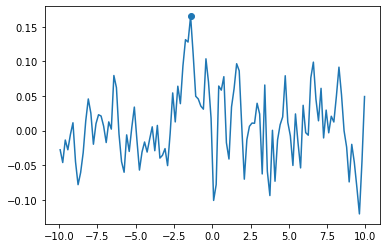

15
count: 22 Xaxis: 0.7800000000000623
0.17036174398344883


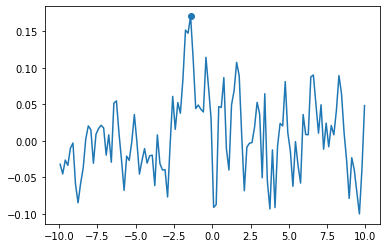

16
count: 23 Xaxis: 0.7700000000000616
0.16377518720037187


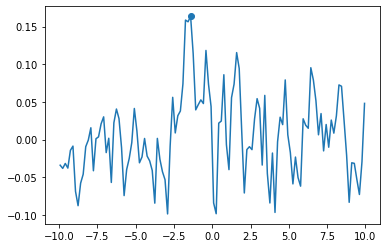

17
count: 24 Xaxis: 0.7600000000000607
0.1571241303208808


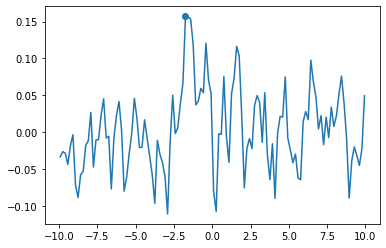

18
count: 25 Xaxis: 0.75000000000006
0.1535929201709223


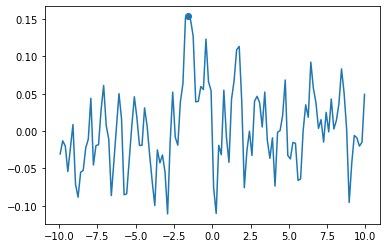

19
count: 26 Xaxis: 0.7400000000000592
0.15461875230903388


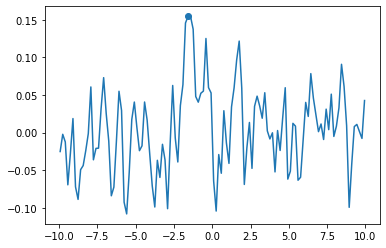

20
count: 27 Xaxis: 0.7300000000000584
0.16771853925456526


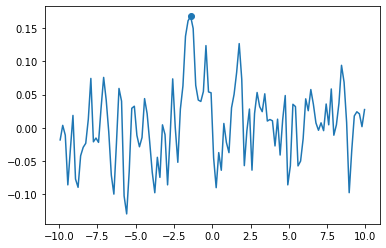

21
count: 28 Xaxis: 0.7200000000000575
0.18325020341217169


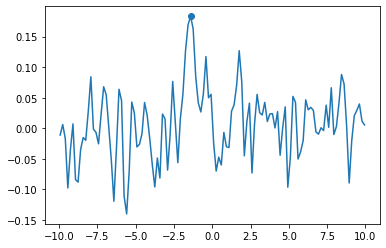

22
count: 29 Xaxis: 0.7100000000000568
0.194132350909058


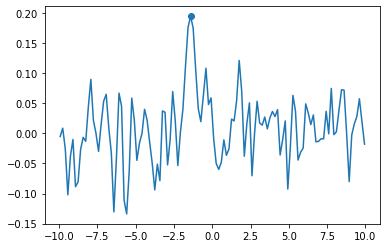

23
count: 30 Xaxis: 0.700000000000056
0.19711705687223002


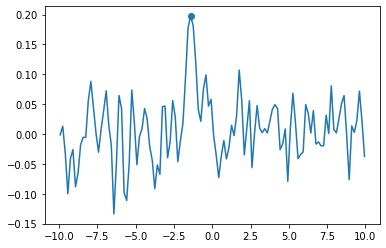

24
count: 31 Xaxis: 0.6900000000000551
0.19179218204226345


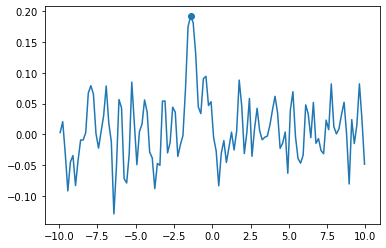

25
count: 32 Xaxis: 0.6800000000000543
0.17876436045844457


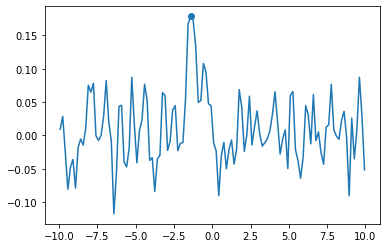

26
count: 33 Xaxis: 0.6700000000000536
0.15933762934400875


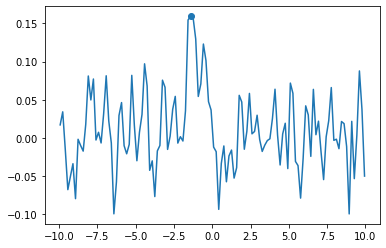

27
count: 34 Xaxis: 0.6600000000000528
0.14021536985819694


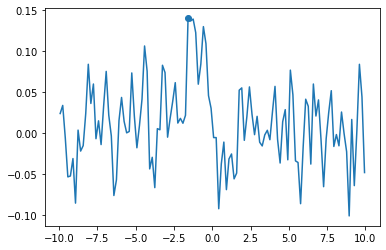

28
count: 35 Xaxis: 0.650000000000052
0.12639414268778637


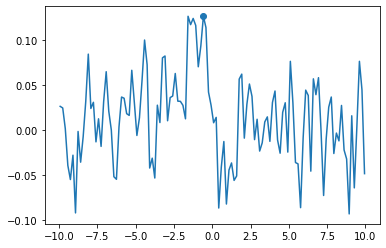

29
count: 38 Xaxis: 0.6200000000000495
0.14053489924117457


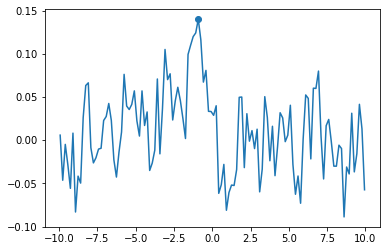

30
count: 39 Xaxis: 0.6100000000000488
0.1515725052649941


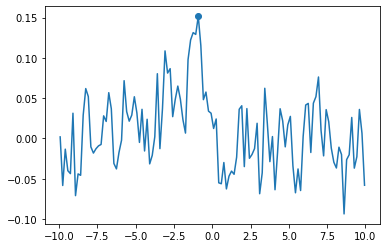

31
count: 40 Xaxis: 0.6000000000000479
0.1446419181957026


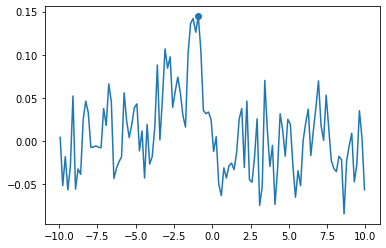

32
count: 41 Xaxis: 0.5900000000000472
0.15141458126345242


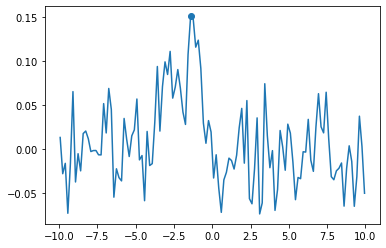

33
count: 42 Xaxis: 0.5800000000000464
0.16659103470146874


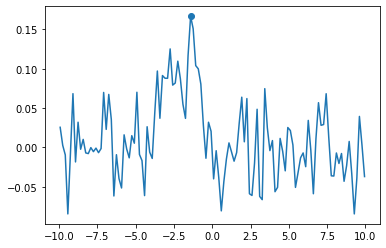

34
count: 43 Xaxis: 0.5700000000000456
0.1808729236736326


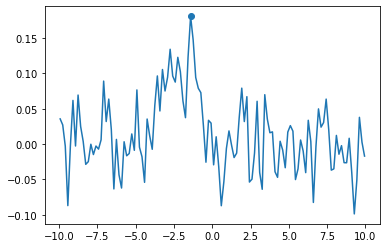

35
count: 44 Xaxis: 0.5600000000000448
0.1921847629128024


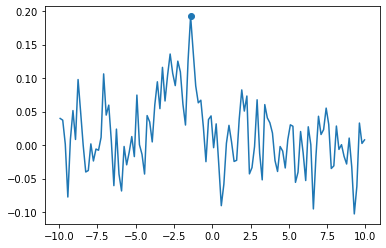

36
count: 45 Xaxis: 0.550000000000044
0.19758329933392815


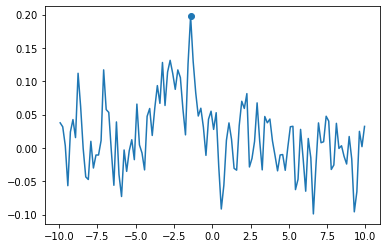

37
count: 46 Xaxis: 0.5400000000000432
0.19486398677690886


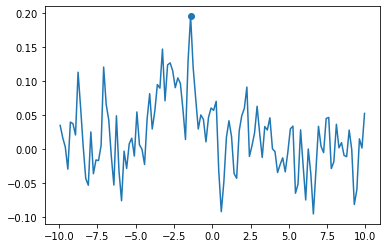

38
count: 47 Xaxis: 0.5300000000000423
0.1843903330154717


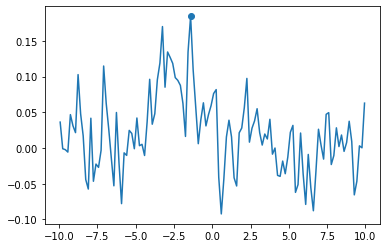

39
count: 48 Xaxis: 0.5200000000000415
0.19300590829880093


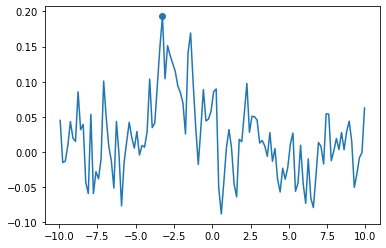

40
count: 49 Xaxis: 0.5100000000000408
0.21060854445386212


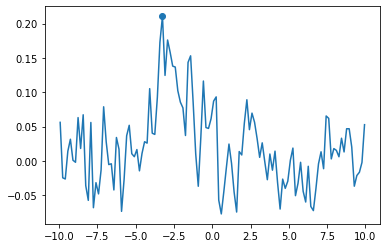

41
count: 50 Xaxis: 0.50000000000004
0.22142084330698708


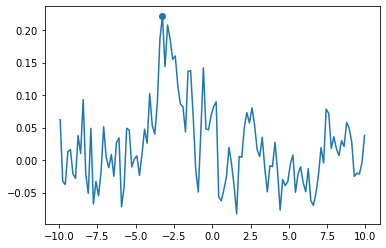

42
count: 51 Xaxis: 0.4900000000000392
0.2420861440259614


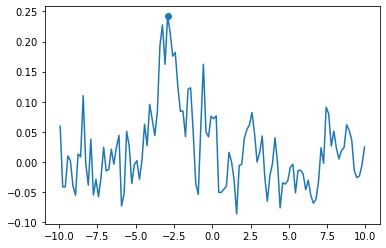

43
count: 52 Xaxis: 0.4800000000000384
0.27243258197268005


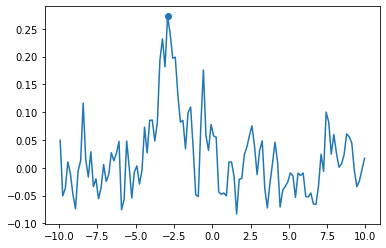

44
count: 53 Xaxis: 0.47000000000003755
0.29557085450687737


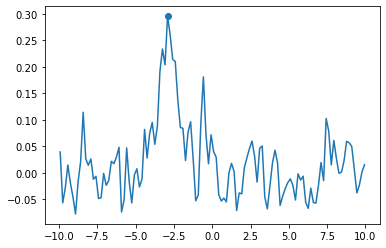

45
count: 54 Xaxis: 0.4600000000000367
0.3112895432163896


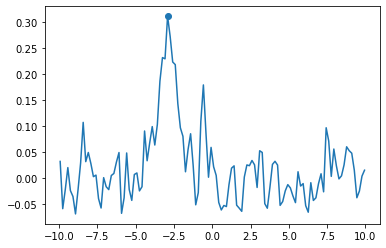

46
count: 55 Xaxis: 0.45000000000003604
0.32019208172278013


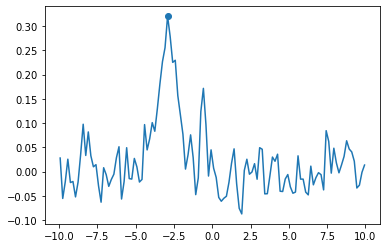

47
count: 56 Xaxis: 0.4400000000000352
0.32167027072955534


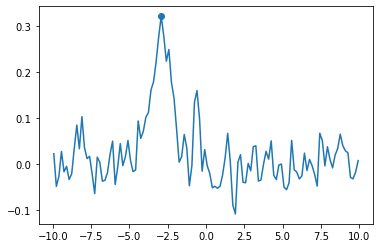

48
count: 57 Xaxis: 0.43000000000003435
0.31522458694416855


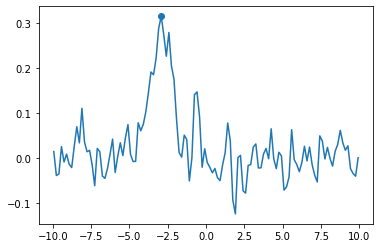

49
count: 58 Xaxis: 0.42000000000003357
0.3126787369546946


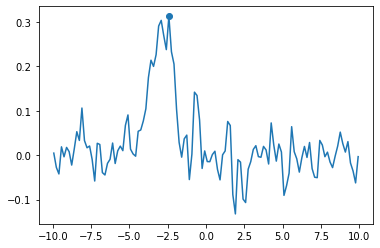

50
count: 59 Xaxis: 0.4100000000000328
0.3410752897034399


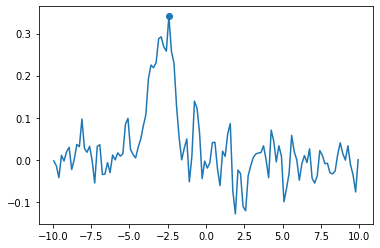

51
count: 60 Xaxis: 0.400000000000032
0.3577455547565478


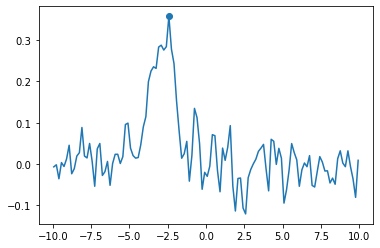

52
count: 61 Xaxis: 0.39000000000003116
0.3611307827741257


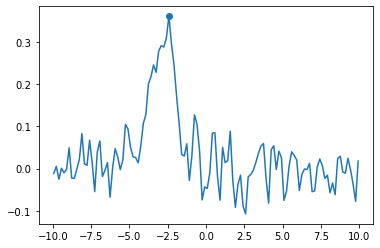

53
count: 62 Xaxis: 0.38000000000003037
0.3531949952302966


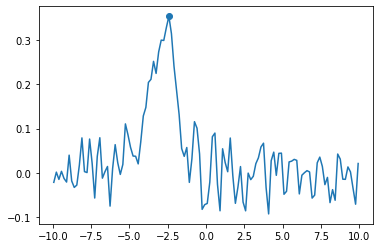

54
count: 63 Xaxis: 0.3700000000000296
0.33728035230888054


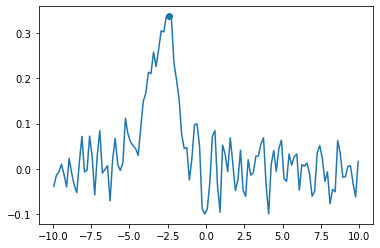

55
count: 64 Xaxis: 0.36000000000002874
0.34544389753136784


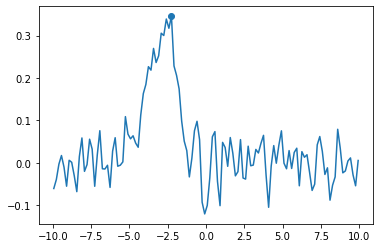

56
count: 65 Xaxis: 0.350000000000028
0.3579175426857546


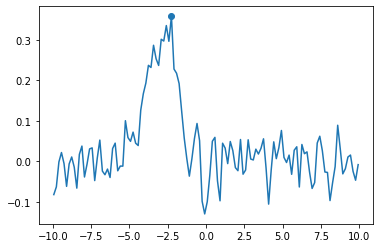

57
count: 66 Xaxis: 0.34000000000002717
0.3674105611862615


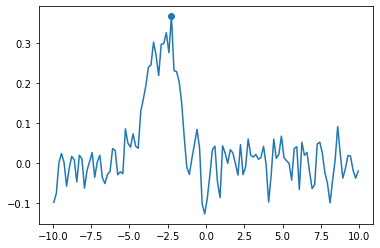

58
count: 67 Xaxis: 0.3300000000000264
0.3723087598627899


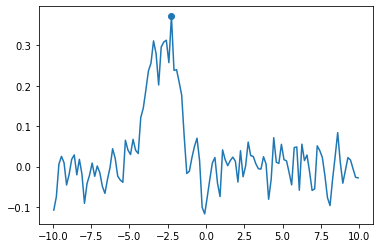

59
count: 68 Xaxis: 0.3200000000000256
0.37015506718307734


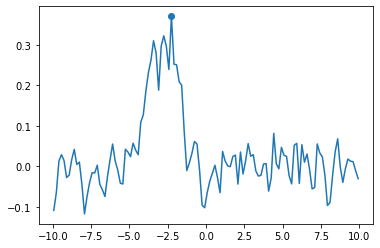

60
count: 69 Xaxis: 0.31000000000002476
0.35878054262138903


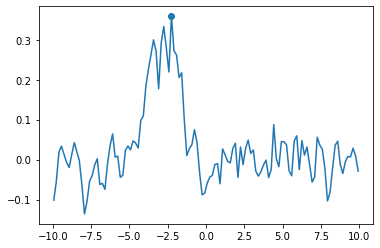

61
count: 70 Xaxis: 0.30000000000002397
0.33751929612481035


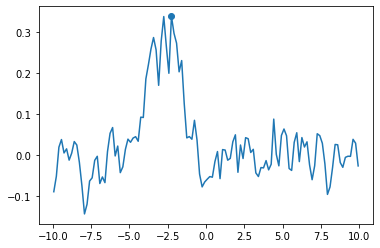

62
count: 71 Xaxis: 0.2900000000000232
0.330690530128777


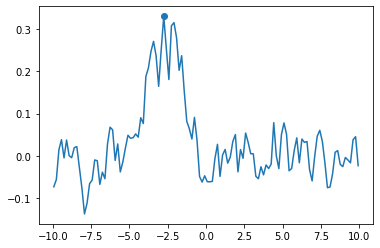

63
count: 72 Xaxis: 0.2800000000000224
0.3227895681047812


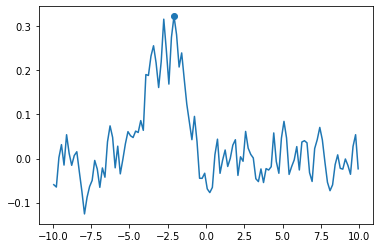

64
count: 73 Xaxis: 0.2700000000000216
0.3142905682325363


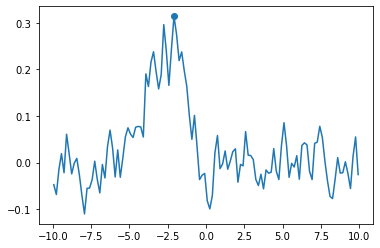

65
count: 74 Xaxis: 0.26000000000002077
0.2928876809310168


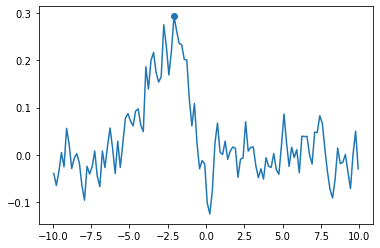

66
count: 75 Xaxis: 0.25000000000002
0.26553616070305


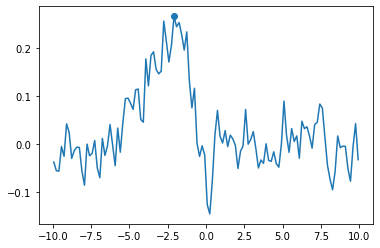

67
count: 76 Xaxis: 0.2400000000000192
0.263671902637725


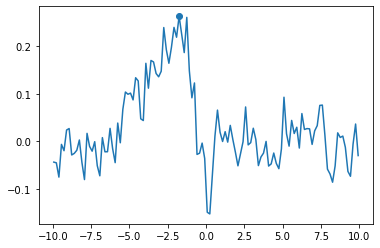

68
count: 77 Xaxis: 0.23000000000001836
0.282330526613805


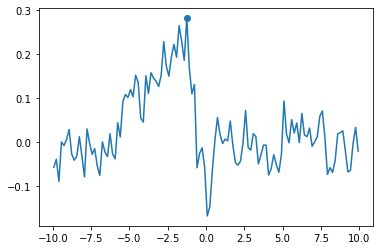

69
count: 78 Xaxis: 0.2200000000000176
0.2931108033662895


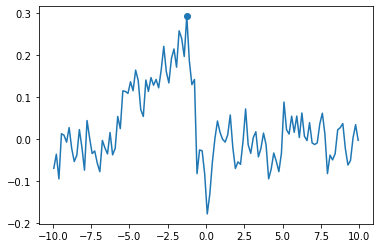

70
count: 79 Xaxis: 0.21000000000001678
0.29191315364369075


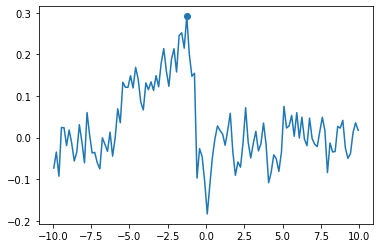

71
count: 80 Xaxis: 0.200000000000016
0.27957103069638833


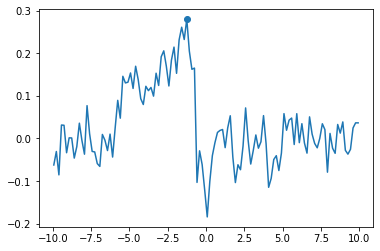

72
count: 81 Xaxis: 0.19000000000001518
0.2615330734224699


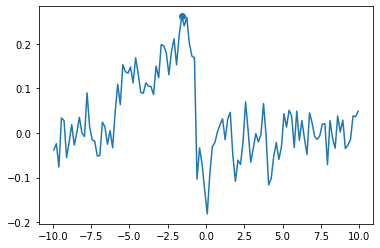

73
count: 82 Xaxis: 0.18000000000001437
0.25210692861583084


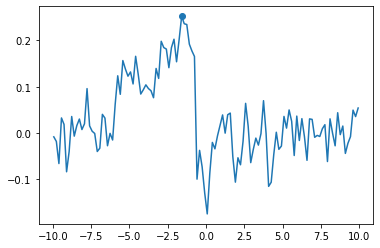

74
count: 83 Xaxis: 0.17000000000001358
0.2345733773054235


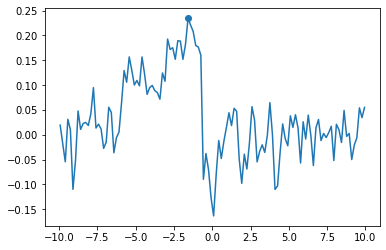

75
count: 84 Xaxis: 0.1600000000000128
0.2148889112559118


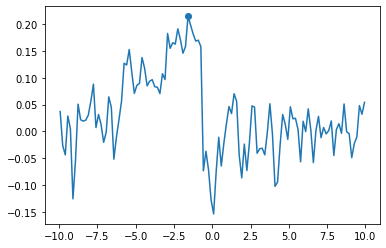

76
count: 85 Xaxis: 0.15000000000001198
0.1996632214413694


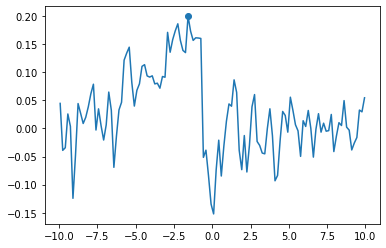

77
count: 86 Xaxis: 0.1400000000000112
0.19162238676653942


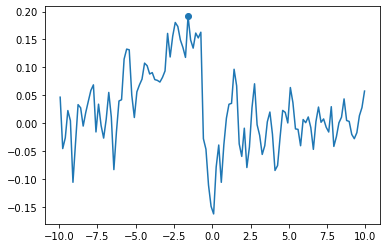

78
count: 87 Xaxis: 0.13000000000001039
0.1878081589602516


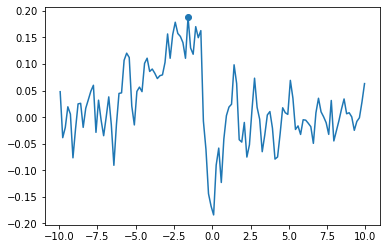

79
count: 88 Xaxis: 0.1200000000000096
0.18404583253141027


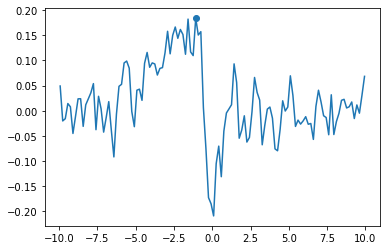

80
count: 89 Xaxis: 0.1100000000000088
0.19633370399242267


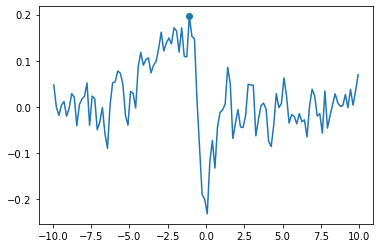

81
count: 90 Xaxis: 0.100000000000008
0.20066245911584701


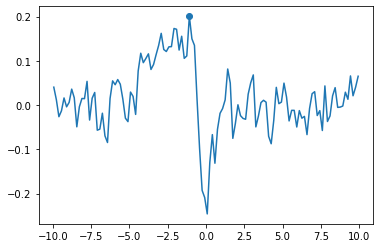

82
count: 91 Xaxis: 0.09000000000000719
0.1958504960348364


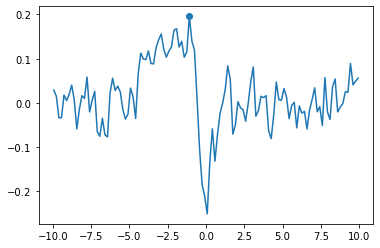

83
count: 92 Xaxis: 0.0800000000000064
0.18624775648640934


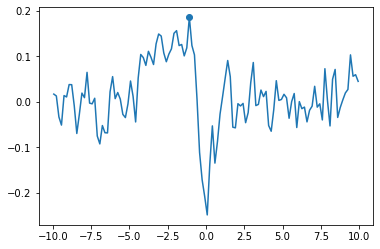

84
count: 93 Xaxis: 0.0700000000000056
0.17696484361295006


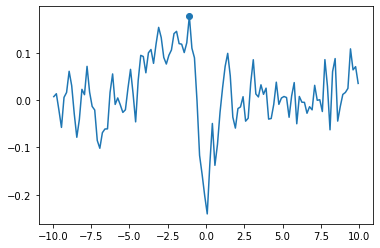

85
count: 94 Xaxis: 0.0600000000000048
0.16840607243102568


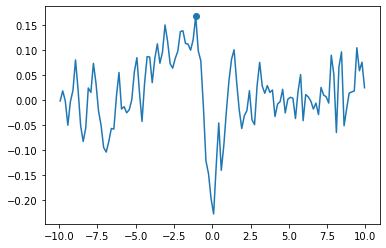

86
count: 95 Xaxis: 0.050000000000004
0.15593909054700816


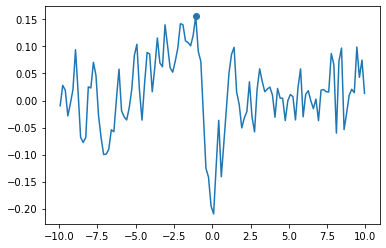

87
count: 96 Xaxis: 0.0400000000000032
0.14626384676148518


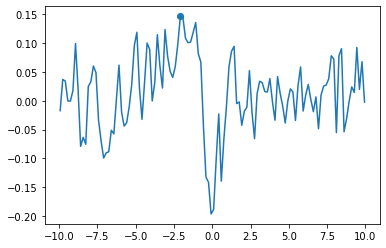

88
count: 97 Xaxis: 0.0300000000000024
0.14342580972515862


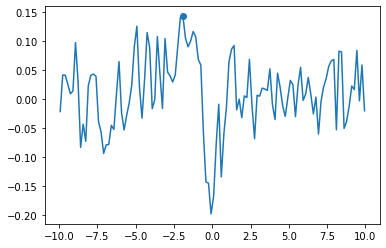

89
count: 98 Xaxis: 0.0200000000000016
0.13481051567305258


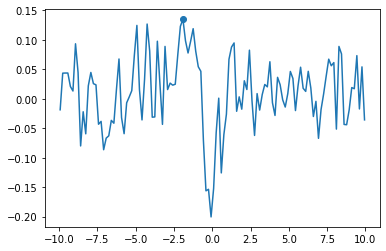

90
count: 99 Xaxis: 0.0100000000000008
0.1285431214782875


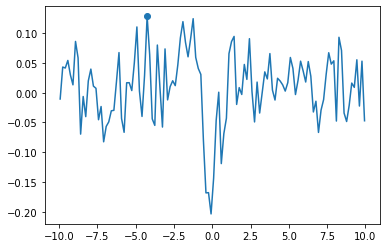

91
count: 100 Xaxis: -0.0
0.13106090123619651


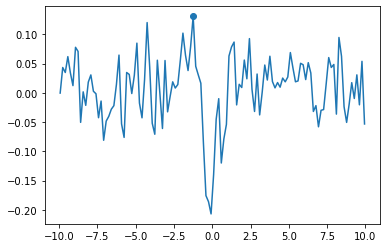

92
count: 101 Xaxis: -0.0100000000000008
0.13375898876984138


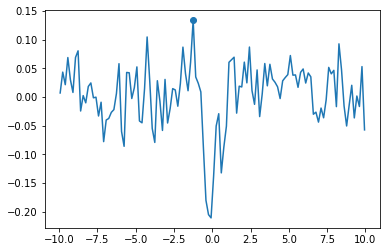

93
count: 102 Xaxis: -0.0200000000000016
0.12918683611019333


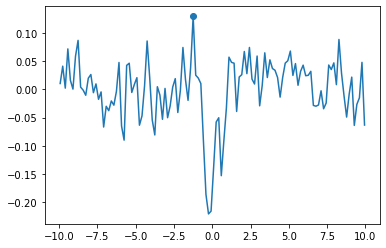

94
count: 107 Xaxis: -0.0700000000000056
0.13090023017139174


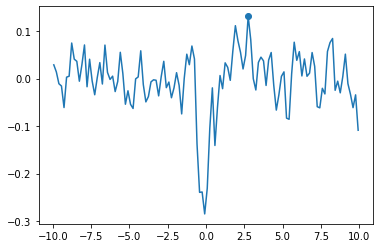

95
count: 108 Xaxis: -0.0800000000000064
0.13327778600068996


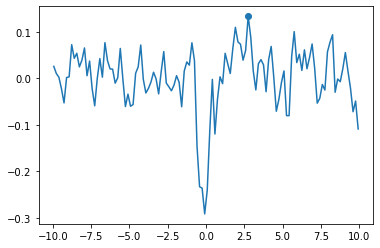

96
count: 109 Xaxis: -0.09000000000000719
0.13253493789670756


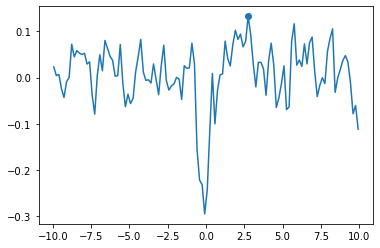

97
count: 110 Xaxis: -0.100000000000008
0.13201320017651597


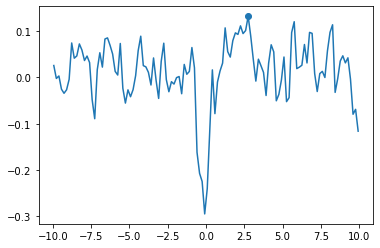

98
count: 111 Xaxis: -0.1100000000000088
0.13591339723370766


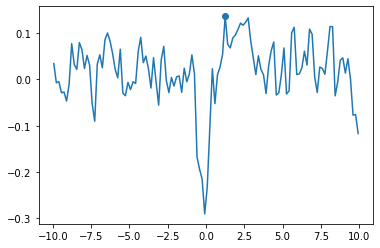

99
count: 112 Xaxis: -0.1200000000000096
0.16284309391085117


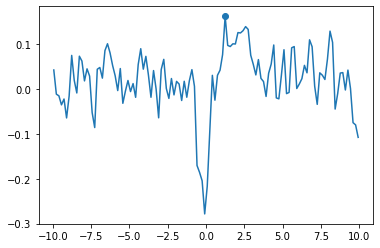

100
count: 113 Xaxis: -0.13000000000001039
0.1837623186820565


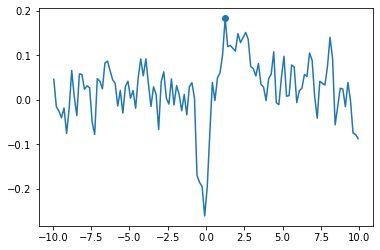

101
count: 114 Xaxis: -0.1400000000000112
0.19598953454988077


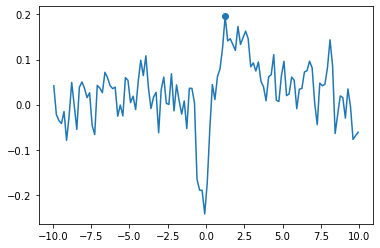

102
count: 115 Xaxis: -0.15000000000001198
0.20005196417332627


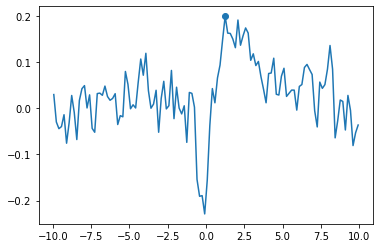

103
count: 116 Xaxis: -0.1600000000000128
0.19929399886677857


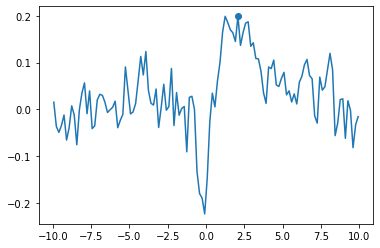

104
count: 117 Xaxis: -0.17000000000001358
0.21167461434015422


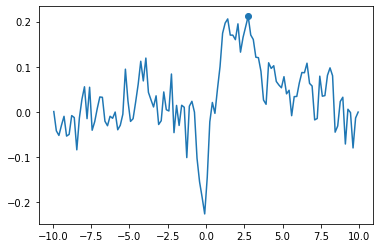

105
count: 118 Xaxis: -0.18000000000001437
0.22973737045685994


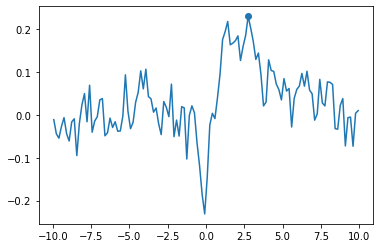

106
count: 119 Xaxis: -0.19000000000001518
0.23915348097216338


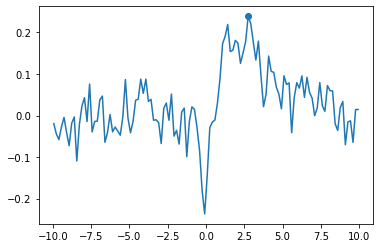

107
count: 120 Xaxis: -0.200000000000016
0.2424834212006317


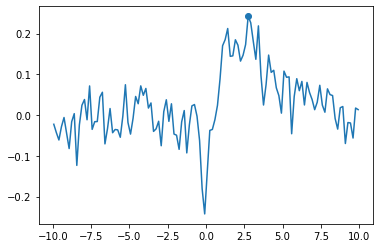

108
count: 121 Xaxis: -0.21000000000001678
0.25163532853002835


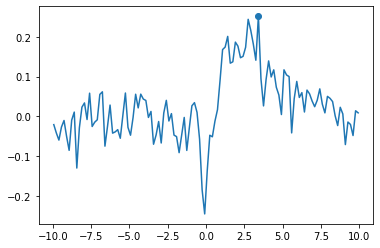

109
count: 122 Xaxis: -0.2200000000000176
0.26888097917253617


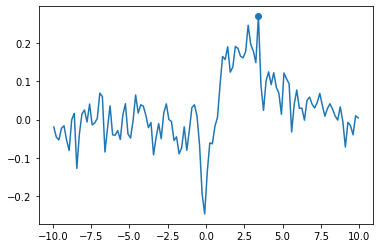

110
count: 123 Xaxis: -0.23000000000001836
0.26750561672088224


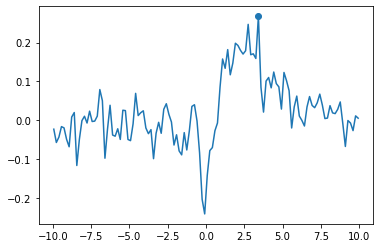

111
count: 124 Xaxis: -0.2400000000000192
0.25054867868311703


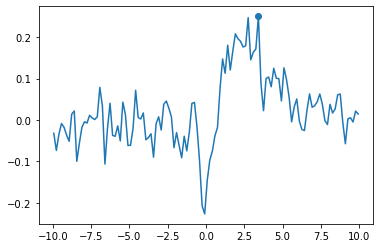

112
count: 125 Xaxis: -0.25000000000002
0.24814162244365434


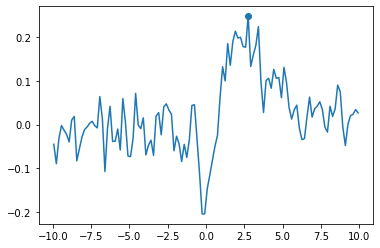

113
count: 126 Xaxis: -0.26000000000002077
0.251141344444477


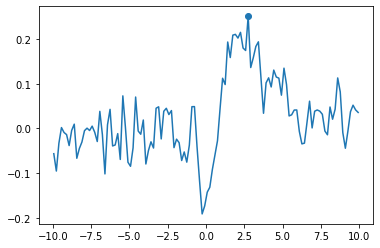

114
count: 127 Xaxis: -0.2700000000000216
0.25695070915389806


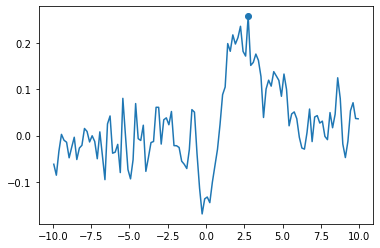

115
count: 128 Xaxis: -0.2800000000000224
0.2641936019208515


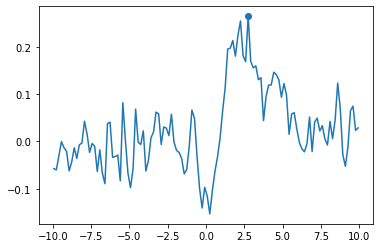

116
count: 129 Xaxis: -0.2900000000000232
0.26968355198368954


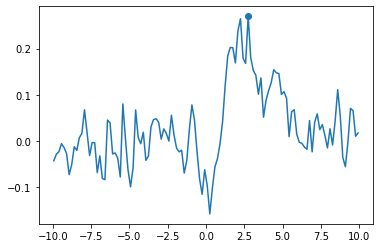

117
count: 130 Xaxis: -0.30000000000002397
0.27008999019744806


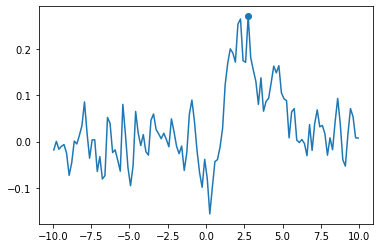

118
count: 131 Xaxis: -0.31000000000002476
0.2664658341673203


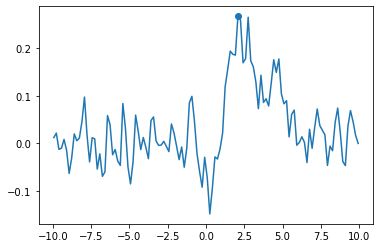

119
count: 132 Xaxis: -0.3200000000000256
0.27485684963176027


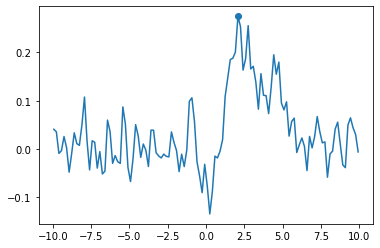

120
count: 133 Xaxis: -0.3300000000000264
0.2735200516763143


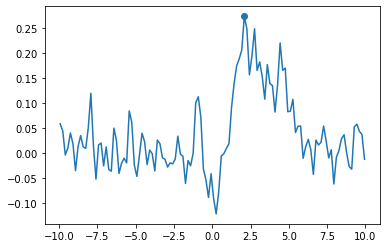

121
count: 134 Xaxis: -0.34000000000002717
0.259258167072403


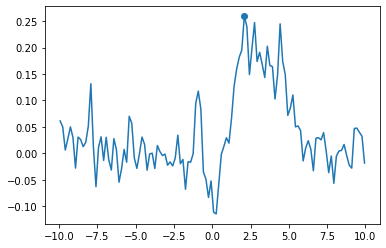

122
count: 135 Xaxis: -0.350000000000028
0.2625357804063242


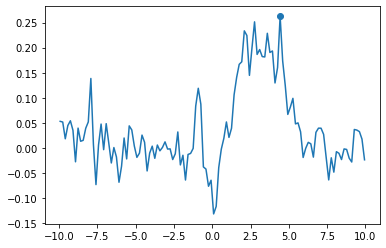

123
count: 136 Xaxis: -0.36000000000002874
0.271768855775008


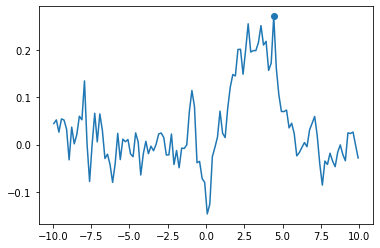

124
count: 137 Xaxis: -0.3700000000000296
0.2757201630738564


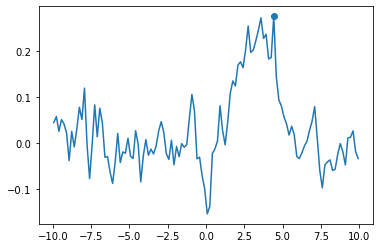

125
count: 138 Xaxis: -0.38000000000003037
0.2909195959146018


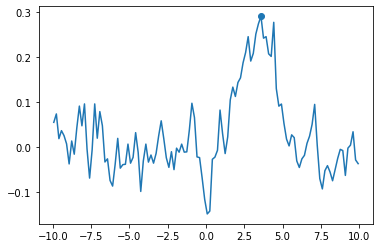

126
count: 139 Xaxis: -0.39000000000003116
0.3060155599960126


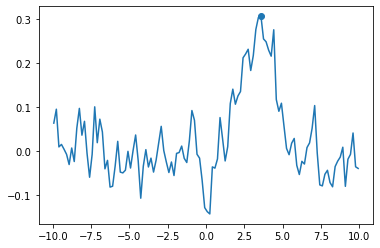

127
count: 140 Xaxis: -0.400000000000032
0.3318862645246554


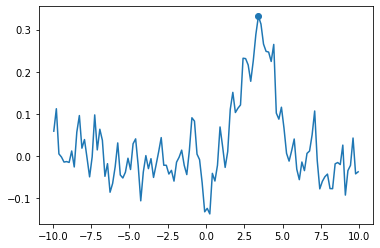

128
count: 141 Xaxis: -0.4100000000000328
0.3527624409616692


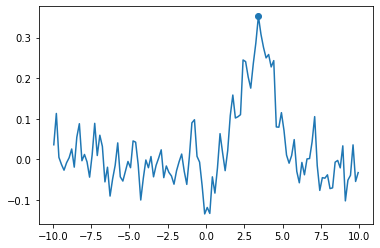

129
count: 142 Xaxis: -0.42000000000003357
0.36071760245249607


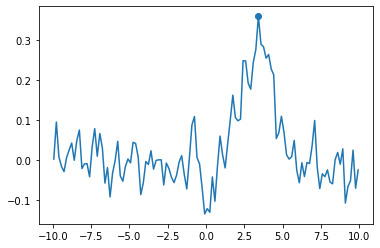

130
count: 143 Xaxis: -0.43000000000003435
0.3563078247825615


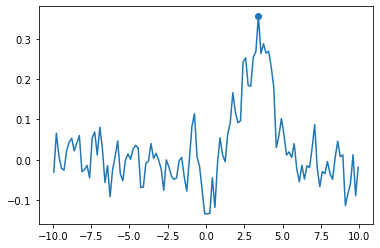

131
count: 144 Xaxis: -0.4400000000000352
0.3455061945132911


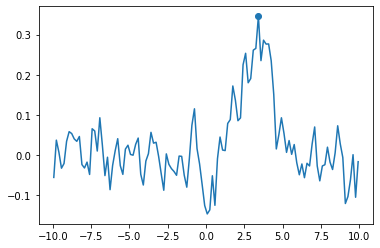

132
count: 145 Xaxis: -0.45000000000003604
0.33451878785854205


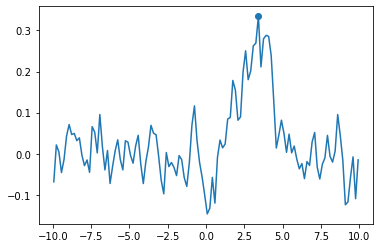

133
count: 146 Xaxis: -0.4600000000000367
0.32485650248781894


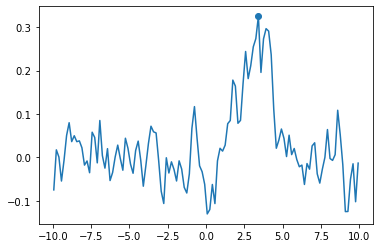

134
count: 147 Xaxis: -0.47000000000003755
0.3131028767729731


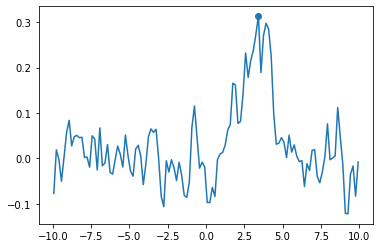

135
count: 148 Xaxis: -0.4800000000000384
0.2951934871962294


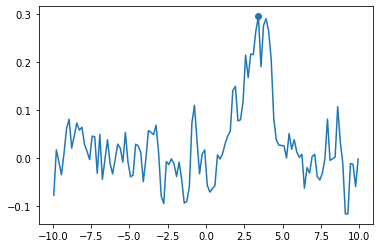

136
count: 149 Xaxis: -0.4900000000000392
0.2865781495856936


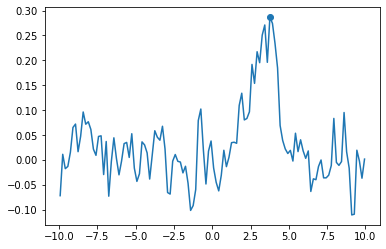

137
count: 150 Xaxis: -0.50000000000004
0.29829940541822


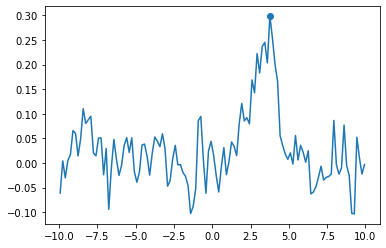

138
count: 151 Xaxis: -0.5100000000000408
0.3064644440601114


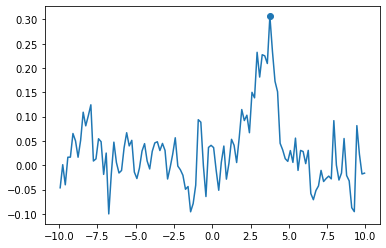

139
count: 152 Xaxis: -0.5200000000000415
0.30807147382893163


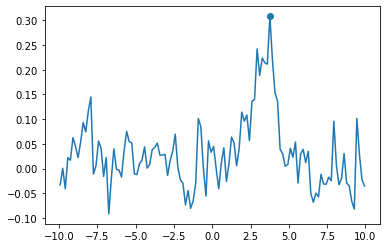

140
count: 153 Xaxis: -0.5300000000000423
0.3024574126538937


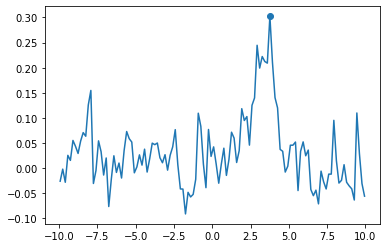

141
count: 154 Xaxis: -0.5400000000000432
0.29034645155752514


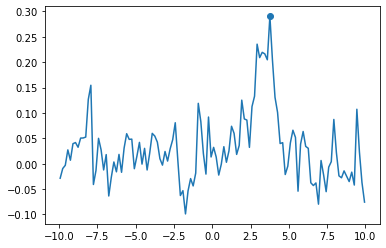

142
count: 155 Xaxis: -0.550000000000044
0.2724394705674058


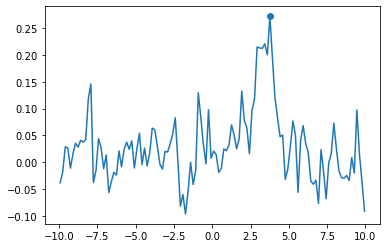

143
count: 156 Xaxis: -0.5600000000000448
0.2492458703527518


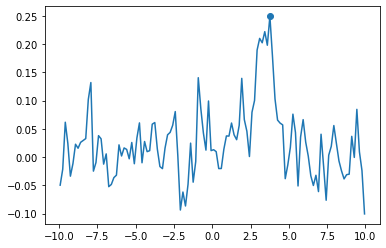

144
count: 157 Xaxis: -0.5700000000000456
0.22239688070840202


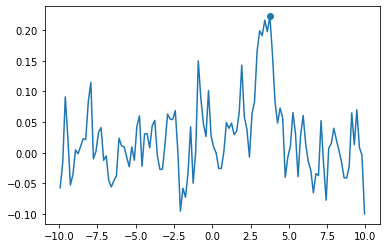

145
count: 158 Xaxis: -0.5800000000000464
0.2012755922951328


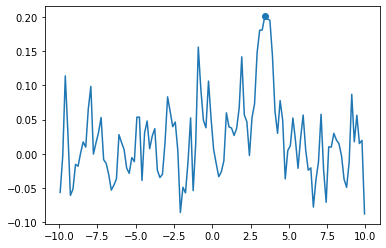

146
count: 159 Xaxis: -0.5900000000000472
0.19768234391631267


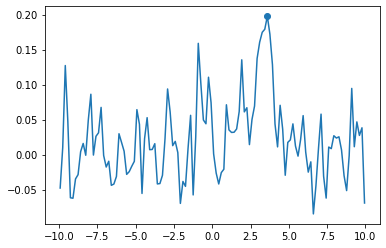

147
count: 160 Xaxis: -0.6000000000000479
0.1975213551268098


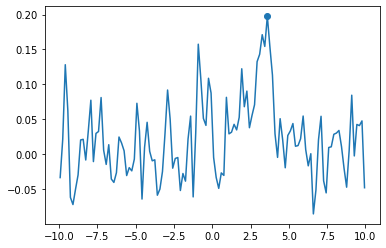

148
count: 161 Xaxis: -0.6100000000000488
0.1961695975624025


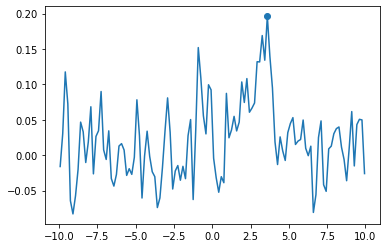

149
count: 162 Xaxis: -0.6200000000000495
0.1924502880228829


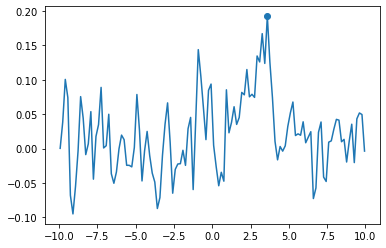

150
count: 163 Xaxis: -0.6300000000000503
0.18458691136765992


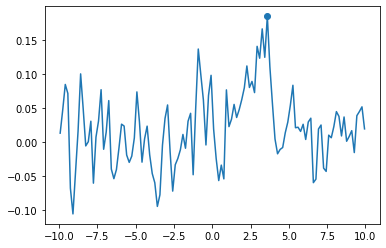

151
count: 164 Xaxis: -0.6400000000000512
0.1715216872325982


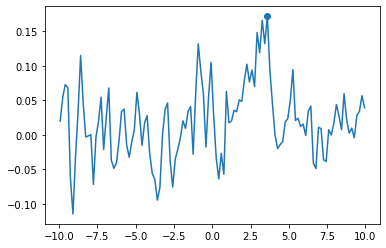

152
count: 165 Xaxis: -0.650000000000052
0.1653503341385658


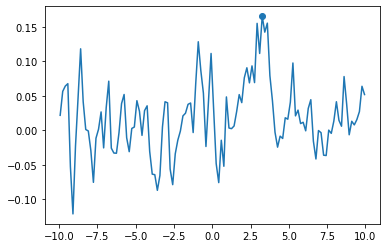

153
count: 166 Xaxis: -0.6600000000000528
0.16485767905396642


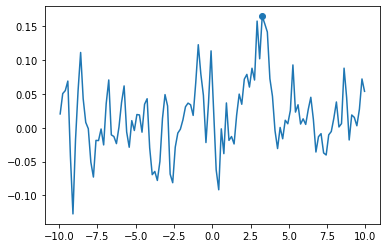

154
count: 167 Xaxis: -0.6700000000000536
0.16476861310366075


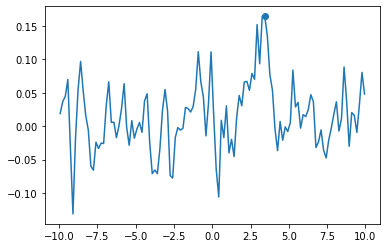

155
count: 168 Xaxis: -0.6800000000000543
0.17256980016827583


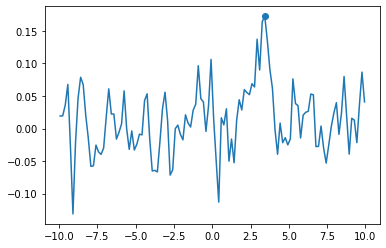

156
count: 169 Xaxis: -0.6900000000000551
0.17123574212746462


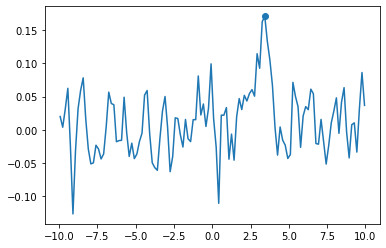

157
count: 170 Xaxis: -0.700000000000056
0.1586739794274763


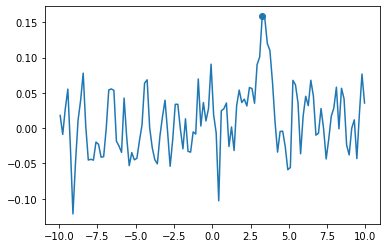

158
count: 171 Xaxis: -0.7100000000000568
0.14919864281546324


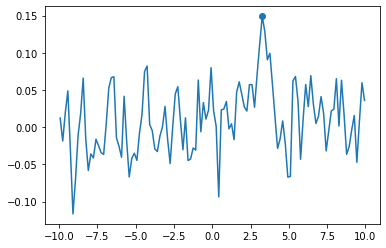

159
count: 172 Xaxis: -0.7200000000000575
0.13567969796713442


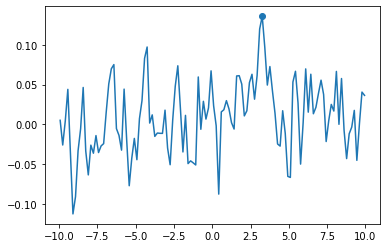

160
count: 180 Xaxis: -0.800000000000064
0.1304711243201382


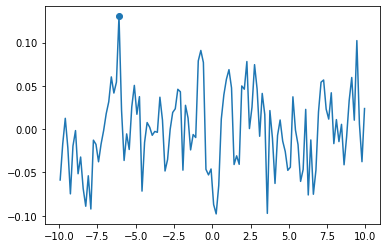

161
count: 181 Xaxis: -0.8100000000000648
0.13991134954267181


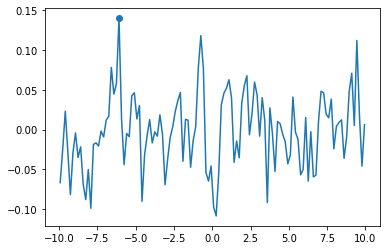

162
count: 182 Xaxis: -0.8200000000000656
0.13897444284521043


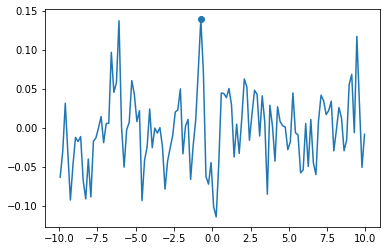

163
count: 183 Xaxis: -0.8300000000000664
0.1514372232486494


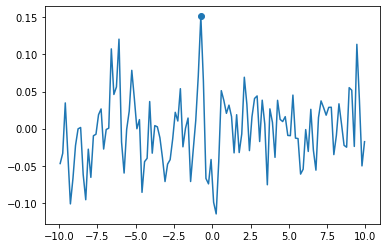

164
count: 184 Xaxis: -0.8400000000000671
0.15413361406535842


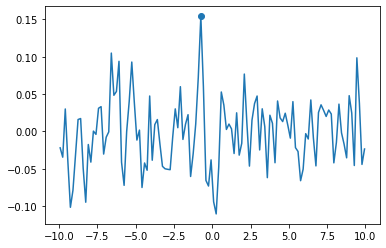

165
count: 185 Xaxis: -0.8500000000000679
0.1468361197039485


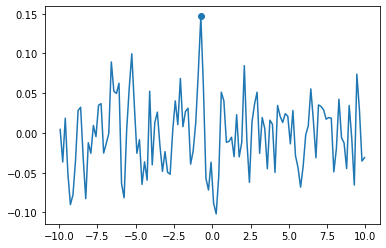

166
count: 186 Xaxis: -0.8600000000000687
0.13143265847975272


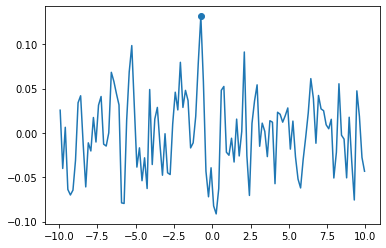

In [71]:
liste = np.linspace(1900,2100,200, dtype=int)
#regionlist = np.linspace(0,200,200, dtype=int)

#meanint = np.mean(data_CO[:,1960, 1900])
#stdint = np.std(data_CO[:,1960, 1900])


max_int = []
peakint1 = []
count = -1
plt.figure(figsize=(7,5))
for j, item in enumerate(liste[:],0):
    count += 1
    #print(item)
    intensity1 = np.zeros((data_CO[:,1960,1900].shape))
    #print(intensity.shape)
    for i in range(80): # integrating over 80 declination slices to sum the intensity?
        index = 1960+i
        intensity1 += data_CO[:,index, item]
    #peakint.append(v_cen[np.argmax(intensity)])
    
    #print('count:', count,'Xaxis:', x_cen[j+100])

    #print(np.argmin(intensity))
    #norm = ((intensity))#-meanint))
    #stddev_intensity = np.std(norm)
    max_int = np.max(intensity1)
    
    if max_int > 0.125:
        print(len(peakint1))
        peakint1.append(v_cen[np.argmax(intensity1)])
        print('count:', count,'Xaxis:', x_cen[j+100])
        #plt.subplot(50,2,j+1); 
        print((np.max(intensity1)))
        plt.plot(v_cen, intensity1)
        #plt.hlines(stddev_intensity, -10, 20)
        #plt.hlines(-stddev_intensity, -10, 20)

        plt.scatter(v_cen[np.argmax(intensity1)], max_int)
        #plt.xlabel('velocity [km/s]')
        #plt.ylabel('Intensity of 80 images [Jy/beam]')
        #plt.title(f'RA = {region[regionlist[j]]}')
        #fig.tight_layout()
        plt.show();



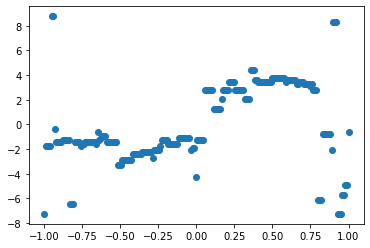

In [72]:
dfx = np.linspace(-1, 1, 200)
dfy = peakint
len(dfy)

datf = pd.DataFrame({'x': dfx, 'peak': dfy})
xd = datf['x']
yd = datf['peak']
plt.scatter(xd,yd)
#datf['peak'][10:190].shape

In [73]:
dfx1 = np.linspace(-1, 1, 167)
#dfx1 = intensity1
dfy1 = peakint1
len(dfy1)

datf1 = pd.DataFrame({'x': dfx1, 'peak': dfy1})
#datf = datf.drop(datf.index[80:130])
print(len(dfy1))
datf1


167


,x,peak
0,-1.000000,-1.753653
1,-0.987952,-1.753653
2,-0.975904,-1.419647
3,-0.963855,-1.419647
4,-0.951807,-1.419647
...,...,...
162,0.951807,-0.751632
163,0.963855,-0.751632
164,0.975904,-0.751632
165,0.987952,-0.751632


In [74]:
with pd.option_context('display.max_rows', None,):
    print(datf1)

            x      peak
0   -1.000000 -1.753653
1   -0.987952 -1.753653
2   -0.975904 -1.419647
3   -0.963855 -1.419647
4   -0.951807 -1.419647
5   -0.939759 -1.252643
6   -0.927711 -1.252643
7   -0.915663 -1.252643
8   -0.903614 -1.252643
9   -0.891566 -1.252643
10  -0.879518 -6.429664
11  -0.867470 -6.429664
12  -0.855422 -6.429664
13  -0.843373 -1.419647
14  -0.831325 -1.419647
15  -0.819277 -1.419647
16  -0.807229 -1.419647
17  -0.795181 -1.753653
18  -0.783133 -1.586650
19  -0.771084 -1.586650
20  -0.759036 -1.419647
21  -0.746988 -1.419647
22  -0.734940 -1.419647
23  -0.722892 -1.419647
24  -0.710843 -1.419647
25  -0.698795 -1.419647
26  -0.686747 -1.419647
27  -0.674699 -1.586650
28  -0.662651 -0.584628
29  -0.650602 -0.918636
30  -0.638554 -0.918636
31  -0.626506 -0.918636
32  -0.614458 -1.419647
33  -0.602410 -1.419647
34  -0.590361 -1.419647
35  -0.578313 -1.419647
36  -0.566265 -1.419647
37  -0.554217 -1.419647
38  -0.542169 -1.419647
39  -0.530120 -3.256673
40  -0.518072 -3

In [75]:

def pvplot1(kep, x, peak):
    
    initial_M = 1.989e30 
    M_sun = initial_M * u.kg
    print(x.shape)
    #xcen = [2000-int(len(x)/2):2000+int(len(x)/2)]
    param_new, cov_new = curve_fit(kep, x, peak, p0=[initial_M])
    fitted_M_new = param_new[0]
    print('Fitted Mass_new:', fitted_M_new, 'kg')

    Mnew = fitted_M_new * u.kg / M_sun
    print("Mnew =", Mnew, 'solarmasses')
    
    # P-V Diagram
    PV = plt.figure(figsize = (10,7))
    ke = plt.contourf(x_cen, v_cen, data_CO[:,1960:2040,1800:2200].sum(axis=1),np.arange(-1,1,0.4))
    plt.contour(x_cen, v_cen, data_CO[:,1960:2040,1800:2200].sum(axis=1),np.arange(0.1,1,0.4), colors='white')

    #plt.plot(x[0:83], kep(x[0:83], fitted_M_new), linestyle='--', linewidth=2,label='fit', color='r');
    #plt.plot(x[84:], kep(x[84:], fitted_M_new), linestyle='--', linewidth=2,label='fit', color='r');
    #plt.plot(x[:], kep(x[:], fitted_M_new), linestyle='--', linewidth=2,label='fit', color='r');
    
    plt.scatter(datf1['x'], datf1['peak'],label='data')
    
    if kep == kepler:
        print('This is kepler with -x/abs(x)')
    else:
        print('This is kepler without -x/abs(x)')
        

    #colorbar
    cbar = plt.colorbar(ke)
    cbar.set_label('[Jy/beam km/s]', labelpad=25, y=0.5, rotation=270);

    plt.title('P-V diagram with Kepler fit')
    plt.tight_layout()
    plt.xlabel('RA["]')
    plt.ylabel('Velocity [km/s]')
    #plt.xlim(-1,1)
    #plt.ylim(-10,10)
    #plt.savefig('PVkepler.png')
    plt.legend()
    plt.show();

(167,)


/lustre/hpc/software/astro/anaconda/anaconda3-2021.05/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


Fitted Mass_new: 1.989e+30 kg
Mnew = 1.0 solarmasses
This is kepler with -x/abs(x)


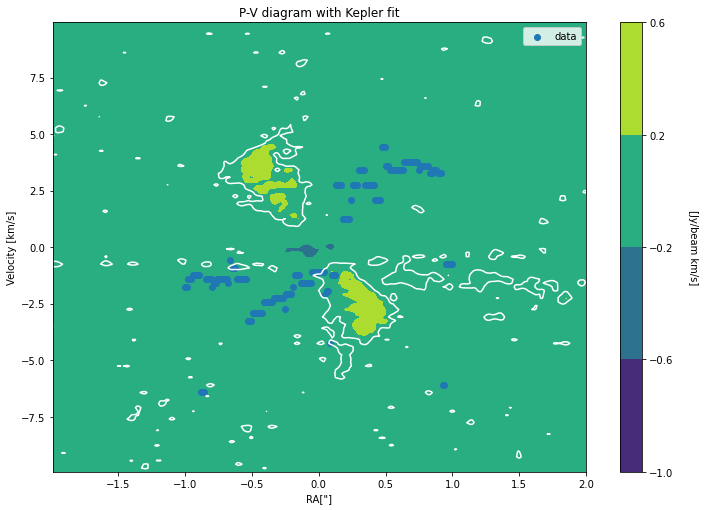

In [76]:
pvplot1(kepler, datf1['x'], datf1['peak'])

velocity: -0.7516319891340326
max_intensity: 0.13143265847975272


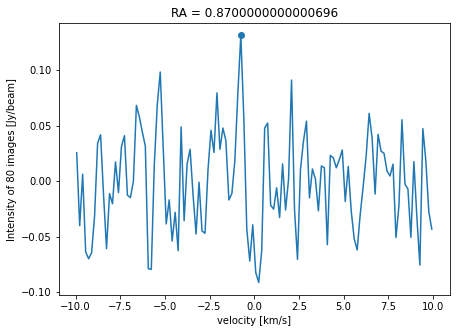

velocity: -0.7516319891340326
max_intensity: 0.1468361197039485


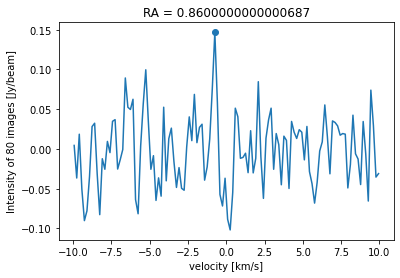

velocity: -0.7516319891340326
max_intensity: 0.15413361406535842


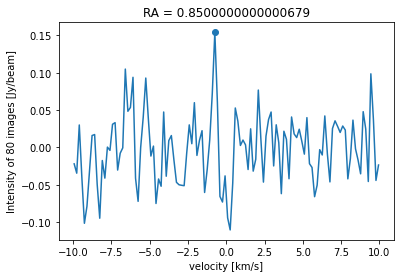

velocity: -0.7516319891340326
max_intensity: 0.1514372232486494


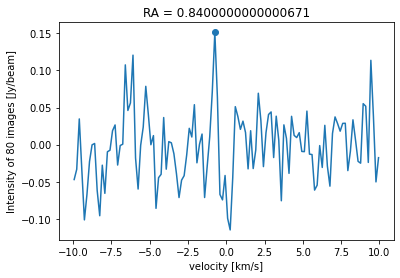

velocity: -0.7516319891340326
max_intensity: 0.13897444284521043


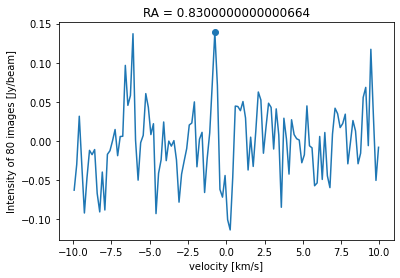

velocity: 3.2565201299034685
max_intensity: 0.13567969796713442


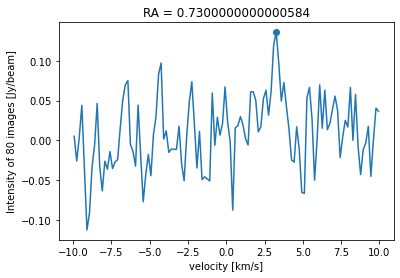

velocity: 3.2565201299034685
max_intensity: 0.14919864281546324


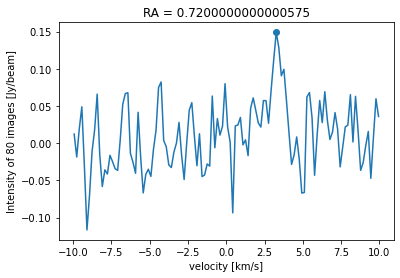

velocity: 3.2565201299034685
max_intensity: 0.1586739794274763


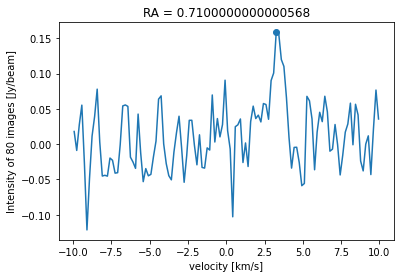

velocity: 3.423528794046651
max_intensity: 0.17123574212746462


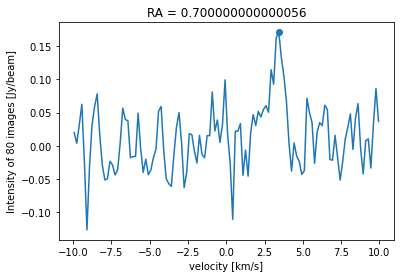

velocity: 3.423528794046651
max_intensity: 0.17256980016827583


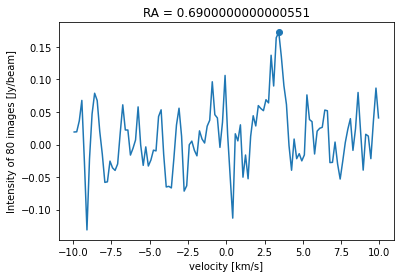

velocity: 3.423528794046651
max_intensity: 0.16476861310366075


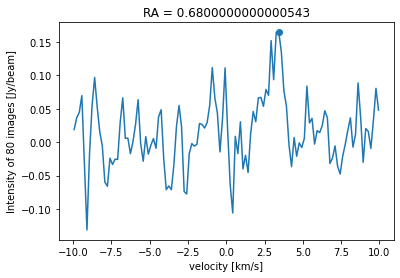

velocity: 3.2565201299034685
max_intensity: 0.16485767905396642


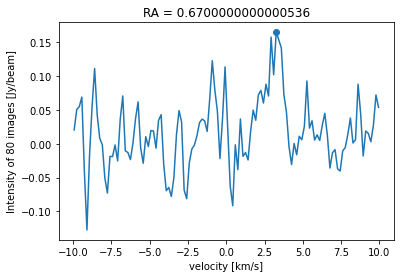

velocity: 3.2565201299034685
max_intensity: 0.1653503341385658


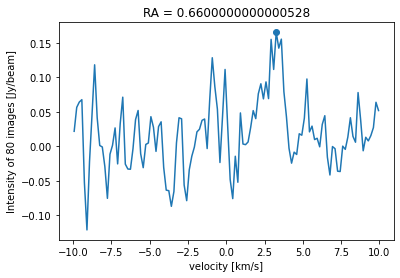

velocity: 3.590537644257675
max_intensity: 0.1715216872325982


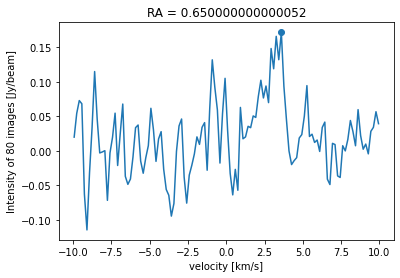

velocity: 3.590537644257675
max_intensity: 0.18458691136765992


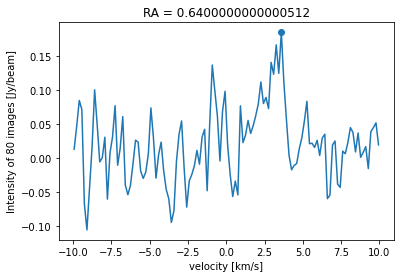

velocity: 3.590537644257675
max_intensity: 0.1924502880228829


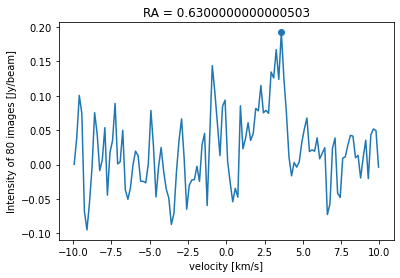

velocity: 3.590537644257675
max_intensity: 0.1961695975624025


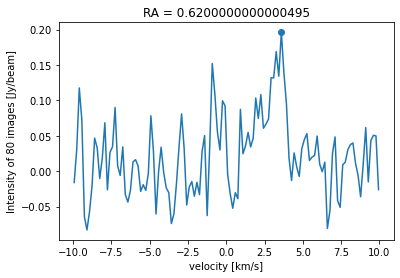

velocity: 3.590537644257675
max_intensity: 0.1975213551268098


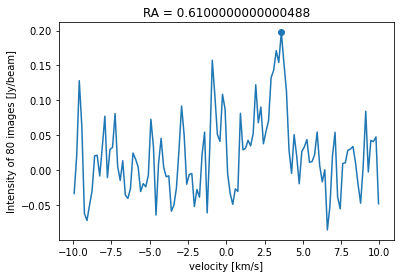

velocity: 3.590537644257675
max_intensity: 0.19768234391631267


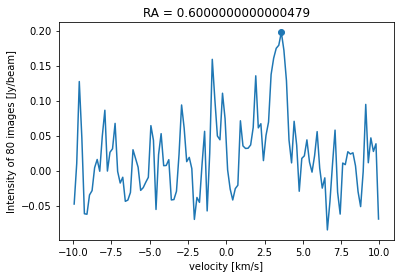

velocity: 3.423528794046651
max_intensity: 0.2012755922951328


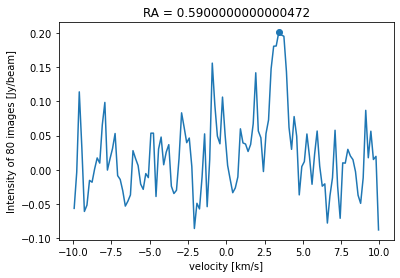

velocity: 3.757546680536538
max_intensity: 0.22239688070840202


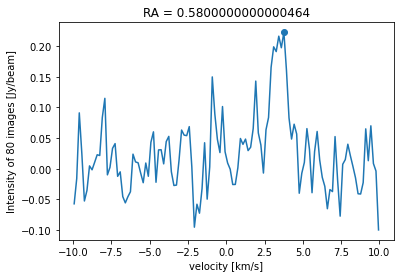

velocity: 3.757546680536538
max_intensity: 0.2492458703527518


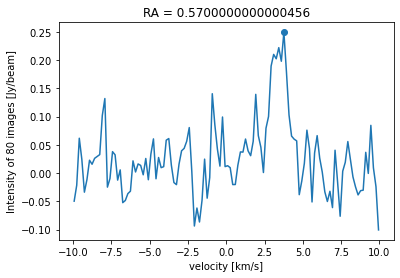

velocity: 3.757546680536538
max_intensity: 0.2724394705674058


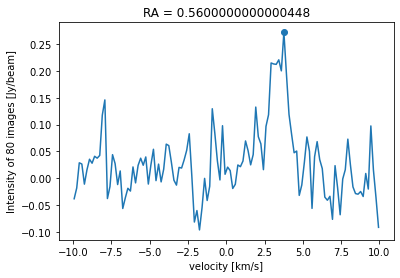

velocity: 3.757546680536538
max_intensity: 0.29034645155752514


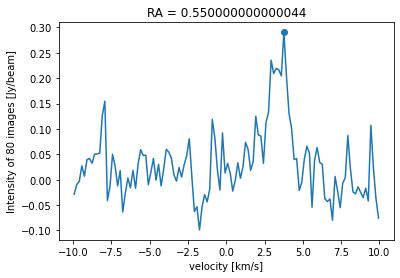

velocity: 3.757546680536538
max_intensity: 0.3024574126538937


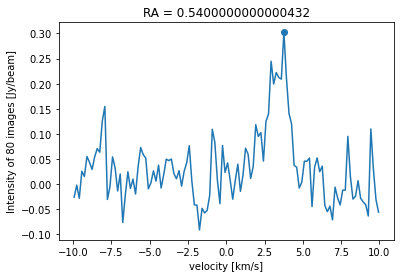

velocity: 3.757546680536538
max_intensity: 0.30807147382893163


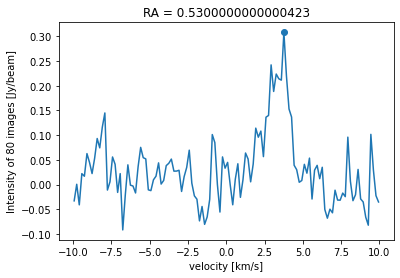

velocity: 3.757546680536538
max_intensity: 0.3064644440601114


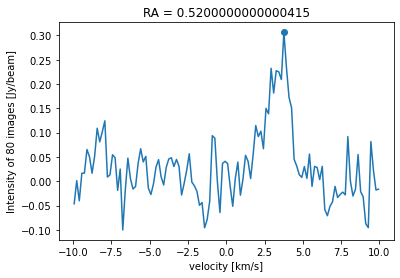

velocity: 3.757546680536538
max_intensity: 0.29829940541822


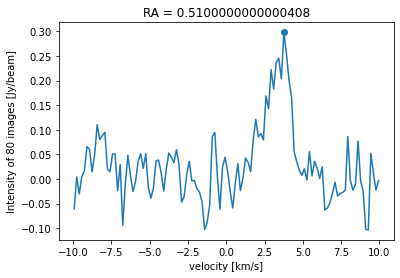

velocity: 3.757546680536538
max_intensity: 0.2865781495856936


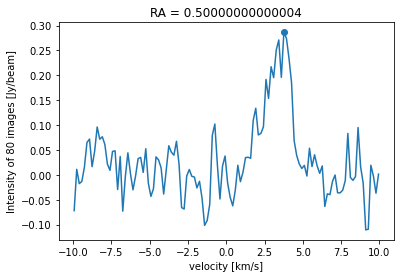

velocity: 3.423528794046651
max_intensity: 0.2951934871962294


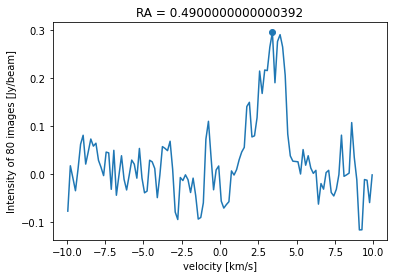

velocity: 3.423528794046651
max_intensity: 0.3131028767729731


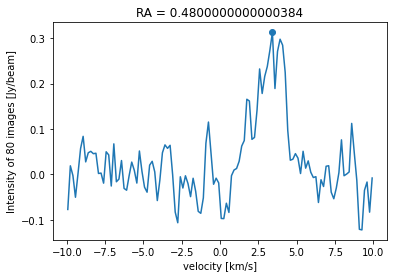

velocity: 3.423528794046651
max_intensity: 0.32485650248781894


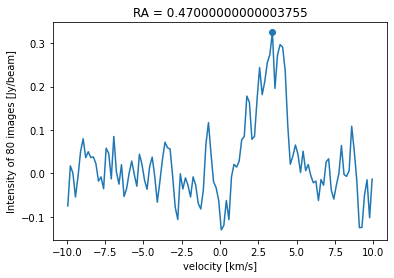

velocity: 3.423528794046651
max_intensity: 0.33451878785854205


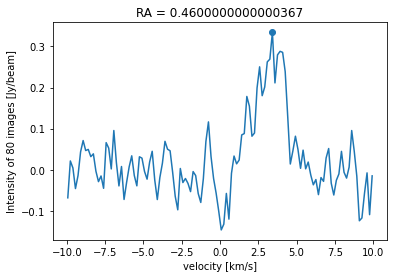

velocity: 3.423528794046651
max_intensity: 0.3455061945132911


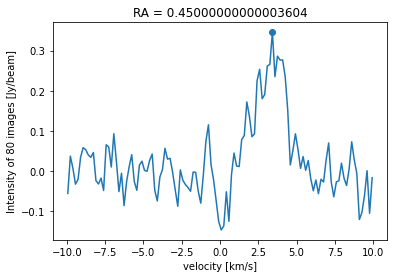

velocity: 3.423528794046651
max_intensity: 0.3563078247825615


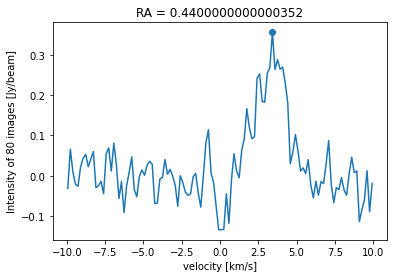

velocity: 3.423528794046651
max_intensity: 0.36071760245249607


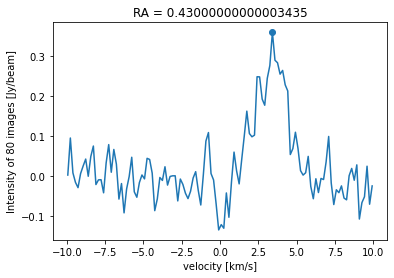

velocity: 3.423528794046651
max_intensity: 0.3527624409616692


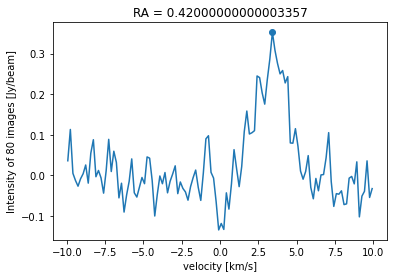

velocity: 3.423528794046651
max_intensity: 0.3318862645246554


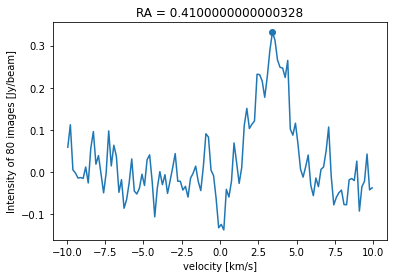

velocity: 3.590537644257675
max_intensity: 0.3060155599960126


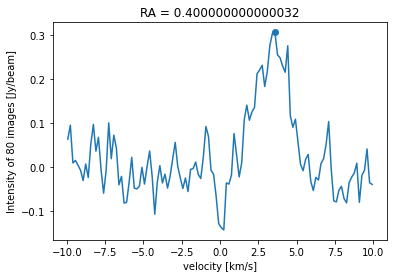

velocity: 3.590537644257675
max_intensity: 0.2909195959146018


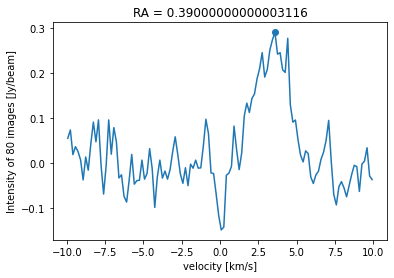

velocity: 4.425584686330411
max_intensity: 0.2757201630738564


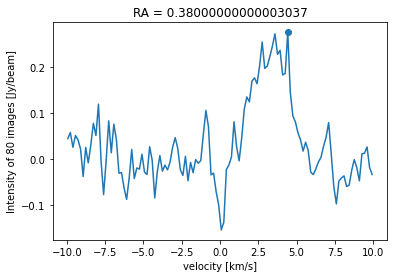

velocity: 4.425584686330411
max_intensity: 0.271768855775008


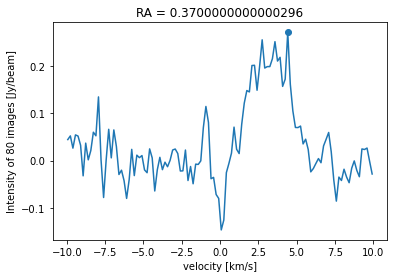

velocity: 4.425584686330411
max_intensity: 0.2625357804063242


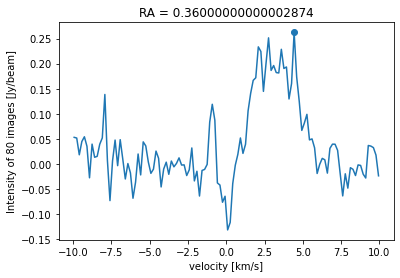

velocity: 2.0874646908937358
max_intensity: 0.259258167072403


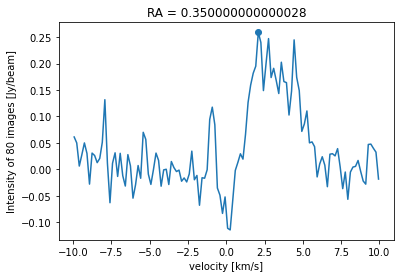

velocity: 2.0874646908937358
max_intensity: 0.2735200516763143


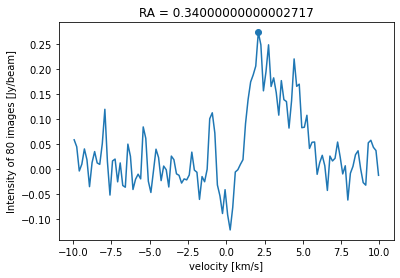

velocity: 2.0874646908937358
max_intensity: 0.27485684963176027


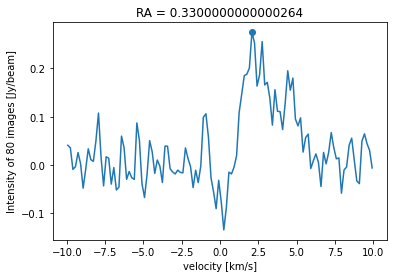

velocity: 2.0874646908937358
max_intensity: 0.2664658341673203


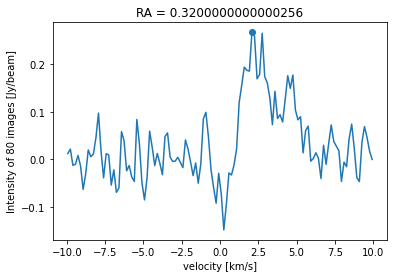

velocity: 2.755495253927463
max_intensity: 0.27008999019744806


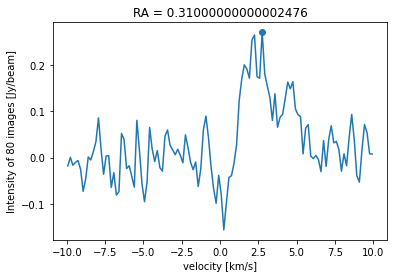

velocity: 2.755495253927463
max_intensity: 0.26968355198368954


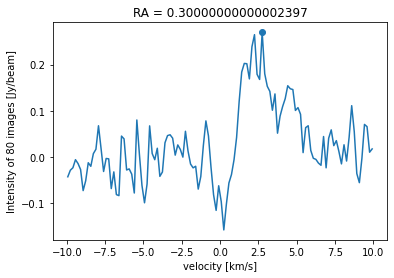

velocity: 2.755495253927463
max_intensity: 0.2641936019208515


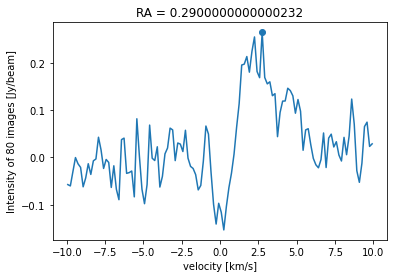

velocity: 2.755495253927463
max_intensity: 0.25695070915389806


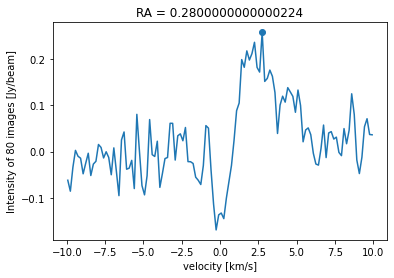

velocity: 2.755495253927463
max_intensity: 0.251141344444477


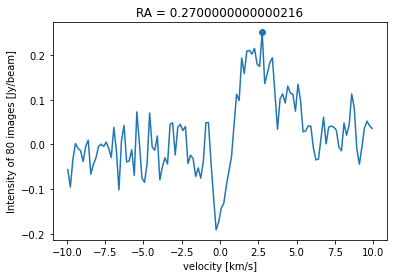

velocity: 2.755495253927463
max_intensity: 0.24814162244365434


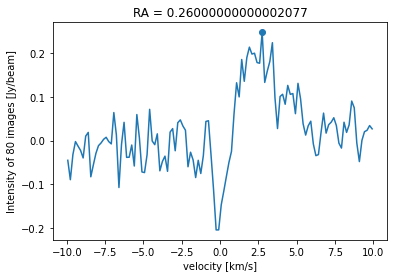

velocity: 3.423528794046651
max_intensity: 0.25054867868311703


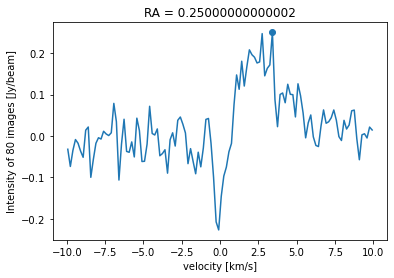

velocity: 3.423528794046651
max_intensity: 0.26750561672088224


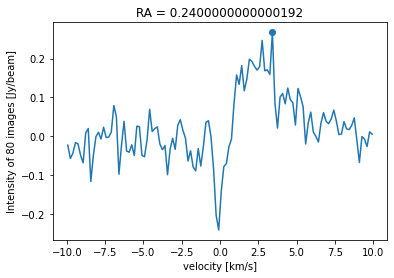

velocity: 3.423528794046651
max_intensity: 0.26888097917253617


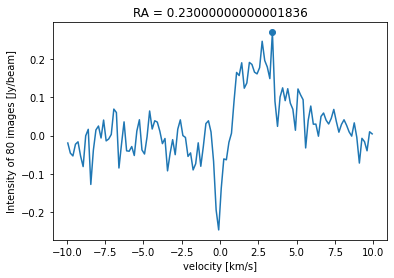

velocity: 3.423528794046651
max_intensity: 0.25163532853002835


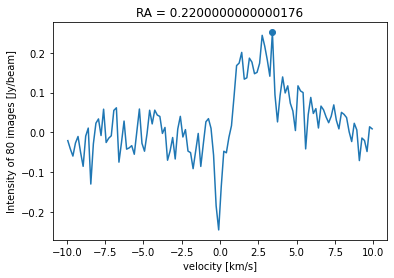

velocity: 2.755495253927463
max_intensity: 0.2424834212006317


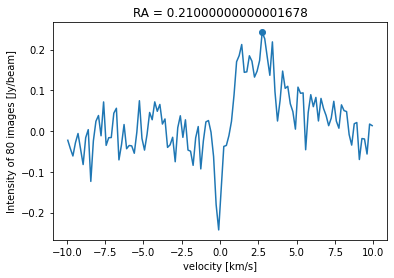

velocity: 2.755495253927463
max_intensity: 0.23915348097216338


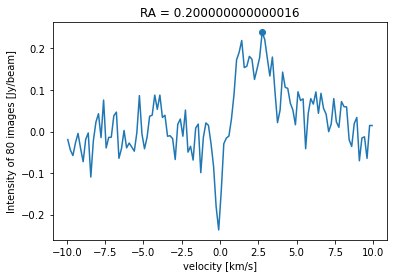

velocity: 2.755495253927463
max_intensity: 0.22973737045685994


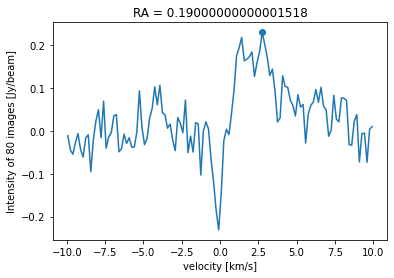

velocity: 2.755495253927463
max_intensity: 0.21167461434015422


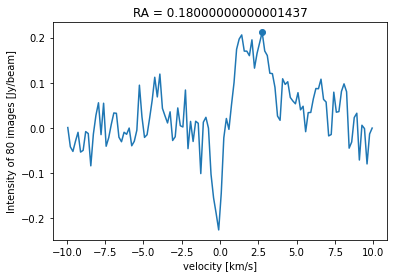

velocity: 2.0874646908937358
max_intensity: 0.19929399886677857


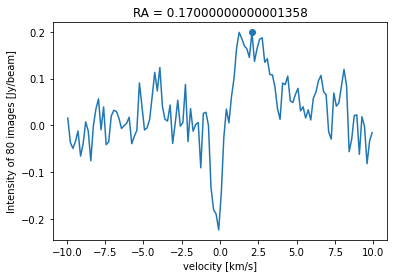

velocity: 1.2524306736163817
max_intensity: 0.20005196417332627


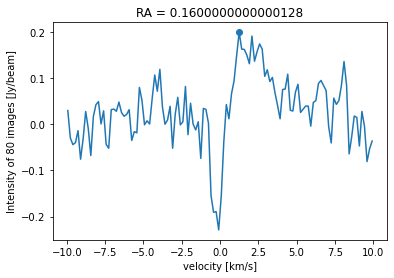

velocity: 1.2524306736163817
max_intensity: 0.19598953454988077


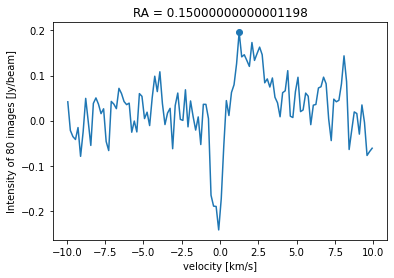

velocity: 1.2524306736163817
max_intensity: 0.1837623186820565


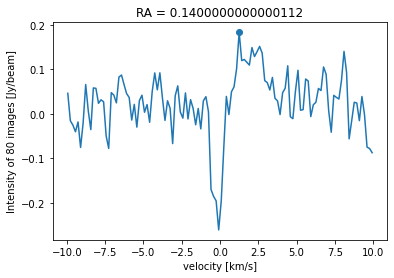

velocity: 1.2524306736163817
max_intensity: 0.16284309391085117


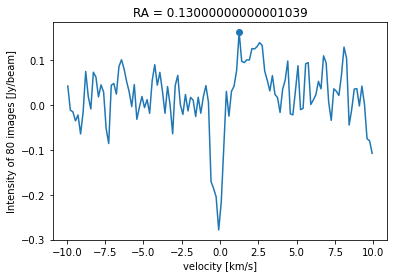

velocity: 1.2524306736163817
max_intensity: 0.13591339723370766


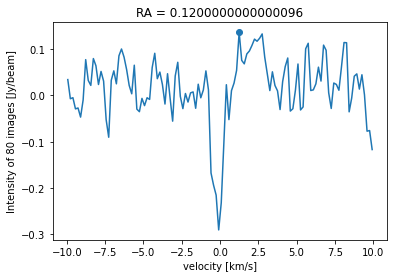

velocity: 2.755495253927463
max_intensity: 0.13201320017651597


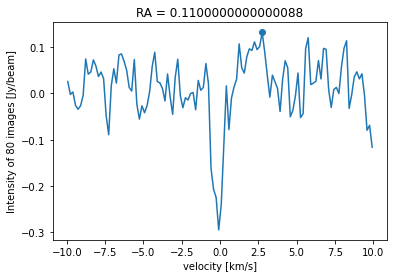

velocity: 2.755495253927463
max_intensity: 0.13253493789670756


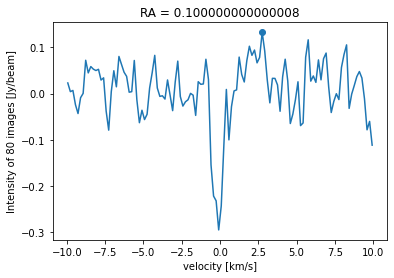

velocity: 2.755495253927463
max_intensity: 0.13327778600068996


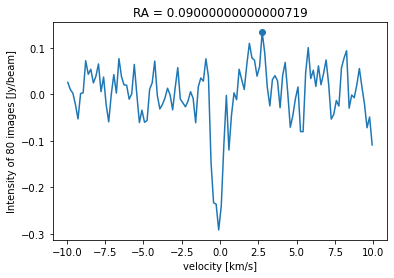

velocity: 2.755495253927463
max_intensity: 0.13090023017139174


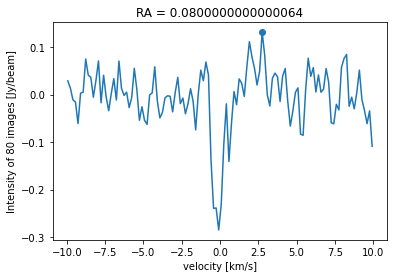

velocity: -1.252643468411442
max_intensity: 0.12918683611019333


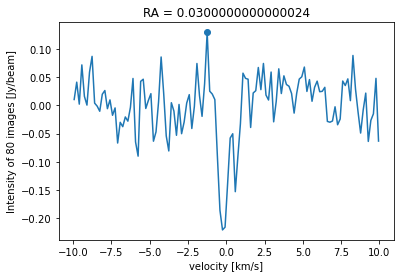

velocity: -1.252643468411442
max_intensity: 0.13375898876984138


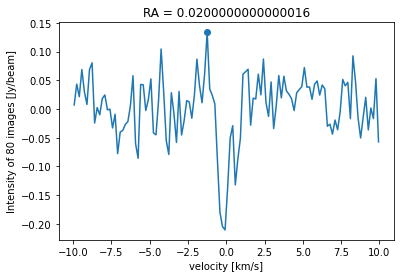

velocity: -1.252643468411442
max_intensity: 0.13106090123619651


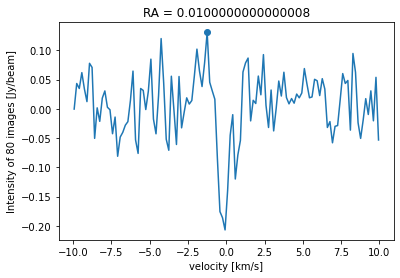

velocity: -4.258677178788193
max_intensity: 0.1285431214782875


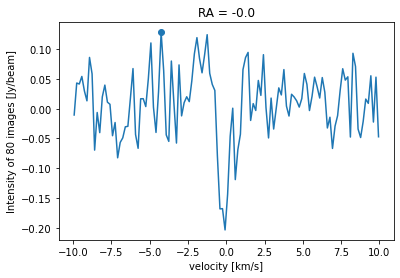

velocity: -1.9206561692578643
max_intensity: 0.13481051567305258


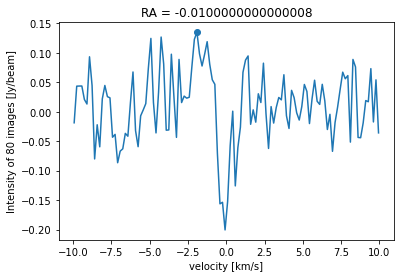

velocity: -1.9206561692578643
max_intensity: 0.14342580972515862


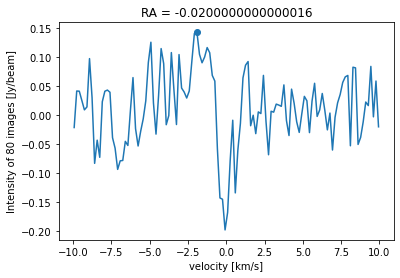

velocity: -2.0876588793231137
max_intensity: 0.14626384676148518


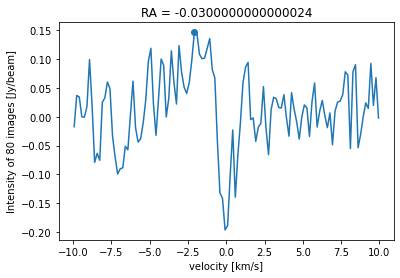

velocity: -1.0856398280534805
max_intensity: 0.15593909054700816


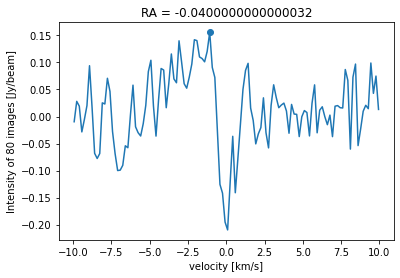

velocity: -1.0856398280534805
max_intensity: 0.16840607243102568


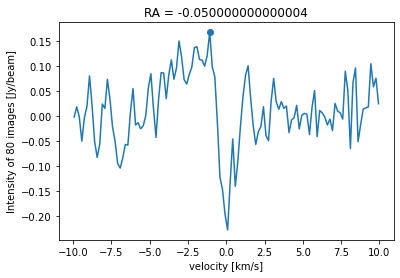

velocity: -1.0856398280534805
max_intensity: 0.17696484361295006


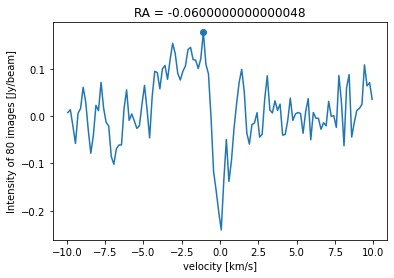

velocity: -1.0856398280534805
max_intensity: 0.18624775648640934


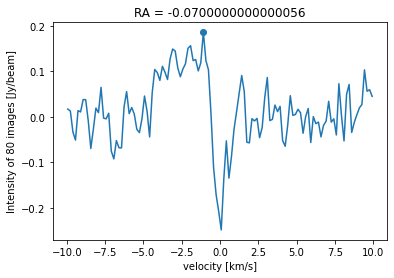

velocity: -1.0856398280534805
max_intensity: 0.1958504960348364


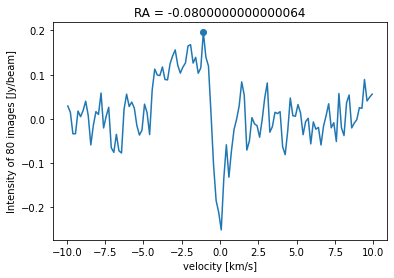

velocity: -1.0856398280534805
max_intensity: 0.20066245911584701


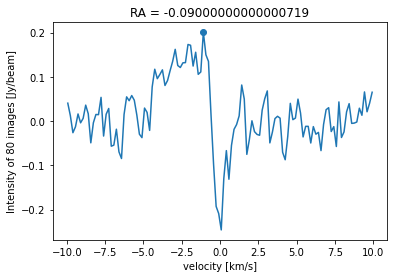

velocity: -1.0856398280534805
max_intensity: 0.19633370399242267


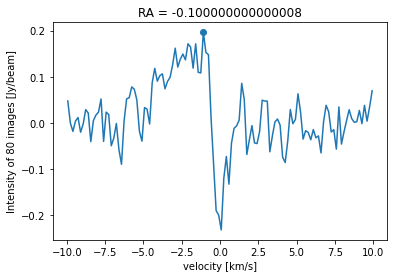

velocity: -1.0856398280534805
max_intensity: 0.18404583253141027


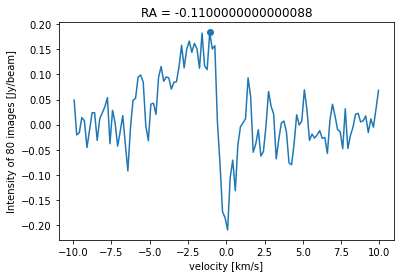

velocity: -1.5866501909703357
max_intensity: 0.1878081589602516


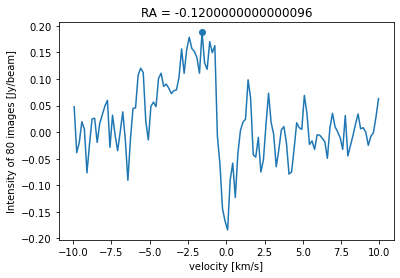

velocity: -1.5866501909703357
max_intensity: 0.19162238676653942


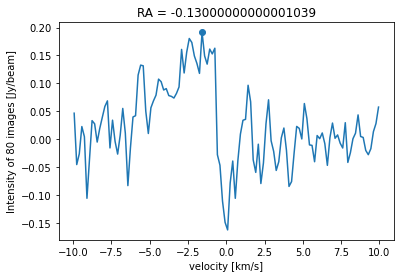

velocity: -1.5866501909703357
max_intensity: 0.1996632214413694


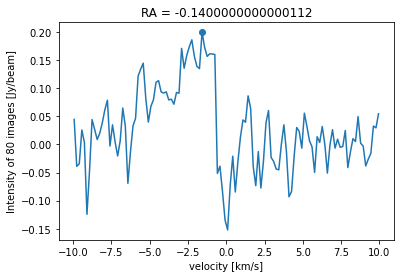

velocity: -1.5866501909703357
max_intensity: 0.2148889112559118


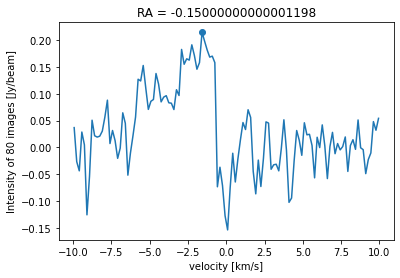

velocity: -1.5866501909703357
max_intensity: 0.2345733773054235


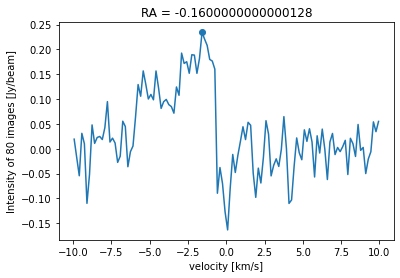

velocity: -1.5866501909703357
max_intensity: 0.25210692861583084


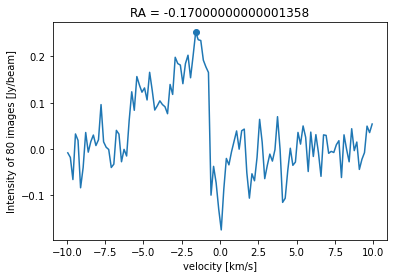

velocity: -1.5866501909703357
max_intensity: 0.2615330734224699


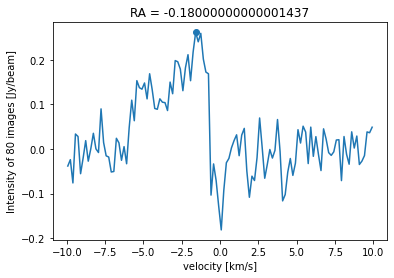

velocity: -1.252643468411442
max_intensity: 0.27957103069638833


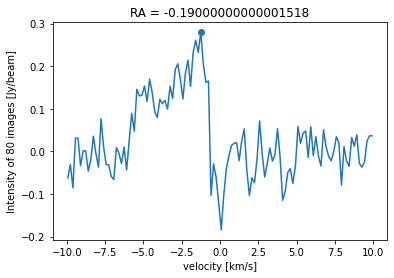

velocity: -1.252643468411442
max_intensity: 0.29191315364369075


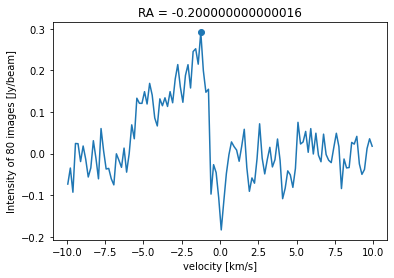

velocity: -1.252643468411442
max_intensity: 0.2931108033662895


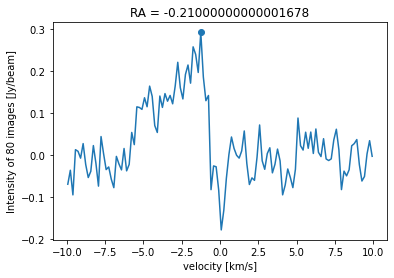

velocity: -1.252643468411442
max_intensity: 0.282330526613805


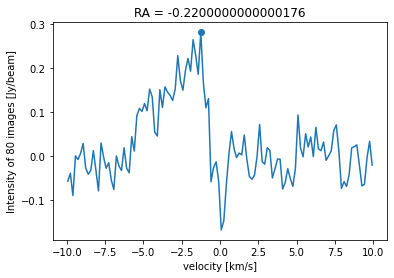

velocity: -1.7536532731247738
max_intensity: 0.263671902637725


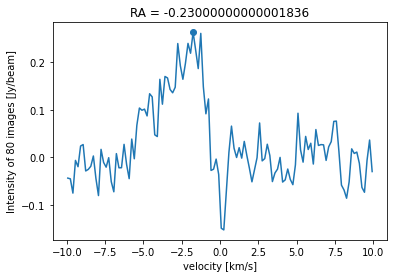

velocity: -2.0876588793231137
max_intensity: 0.26553616070305


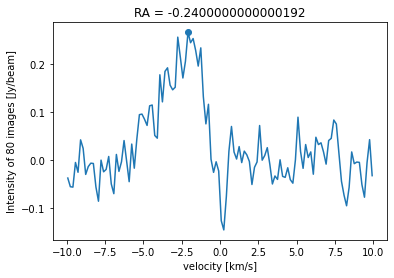

velocity: -2.0876588793231137
max_intensity: 0.2928876809310168


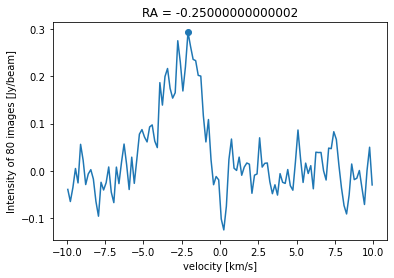

velocity: -2.0876588793231137
max_intensity: 0.3142905682325363


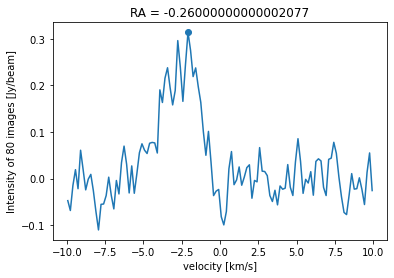

velocity: -2.0876588793231137
max_intensity: 0.3227895681047812


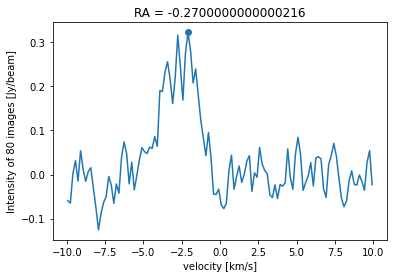

velocity: -2.755667858952192
max_intensity: 0.330690530128777


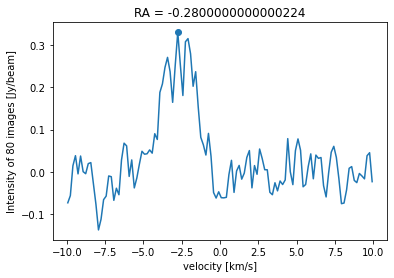

velocity: -2.2546614033205215
max_intensity: 0.33751929612481035


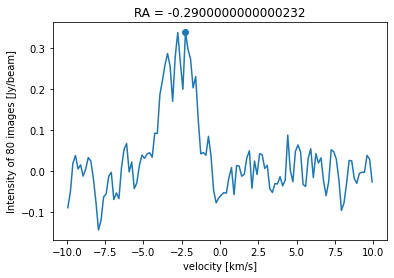

velocity: -2.2546614033205215
max_intensity: 0.35878054262138903


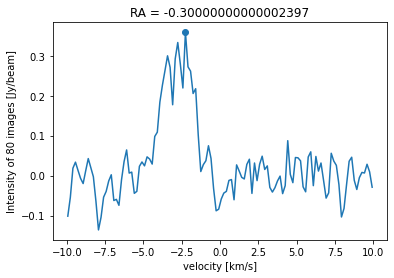

velocity: -2.2546614033205215
max_intensity: 0.37015506718307734


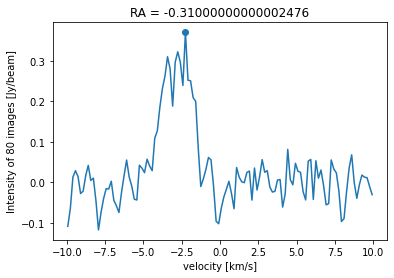

velocity: -2.2546614033205215
max_intensity: 0.3723087598627899


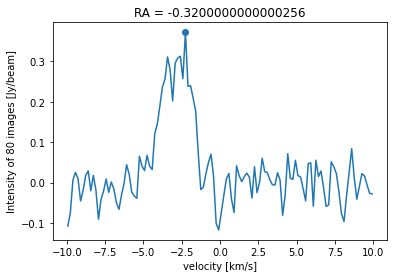

velocity: -2.2546614033205215
max_intensity: 0.3674105611862615


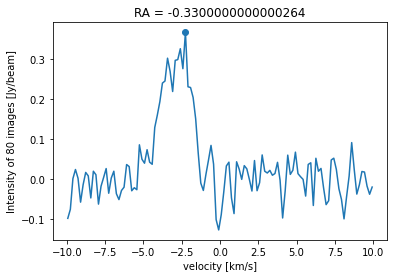

velocity: -2.2546614033205215
max_intensity: 0.3579175426857546


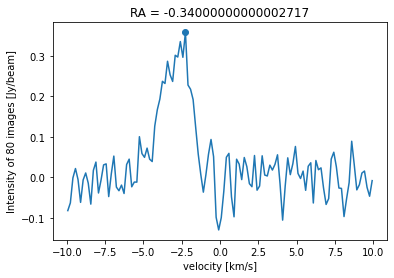

velocity: -2.2546614033205215
max_intensity: 0.34544389753136784


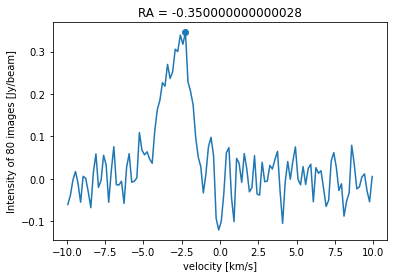

velocity: -2.4216637412500885
max_intensity: 0.33728035230888054


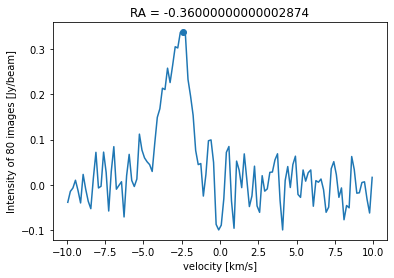

velocity: -2.4216637412500885
max_intensity: 0.3531949952302966


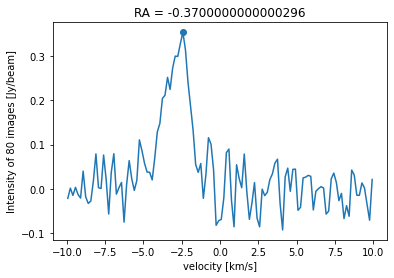

velocity: -2.4216637412500885
max_intensity: 0.3611307827741257


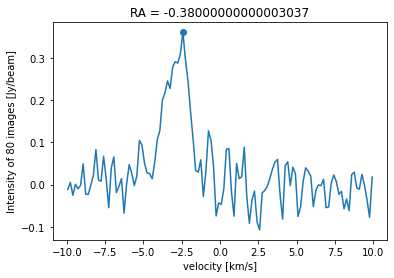

velocity: -2.4216637412500885
max_intensity: 0.3577455547565478


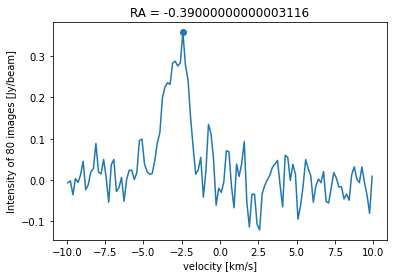

velocity: -2.4216637412500885
max_intensity: 0.3410752897034399


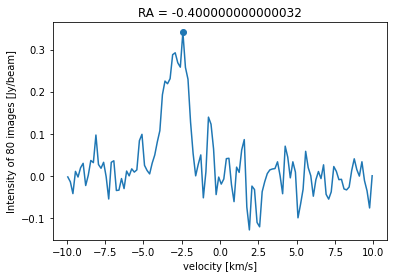

velocity: -2.4216637412500885
max_intensity: 0.3126787369546946


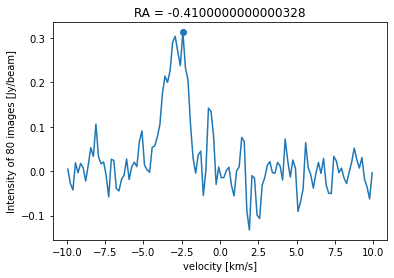

velocity: -2.9226696387247286
max_intensity: 0.31522458694416855


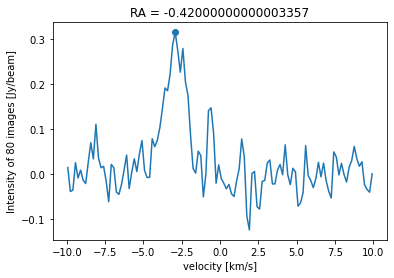

velocity: -2.9226696387247286
max_intensity: 0.32167027072955534


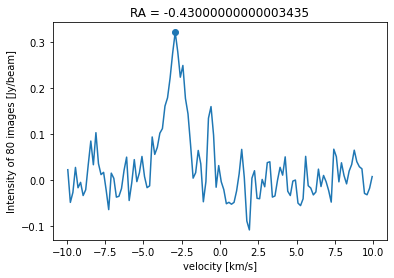

velocity: -2.9226696387247286
max_intensity: 0.32019208172278013


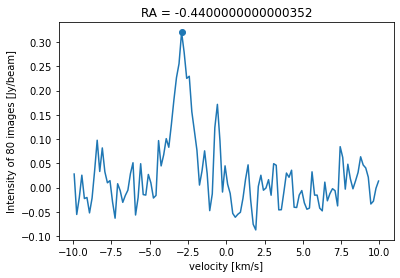

velocity: -2.9226696387247286
max_intensity: 0.3112895432163896


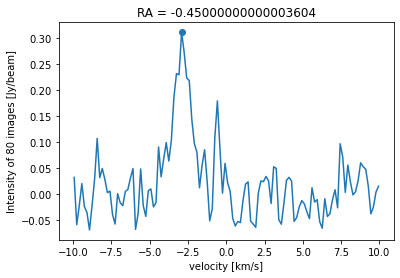

velocity: -2.9226696387247286
max_intensity: 0.29557085450687737


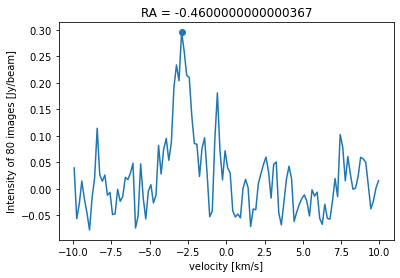

velocity: -2.9226696387247286
max_intensity: 0.27243258197268005


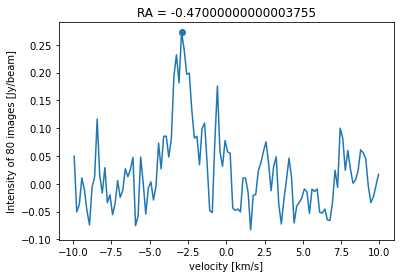

velocity: -2.9226696387247286
max_intensity: 0.2420861440259614


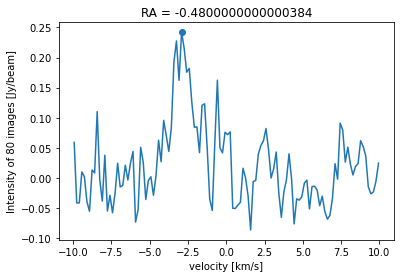

velocity: -3.256672640066278
max_intensity: 0.22142084330698708


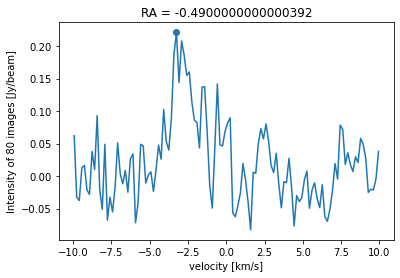

velocity: -3.256672640066278
max_intensity: 0.21060854445386212


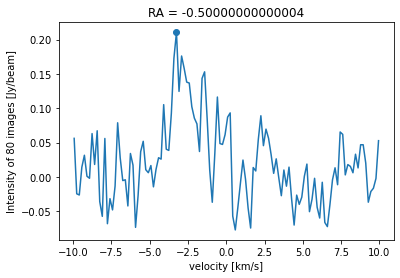

velocity: -3.256672640066278
max_intensity: 0.19300590829880093


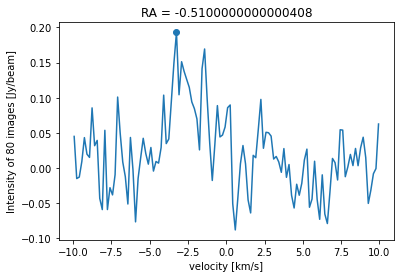

velocity: -1.419646922701563
max_intensity: 0.1843903330154717


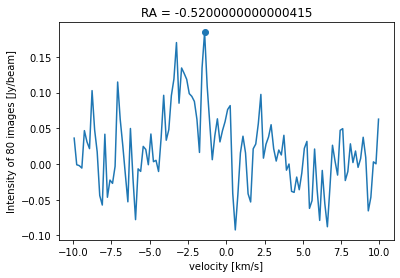

velocity: -1.419646922701563
max_intensity: 0.19486398677690886


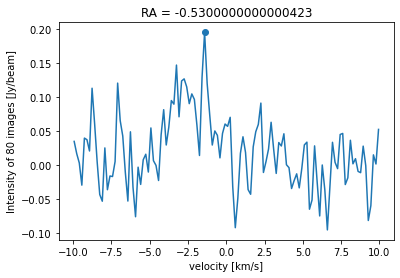

velocity: -1.419646922701563
max_intensity: 0.19758329933392815


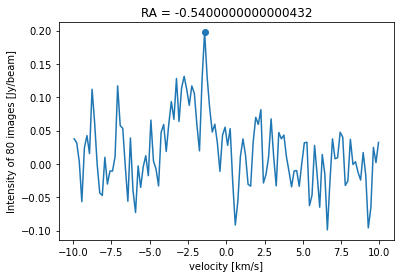

velocity: -1.419646922701563
max_intensity: 0.1921847629128024


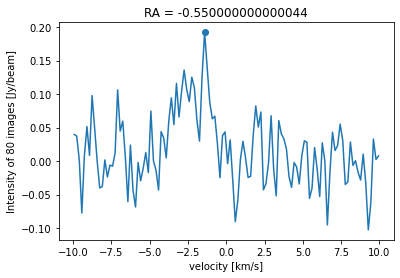

velocity: -1.419646922701563
max_intensity: 0.1808729236736326


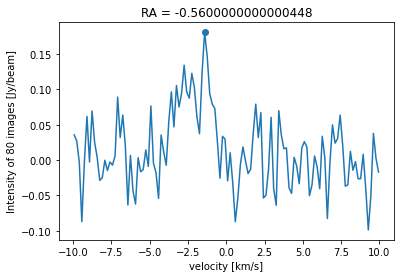

velocity: -1.419646922701563
max_intensity: 0.16659103470146874


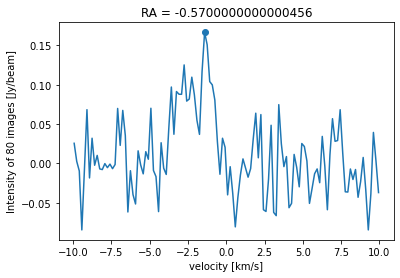

velocity: -1.419646922701563
max_intensity: 0.15141458126345242


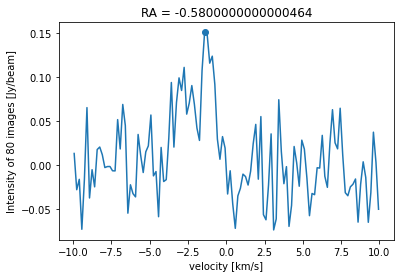

velocity: -0.9186360016276769
max_intensity: 0.1446419181957026


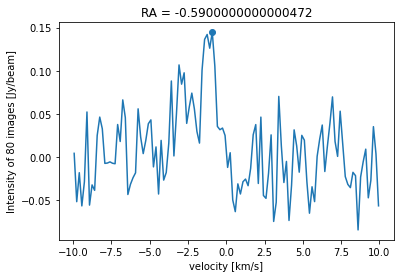

velocity: -0.9186360016276769
max_intensity: 0.1515725052649941


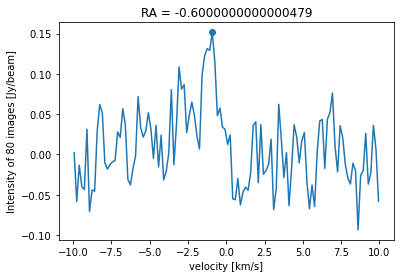

velocity: -0.9186360016276769
max_intensity: 0.14053489924117457


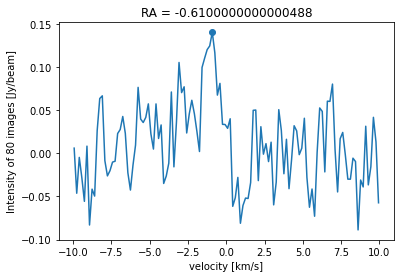

velocity: -0.5846277906190407
max_intensity: 0.12639414268778637


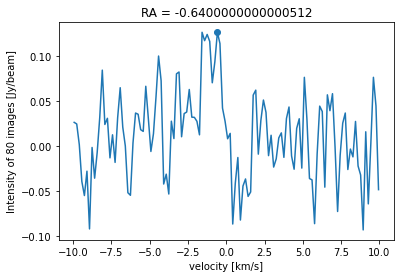

velocity: -1.5866501909703357
max_intensity: 0.14021536985819694


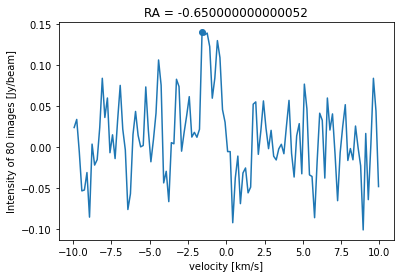

velocity: -1.419646922701563
max_intensity: 0.15933762934400875


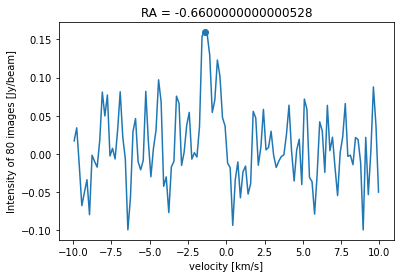

velocity: -1.419646922701563
max_intensity: 0.17876436045844457


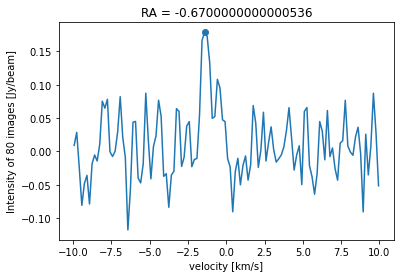

velocity: -1.419646922701563
max_intensity: 0.19179218204226345


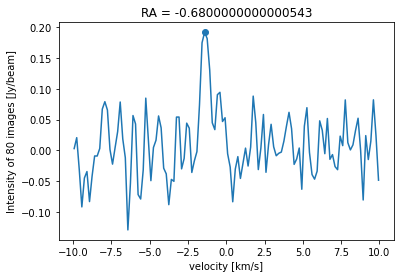

velocity: -1.419646922701563
max_intensity: 0.19711705687223002


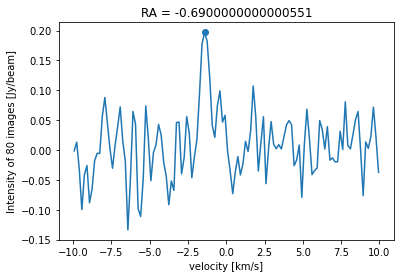

velocity: -1.419646922701563
max_intensity: 0.194132350909058


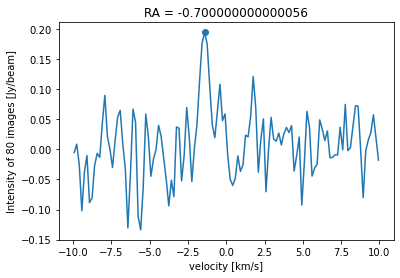

velocity: -1.419646922701563
max_intensity: 0.18325020341217169


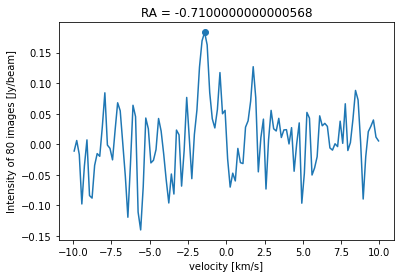

velocity: -1.419646922701563
max_intensity: 0.16771853925456526


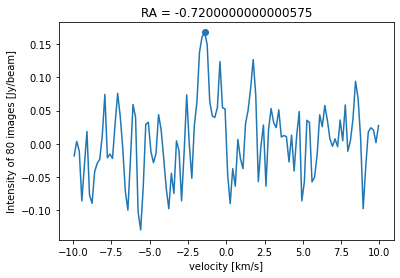

velocity: -1.5866501909703357
max_intensity: 0.15461875230903388


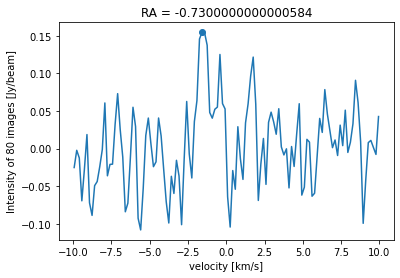

velocity: -1.5866501909703357
max_intensity: 0.1535929201709223


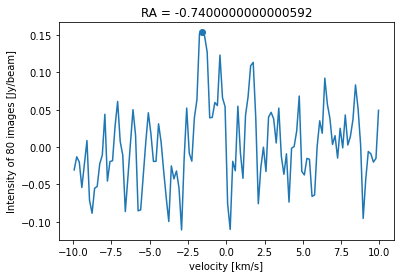

velocity: -1.7536532731247738
max_intensity: 0.1571241303208808


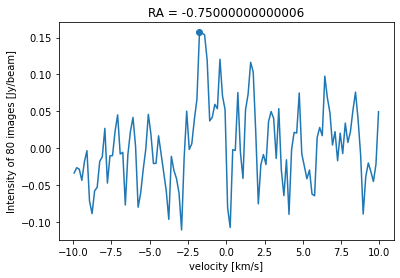

velocity: -1.419646922701563
max_intensity: 0.16377518720037187


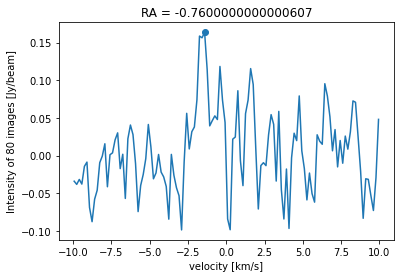

velocity: -1.419646922701563
max_intensity: 0.17036174398344883


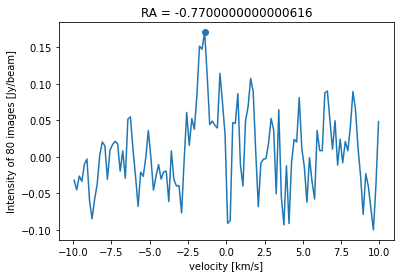

velocity: -1.419646922701563
max_intensity: 0.1654224153198811


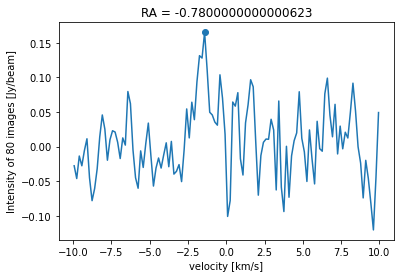

velocity: -1.419646922701563
max_intensity: 0.14746791148309057


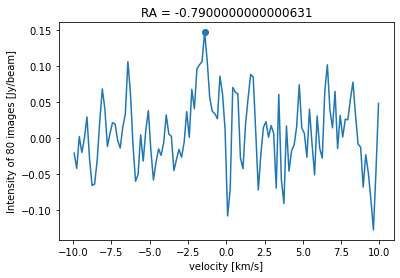

velocity: -1.252643468411442
max_intensity: 0.12940758043987444


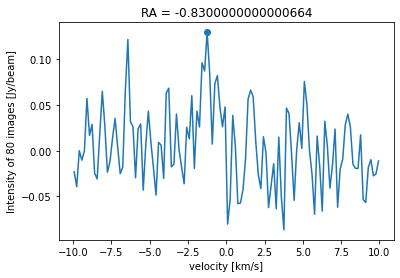

velocity: -1.252643468411442
max_intensity: 0.1422560536389028


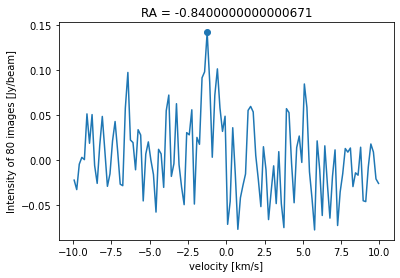

velocity: -1.252643468411442
max_intensity: 0.14951382852814277


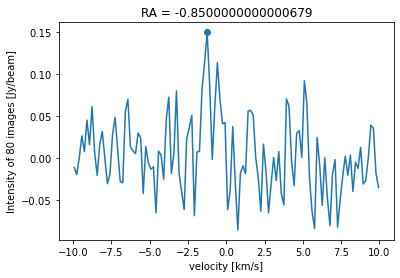

velocity: -1.252643468411442
max_intensity: 0.1485740563548461


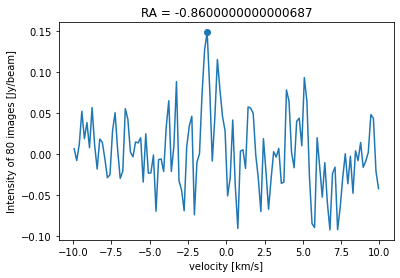

velocity: -1.252643468411442
max_intensity: 0.140045750860736


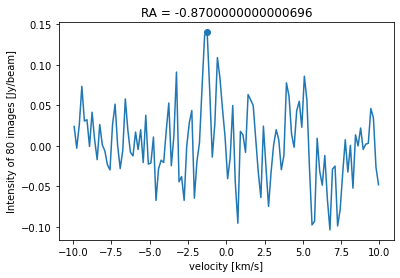

velocity: -1.419646922701563
max_intensity: 0.13894849568805512


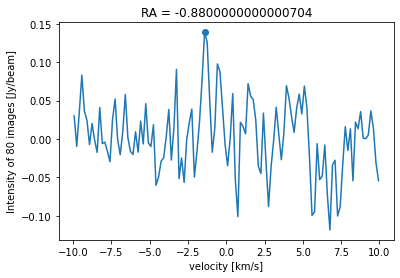

velocity: -1.419646922701563
max_intensity: 0.13615080957401915


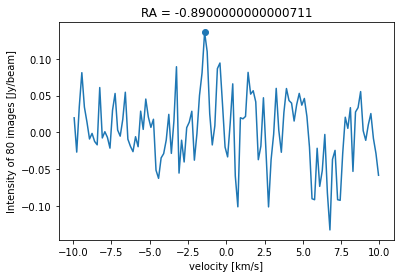

velocity: -1.419646922701563
max_intensity: 0.12902837557612656


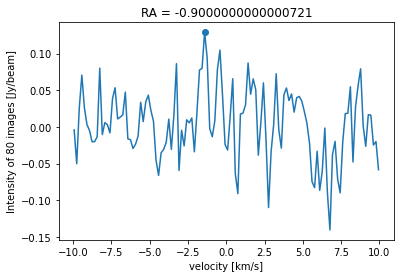

velocity: -1.7536532731247738
max_intensity: 0.12986479029495968


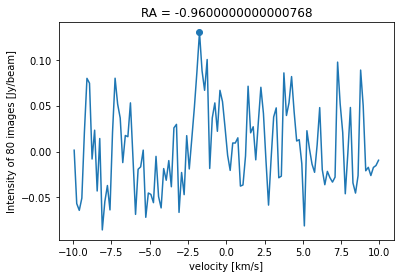

velocity: -1.7536532731247738
max_intensity: 0.1330883432583505


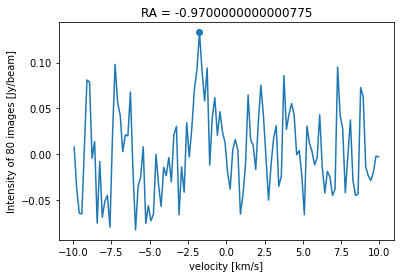

In [77]:
#liste = x_cen[0:200]
regionlist = np.linspace(0,200,200, dtype=int)
#meanint = np.mean(data_CO[:,1960, 1900])
#stdint = np.std(data_CO[:,1960, 1900])

liste = np.linspace(-1900,-2100,200, dtype=int)

#max_int = []
peakint = []
count = -1
plt.figure(figsize=(7,5))
for j, item in enumerate(liste[:],0):
    count += 1
    #print(item)
    intensity = np.zeros((data_CO[:,1960,1900].shape))
    #print(intensity.shape)
    for i in range(80): # integrating over 80 declination slices to sum the intensity?
        index = 1960+i
        intensity += data_CO[:,index, item]
        
    #peakint.append(v_cen[np.argmax(intensity)])
    
    vel = (v_cen[np.argmax(intensity)])
    #print('count:', count,'Xaxis:', x_cen[j+100])    
    max_int = np.max(intensity)
    
    
    if max_int > 0.125:
        #print(len(peakint1))
        if (vel > -5) & (vel<5):
            peakint.append(v_cen[np.argmax(intensity)])
            print('velocity:',(vel))
            print('max_intensity:',(np.max(intensity)))
    
            #print(np.argmin(intensity))
            norm = ((intensity))#-meanint))
            #stddev_intensity = np.std(norm)
            #plt.subplot(50,2,j+1); 
            plt.plot(v_cen, norm)
            #plt.hlines(stddev_intensity, -10, 20)
            #plt.hlines(-stddev_intensity, -10, 20)
            plt.scatter(v_cen[np.argmax(intensity)], np.max(norm))
            plt.xlabel('velocity [km/s]')
            plt.ylabel('Intensity of 80 images [Jy/beam]')
            plt.title(f'RA = {region[regionlist[j]]}')
            #fig.tight_layout()
            plt.show()


In [79]:


initial_M = 1.989e30 
M_sun = initial_M * u.kg

param_new, cov_new = curve_fit(kepler, datf['x'][25:70], datf['peak'][25:70], p0=[initial_M])
param_new1, cov_new1 = curve_fit(kepler, datf['x'][71:135], datf['peak'][71:135], p0=[initial_M])


fitted_M_new = param_new[0]
print('Fitted Mass_new:', fitted_M_new, 'kg')
Mnew = fitted_M_new * u.kg / M_sun
print("Mnew =", Mnew, 'solarmasses')
print('-----------------------------------------')
fitted_M_new1 = param_new1[0]
print('Fitted Mass_new:', fitted_M_new, 'kg')
Mnew1 = fitted_M_new1 * u.kg / M_sun
print("Mnew =", Mnew1, 'solarmasses')


/lustre/hpc/software/astro/anaconda/anaconda3-2021.05/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Fitted Mass_new: 90959.32768431684 kg
Mnew = 4.5731185361647487e-26 solarmasses
-----------------------------------------
Fitted Mass_new: 90959.32768431684 kg
Mnew = 8.101098450922927e-27 solarmasses


In [80]:

def pvplot(kep, x, peak):
    
    initial_M = 1.989e30 
    M_sun = initial_M * u.kg
    #print(x.shape)
    #xcen = [2000-int(len(x)/2):2000+int(len(x)/2)]
    param_new, cov_new = curve_fit(kep, x, peak, p0=[initial_M])
    fitted_M_new = param_new[0]
    print('Fitted Mass_new:', fitted_M_new, 'kg')

    Mnew = fitted_M_new * u.kg / M_sun
    print("Mnew =", Mnew, 'solarmasses')
    
    # P-V Diagram
    PV = plt.figure(figsize = (10,7))
    ke = plt.contourf(x_cen, v_cen, data_CO[:,1960:2040,1800:2200].sum(axis=1),np.arange(-1,1,0.4))
    plt.contour(x_cen, v_cen, data_CO[:,1960:2040,1800:2200].sum(axis=1),np.arange(0.1,1,0.4), colors='white')

    #plt.plot(x[:70], kep(x[:70], fitted_M_new), linestyle='--', linewidth=2,label='fit', color='r');
    #plt.plot(x[71:], kep(x[71:], fitted_M_new), linestyle='--', linewidth=2,label='fit', color='r');
    plt.plot(x/1e10, kep(x, fitted_M_new), linestyle='--', linewidth=2,label='fit', color='r');
    
    plt.scatter(x, peak,label='data')
    
    #if kep == kepler:
    #    print('This is kepler with -x/abs(x)')
    #else:
    #    print('This is kepler without -x/abs(x)')
        

    #colorbar
    cbar = plt.colorbar(ke)
    cbar.set_label('[Jy/beam km/s]', labelpad=25, y=0.5, rotation=270);

    plt.title('P-V diagram with Kepler fit')
    plt.tight_layout()
    plt.xlabel('RA["]')
    plt.ylabel('Velocity [km/s]')
    #plt.xlim(-1,1)
    #plt.ylim(-10,10)
    #plt.savefig('PVkepler.png')
    plt.legend()
    plt.show();

In [81]:
from scipy.ndimage import uniform_filter1d
y = datf['peak'][20:138]
y_smooth = uniform_filter1d(y,size=3)
y_smooth

array([-1.41964692, -1.41964692, -1.41964692, -1.53098237, -1.58665013,
       -1.64231789, -1.53098243, -1.47531468, -1.41964692, -1.41964692,
       -1.41964692, -1.41964692, -1.41964692, -1.47531468, -1.19697497,
       -1.14130715, -0.9743037 , -1.08563977, -0.97430394, -0.918636  ,
       -1.08563964, -1.25264328, -1.41964692, -1.41964692, -1.41964692,
       -1.41964692, -1.41964692, -2.03198883, -2.64433073, -3.25667264,
       -3.14533831, -3.03400397, -2.92266964, -2.92266964, -2.92266964,
       -2.92266964, -2.92266964, -2.75566767, -2.58866571, -2.42166374,
       -2.42166374, -2.42166374, -2.42166374, -2.3659963 , -2.31032885,
       -2.2546614 , -2.2546614 , -2.2546614 , -2.2546614 , -2.2546614 ,
       -2.42166356, -2.36599605, -2.31032854, -2.08765888, -2.08765888,
       -1.97632368, -1.69798521, -1.41964674, -1.25264347, -1.25264347,
       -1.36397904, -1.47531462, -1.58665019, -1.58665019, -1.58665019,
       -1.58665019, -1.58665019, -1.41964674, -1.25264328, -1.08

Fitted Mass_new: 62125.92518702304 kg
Mnew = 3.123475373907644e-26 solarmasses


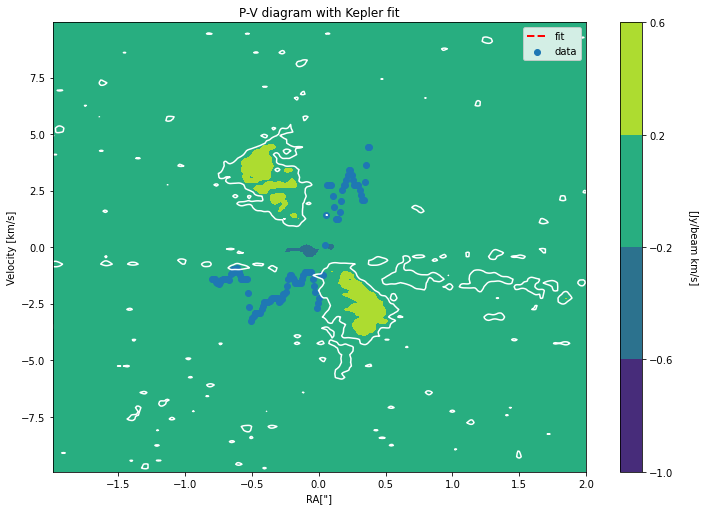

/lustre/hpc/software/astro/anaconda/anaconda3-2021.05/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Fitted Mass_new: 19380.300683068483 kg
Mnew = 9.743740916575407e-27 solarmasses


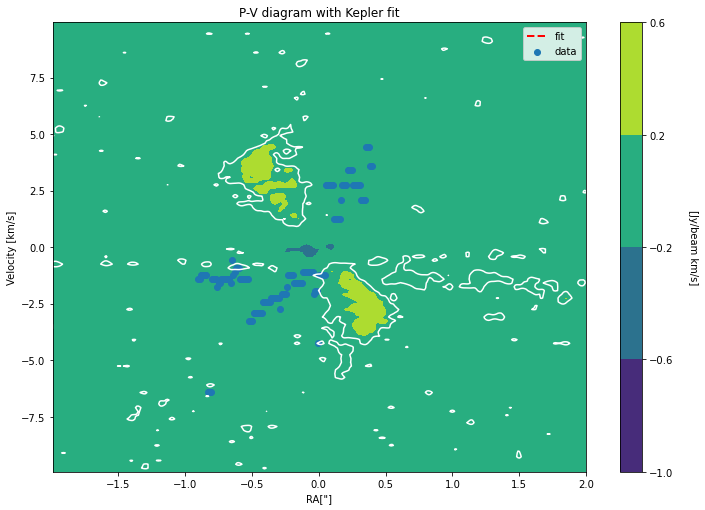

In [82]:
pvplot(kepler, datf['x'][20:138], y_smooth)
pvplot(kepler, datf['x'][10:140], datf['peak'][10:140])

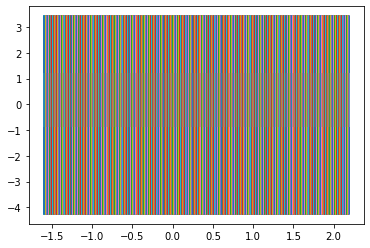

<class 'NameError'>: name 'X2' is not defined

In [84]:
plt.plot(X[40:130], datf['peak'][40:130])
le1 = 50
ri1 = 140
le2 = 50
ri2 = 140

plt.plot(X2[le1:ri1], datf['peak'][le2:ri2])

In [85]:

x_cen[0:200]
liste = x_cen[0:200].astype(int)
#liste

In [86]:
with pd.option_context('display.max_rows', None,):
    print(datf[:71])

           x      peak
0  -1.000000 -7.264651
1  -0.989950 -1.753653
2  -0.979899 -1.753653
3  -0.969849 -1.753653
4  -0.959799 -1.753653
5  -0.949749  8.767904
6  -0.939698  8.767904
7  -0.929648 -0.417623
8  -0.919598 -1.419647
9  -0.909548 -1.419647
10 -0.899497 -1.419647
11 -0.889447 -1.419647
12 -0.879397 -1.252643
13 -0.869347 -1.252643
14 -0.859296 -1.252643
15 -0.849246 -1.252643
16 -0.839196 -1.252643
17 -0.829146 -6.429664
18 -0.819095 -6.429664
19 -0.809045 -6.429664
20 -0.798995 -1.419647
21 -0.788945 -1.419647
22 -0.778894 -1.419647
23 -0.768844 -1.419647
24 -0.758794 -1.753653
25 -0.748744 -1.586650
26 -0.738693 -1.586650
27 -0.728643 -1.419647
28 -0.718593 -1.419647
29 -0.708543 -1.419647
30 -0.698492 -1.419647
31 -0.688442 -1.419647
32 -0.678392 -1.419647
33 -0.668342 -1.419647
34 -0.658291 -1.586650
35 -0.648241 -0.584628
36 -0.638191 -1.252643
37 -0.628141 -1.085640
38 -0.618090 -0.918636
39 -0.608040 -0.918636
40 -0.597990 -0.918636
41 -0.587940 -1.419647
42 -0.57788

In [87]:
#pvplot(kepler1, x_all[60:140], peakdel[40:120])

In [88]:
#pvplot(kepler1, x_all2[60:140], peakdel[40:120])

In [89]:
initial_M = 1.989e30 
M_sun = initial_M * u.kg
FIT = 1.2 * M_sun
print("Fitted Mass_new , Mnew =", FIT, '')

Fitted Mass_new , Mnew = 2.3867999999999998e+30 kg 


# SED plots

dataframe converted data
      ra (deg)  dec (deg)  wavelength (mu)  flux_density (mJy)  error (mJy)  \
0   166.693696 -77.375617         2.163785                2.46         0.38   
54  166.693556 -77.376976         2.163785                1.92         0.18   
52  166.693255 -77.374657         2.163785                2.91         0.29   
5   166.693696 -77.375617         2.163785                2.46         0.38   
36  166.694084 -77.375710         2.163785                2.46         0.38   
..         ...        ...              ...                 ...          ...   
65  166.666600 -77.381500       349.816170           311000.00     30000.00   
63  166.672400 -77.381800       550.077905           114000.00      7000.00   
61  166.721500 -77.378800       849.270419            26500.00      1700.00   
18  166.693333 -77.375556       855.010860             2400.00       480.00   
64  166.666600 -77.381500      1381.532065             5810.00       750.00   

    distance (")      orig

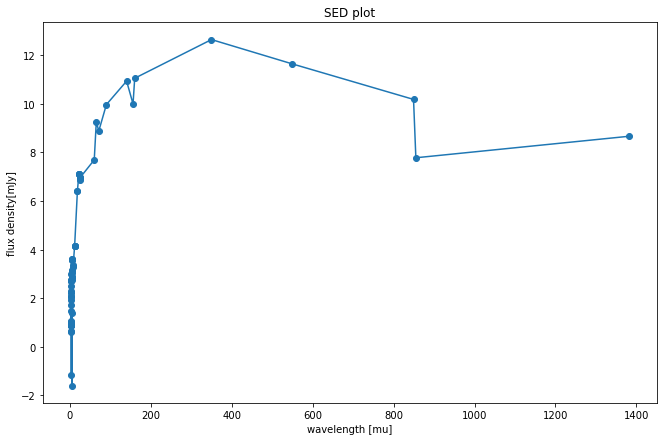

In [90]:
# importing pandas
import pandas as pd

name = 'Ced110IRS4.sed'
def sed(name):
    # read text file into pandas DataFrame
    df = pd.read_csv(direct+name, sep="\t",skiprows=9)
  
    # display DataFrame
    print('dataframe converted data')
    df = df.sort_values(by='wavelength (mu)')
    print(df)
    #print('-----------------------------------------------------------------------------')
    
    #print('Wavelength')
    WL = df['wavelength (mu)'].values
    #print(WL)
    #print('-----------------------------------------------------------------------------')
    
    #print('flux_density')
    FD = df['flux_density (mJy)'].values
    #print(FD)
    #print('-----------------------------------------------------------------------------')
    

    # plotting the before and after rotating the data
    plt.figure(1, figsize = (11,7))

    #plt.subplot(221)
    #plt.scatter(WL, FD);
    #plt.title('scatter plot SED')
    #plt.ylabel('flux density[mJy]')
    #plt.xlabel('wavelength [mu]');


    #plt.subplot(222)
    plt.scatter(WL, np.log(FD))
    plt.plot(WL, np.log(FD))
    #plt.xlim(-20,1000)
    plt.title('SED plot')
    plt.ylabel('flux density[mJy]')
    plt.xlabel('wavelength [mu]');


    plt.show();
    #plt.savefig('rotate.png')
    return FD, WL, df


FD, WL, df = sed(name)

In [91]:

df[WL>700]

,ra (deg),dec (deg),wavelength (mu),flux_density (mJy),error (mJy),"distance ("")",origin,table
61,166.721500,-77.378800,849.270419,26500.0,1700.0,24.839927,@{Freq},VIII/88/erc
18,166.693333,-77.375556,855.010860,2400.0,480.0,0.237966,SCUBA:850,J/ApJS/220/11/fluxobs
64,166.666600,-77.381500,1381.532065,5810.0,750.0,29.953312,Planck:217,VIII/88/erc


In [92]:
print('WL:',df['wavelength (mu)'][61])
print('WL:',df['wavelength (mu)'][18])
print('WL:',df['wavelength (mu)'][64])

print('FD:',df['flux_density (mJy)'][61])
print('FD:',df['flux_density (mJy)'][18])
print('FD:',df['flux_density (mJy)'][64])

WL: 849.270419263456
WL: 855.0108604511878
WL: 1381.532064516129
FD: 26500.0
FD: 2400.0
FD: 5810.0


In [93]:
WL[65]
WLL = np.delete(WL,65)
FD[65]
FDD = np.delete(FD,65)

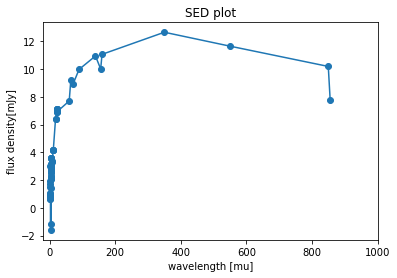

In [94]:

plt.scatter(WLL, np.log(FDD))
plt.plot(WLL, np.log(FDD))
plt.xlim(-20,1000)
plt.title('SED plot')
plt.ylabel('flux density[mJy]')
plt.xlabel('wavelength [mu]');

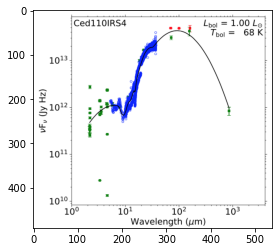

In [95]:
from matplotlib import image

# load image as pixel array
image = image.imread(direct+'SED.png')
# display the array of pixels as an image
plt.imshow(image)
plt.show()

In [ ]:
# Flux data taken from the IRSA database are shown in green, 
#and Spitzer IRS spectra are shown in blue. Herschel PACS/SPIRE data are shown in red. 
#Deconvolved GSS 30 IRS3 data taken from Je et al. (2015) are shown in orange. 
#B335 flux data shown in purple are taken from Evans et al. (2023), 
#and Herschel PACS/SPIRE spectral data shown in red are taken from Green et al. (2016)

In [ ]:
sed = pd.read_csv(direct+'SED.csv')

sed

In [ ]:
sedflux = sed['_sed_flux'].values
sedfreq = sed['_sed_freq'].values

plt.scatter(-np.log(sedfreq), np.log(sedflux));

In [ ]:
WLL = 2.99*10**8 / sedfreq
len(WLL)

In [ ]:
plt.scatter(WLL, np.log(sedflux));

In [ ]:
# ridge & edge --> SAI

In [ ]:
td = pd.read_csv(direct+'Trimmed.csv')
td = td.sort_values(by='wavelength (mu)')
wav = td['wavelength (mu)'].values
flu = td['flux_density (mJy)'].values
td['origin']

In [ ]:

plt.scatter(np.log(wav), np.log(flu))
#plt.plot(np.log(wav), np.log(flu))
#plt.xlim(-20,1000)
plt.title('SED plot')
plt.ylabel('flux density[mJy]')
plt.xlabel('wavelength [mu]');

In [ ]:
# L = F / (4*np.pi * r**2)
r = 1 # soalr radius
Ftot = np.trapz(np.log(flu), np.log(wav))
L = F / 4*np.pi*1